**1000 IMDB movies (2006-2016)**

**Author:** Prarthna Nemade

**ABSTRACT**

*   Performing data cleaning on a dataset.
*   Using AutoML's H2O library and performing regularization, hyperparameter tuning and predicting best model for the dataset
*   Interpreting the models:
    1. Fitting a linear model and interpreting the regression coefficients

    2. Fitting a tree-based model and interpreting the nodes

    3.  Using auto ml to find the best model

    4. Run SHAP analysis on the models, interpreting the SHAP values

In [268]:
# Importing all libraries necessary 
!pip install shap
!pip install lime
!pip install requests
!pip install tabulate
!pip install "colorama>=0.3.8"
!pip install future
!pip install --upgrade h2o
!pip install --upgrade scikit-learn


import pandas as pd
import shap
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OrdinalEncoder, StandardScaler, OneHotEncoder
from sklearn_pandas import DataFrameMapper
from sklearn.impute import SimpleImputer
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import r2_score
import statsmodels.api as sm
import numpy as np
import matplotlib.pyplot as plt
import lime
from lime import lime_tabular
import random
from sklearn.ensemble import RandomForestRegressor
from sklearn.inspection import PartialDependenceDisplay
from sklearn.inspection import partial_dependence
from matplotlib.pyplot import figure
from sklearn.tree import export_graphviz
import pydot
import matplotlib.image as mpimg
import h2o
from h2o.automl import H2OAutoML
from h2o.estimators.gbm import H2OGradientBoostingEstimator
from h2o.grid.grid_search import H2OGridSearch
import random, os, sys
from datetime import datetime
import logging
import csv
import optparse
import time
import json
from distutils.util import strtobool
import psutil
from matplotlib.pyplot import figure
import numpy as np
import pandas as pd
import matplotlib.pylab as plt
import seaborn as sns

plt.rcParams["figure.figsize"] = (32, 24)

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [2]:
# Setting up maximum runtime for the AutoML
min_mem_size = 6
run_time = 222

In [3]:
pct_memory = 0.5
virtual_memory = psutil.virtual_memory()
min_mem_size = int(round(int(pct_memory * virtual_memory.available) / 1073741824, 0))
print(min_mem_size)

6


In [4]:
# 65535 Highest port no
# Start the H2O server on a random port
port_no = random.randint(5555, 55555)

#  h2o.init(strict_version_check=False,min_mem_size_GB=min_mem_size,port=port_no) # start h2o
try:
    h2o.init(
        strict_version_check=False, min_mem_size_GB=min_mem_size, port=port_no
    )  # start h2o
except:
    logging.critical("h2o.init")
    h2o.download_all_logs(dirname=logs_path, filename=logfile)
    h2o.cluster().shutdown()
    sys.exit(2)

Checking whether there is an H2O instance running at http://localhost:10399..... not found.
Attempting to start a local H2O server...
  Java Version: openjdk version "11.0.18" 2023-01-17; OpenJDK Runtime Environment (build 11.0.18+10-post-Ubuntu-0ubuntu120.04.1); OpenJDK 64-Bit Server VM (build 11.0.18+10-post-Ubuntu-0ubuntu120.04.1, mixed mode, sharing)
  Starting server from /usr/local/lib/python3.9/dist-packages/h2o/backend/bin/h2o.jar
  Ice root: /tmp/tmphxgmuzqy
  JVM stdout: /tmp/tmphxgmuzqy/h2o_unknownUser_started_from_python.out
  JVM stderr: /tmp/tmphxgmuzqy/h2o_unknownUser_started_from_python.err
  Server is running at http://127.0.0.1:10399
Connecting to H2O server at http://127.0.0.1:10399 ... successful.


H2O_cluster_uptime:,05 secs
H2O_cluster_timezone:,Etc/UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.40.0.3
H2O_cluster_version_age:,3 days
H2O_cluster_name:,H2O_from_python_unknownUser_v9s1pv
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,6 Gb
H2O_cluster_total_cores:,2
H2O_cluster_allowed_cores:,2
H2O_cluster_status:,"locked, healthy"


In [5]:
df = pd.read_csv("https://github.com/PrarthanaNemade14/Model_Interpretability/raw/main/imdb.csv")

In [6]:
# Printing numerical and categorical columns

numeric_columns = []
categorical_columns = []

# Iterate through each column in the dataset
for column in df.columns:
    # Checking if the column is of numeric data type
    if df[column].dtype in ['int64', 'float64']:
        numeric_columns.append(column)
    # Check if the column is of categorical data type
    elif df[column].dtype in ['object']:
        categorical_columns.append(column)

# Print
print("The Numeric and Categorical values are:")
print("----------------------------------------")
print("Numeric Columns:", numeric_columns)

# Print 
print("\nCategorical Columns:", categorical_columns)

The Numeric and Categorical values are:
----------------------------------------
Numeric Columns: ['Rank', 'Year', 'Runtime (Minutes)', 'Rating', 'Votes', 'Revenue (Millions)', 'Metascore']

Categorical Columns: ['Title', 'Genre', 'Description', 'Director', 'Actors']


In [7]:
df.isna().sum()

Rank                    0
Title                   0
Genre                   0
Description             0
Director                0
Actors                  0
Year                    0
Runtime (Minutes)       0
Rating                  0
Votes                   0
Revenue (Millions)    128
Metascore              64
dtype: int64

In [8]:
# Imputing the null values for "Revenue"

null_val = ['Revenue (Millions)']

#Technique 1: Using mean to impute the missing values
for i in null_val:
 df.loc[df.loc[:,i].isna(),i] = df.loc[:,i].mean()

 

In [9]:
df.isna().sum()

Rank                   0
Title                  0
Genre                  0
Description            0
Director               0
Actors                 0
Year                   0
Runtime (Minutes)      0
Rating                 0
Votes                  0
Revenue (Millions)     0
Metascore             64
dtype: int64

In [10]:
# Imputing the null values for "Metascore" using KNN

from sklearn.impute import KNNImputer

null_value = df.iloc[:, 11:12]

# Create an imputer object
imputer = KNNImputer(n_neighbors=5)

# Fit the imputer to the column
null_value_imputed = imputer.fit_transform(null_value)

# Replace the original column with the imputed column
df.iloc[:, 11:12] = null_value_imputed

In [11]:
df.isna().sum()

Rank                  0
Title                 0
Genre                 0
Description           0
Director              0
Actors                0
Year                  0
Runtime (Minutes)     0
Rating                0
Votes                 0
Revenue (Millions)    0
Metascore             0
dtype: int64

In [12]:
df.describe()

,Rank,Year,Runtime (Minutes),Rating,Votes,Revenue (Millions),Metascore
count,1000.000000,1000.000000,1000.000000,1000.000000,1.000000e+03,1000.000000,1000.000000
mean,500.500000,2012.783000,113.172000,6.723200,1.698083e+05,82.956376,58.985043
std,288.819436,3.205962,18.810908,0.945429,1.887626e+05,96.412043,16.634858
min,1.000000,2006.000000,66.000000,1.900000,6.100000e+01,0.000000,11.000000
25%,250.750000,2010.000000,100.000000,6.200000,3.630900e+04,17.442500,47.750000
50%,500.500000,2014.000000,111.000000,6.800000,1.107990e+05,60.375000,58.985043
75%,750.250000,2016.000000,123.000000,7.400000,2.399098e+05,99.177500,71.000000
max,1000.000000,2016.000000,191.000000,9.000000,1.791916e+06,936.630000,100.000000


This table shows summary statistics for a dataset with 1000 observations and 07 variables.

The variables are: Rank, Year, Runtime (Minutes), Rating, Votes, Revenue(Millions), Metascore.

The "count" row shows the number of observations for each variable, while the "mean" row shows the average value of each variable.

The "std" row shows the standard deviation of each variable, which is a measure of how much the values vary from the mean.

The "min" and "max" rows show the smallest and largest values observed for each variable.

The "25%", "50%", and "75%" rows show the values at the 25th, 50th, and 75th percentiles of the distribution, respectively.

These percentiles divide the observations into quarters, with the 25th percentile being the value below which 25% of the observations fall, and so on.

In [13]:
from sklearn.preprocessing import OneHotEncoder
import pandas as pd

# extract categorical columns
cat_cols = df.select_dtypes(include=['object']).columns.tolist()

# one-hot encode categorical columns
encoder = OneHotEncoder()
encoded_cols = encoder.fit_transform(df[cat_cols])
encoded_cols_df = pd.DataFrame(encoded_cols.toarray(), columns=encoder.get_feature_names_out(cat_cols))

# replace categorical columns with encoded columns
data = df.drop(columns=cat_cols)
data = pd.concat([data, encoded_cols_df], axis=1)

# use data for training
x_train = data.drop(columns=['Votes'])
y_train = data['Votes']


In [14]:
data

,Rank,Year,Runtime (Minutes),Rating,Votes,Revenue (Millions),Metascore,Title_(500) Days of Summer,Title_10 Cloverfield Lane,Title_10 Years,...,"Actors_Zach Galifianakis, Bradley Cooper, Justin Bartha, Ed Helms","Actors_Zach Galifianakis, Isla Fisher, Jon Hamm, Gal Gadot","Actors_Zach Galifianakis, Kristen Wiig, Owen Wilson, Ross Kimball","Actors_Zachary Gordon, Devon Bostick, Robert Capron,Rachael Harris","Actors_Zachary Gordon, Robert Capron, Devon Bostick,Steve Zahn","Actors_Zachary Gordon, Robert Capron, Rachael Harris,Steve Zahn","Actors_Zoey Deutch, James Franco, Tangie Ambrose,Cedric the Entertainer","Actors_Zoey Deutch, Lucy Fry, Danila Kozlovsky, Gabriel Byrne","Actors_Zoey Deutch, Nicholas Braun, Mateo Arias, Israel Broussard","Actors_Zooey Deschanel, Joseph Gordon-Levitt, Geoffrey Arend, Chloë Grace Moretz"
0,1,2014,121,8.1,757074,333.130000,76.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,2,2012,124,7.0,485820,126.460000,65.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,3,2016,117,7.3,157606,138.120000,62.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,4,2016,108,7.2,60545,270.320000,59.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,5,2016,123,6.2,393727,325.020000,40.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,996,2015,111,6.2,27585,82.956376,45.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
996,997,2007,94,5.5,73152,17.540000,46.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
997,998,2008,98,6.2,70699,58.010000,50.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
998,999,2014,93,5.6,4881,82.956376,22.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [15]:
# Concatenate the encoded column with the original dataframe
df = pd.concat([df, data], axis=1)
df.head()

,Rank,Title,Genre,Description,Director,Actors,Year,Runtime (Minutes),Rating,Votes,...,"Actors_Zach Galifianakis, Bradley Cooper, Justin Bartha, Ed Helms","Actors_Zach Galifianakis, Isla Fisher, Jon Hamm, Gal Gadot","Actors_Zach Galifianakis, Kristen Wiig, Owen Wilson, Ross Kimball","Actors_Zachary Gordon, Devon Bostick, Robert Capron,Rachael Harris","Actors_Zachary Gordon, Robert Capron, Devon Bostick,Steve Zahn","Actors_Zachary Gordon, Robert Capron, Rachael Harris,Steve Zahn","Actors_Zoey Deutch, James Franco, Tangie Ambrose,Cedric the Entertainer","Actors_Zoey Deutch, Lucy Fry, Danila Kozlovsky, Gabriel Byrne","Actors_Zoey Deutch, Nicholas Braun, Mateo Arias, Israel Broussard","Actors_Zooey Deschanel, Joseph Gordon-Levitt, Geoffrey Arend, Chloë Grace Moretz"
0,1,Guardians of the Galaxy,"Action,Adventure,Sci-Fi",A group of intergalactic criminals are forced ...,James Gunn,"Chris Pratt, Vin Diesel, Bradley Cooper, Zoe S...",2014,121,8.1,757074,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,2,Prometheus,"Adventure,Mystery,Sci-Fi","Following clues to the origin of mankind, a te...",Ridley Scott,"Noomi Rapace, Logan Marshall-Green, Michael Fa...",2012,124,7.0,485820,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,3,Split,"Horror,Thriller",Three girls are kidnapped by a man with a diag...,M. Night Shyamalan,"James McAvoy, Anya Taylor-Joy, Haley Lu Richar...",2016,117,7.3,157606,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,4,Sing,"Animation,Comedy,Family","In a city of humanoid animals, a hustling thea...",Christophe Lourdelet,"Matthew McConaughey,Reese Witherspoon, Seth Ma...",2016,108,7.2,60545,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,5,Suicide Squad,"Action,Adventure,Fantasy",A secret government agency recruits some of th...,David Ayer,"Will Smith, Jared Leto, Margot Robbie, Viola D...",2016,123,6.2,393727,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [16]:
X = data.iloc[:,:-1]
X

,Rank,Year,Runtime (Minutes),Rating,Votes,Revenue (Millions),Metascore,Title_(500) Days of Summer,Title_10 Cloverfield Lane,Title_10 Years,...,"Actors_Zac Efron, Wes Bentley, Emily Ratajkowski, Jonny Weston","Actors_Zach Galifianakis, Bradley Cooper, Justin Bartha, Ed Helms","Actors_Zach Galifianakis, Isla Fisher, Jon Hamm, Gal Gadot","Actors_Zach Galifianakis, Kristen Wiig, Owen Wilson, Ross Kimball","Actors_Zachary Gordon, Devon Bostick, Robert Capron,Rachael Harris","Actors_Zachary Gordon, Robert Capron, Devon Bostick,Steve Zahn","Actors_Zachary Gordon, Robert Capron, Rachael Harris,Steve Zahn","Actors_Zoey Deutch, James Franco, Tangie Ambrose,Cedric the Entertainer","Actors_Zoey Deutch, Lucy Fry, Danila Kozlovsky, Gabriel Byrne","Actors_Zoey Deutch, Nicholas Braun, Mateo Arias, Israel Broussard"
0,1,2014,121,8.1,757074,333.130000,76.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,2,2012,124,7.0,485820,126.460000,65.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,3,2016,117,7.3,157606,138.120000,62.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,4,2016,108,7.2,60545,270.320000,59.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,5,2016,123,6.2,393727,325.020000,40.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,996,2015,111,6.2,27585,82.956376,45.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
996,997,2007,94,5.5,73152,17.540000,46.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
997,998,2008,98,6.2,70699,58.010000,50.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
998,999,2014,93,5.6,4881,82.956376,22.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [17]:
y = data['Votes']
y

0      757074
1      485820
2      157606
3       60545
4      393727
        ...  
995     27585
996     73152
997     70699
998      4881
999     12435
Name: Votes, Length: 1000, dtype: int64

<Axes: >

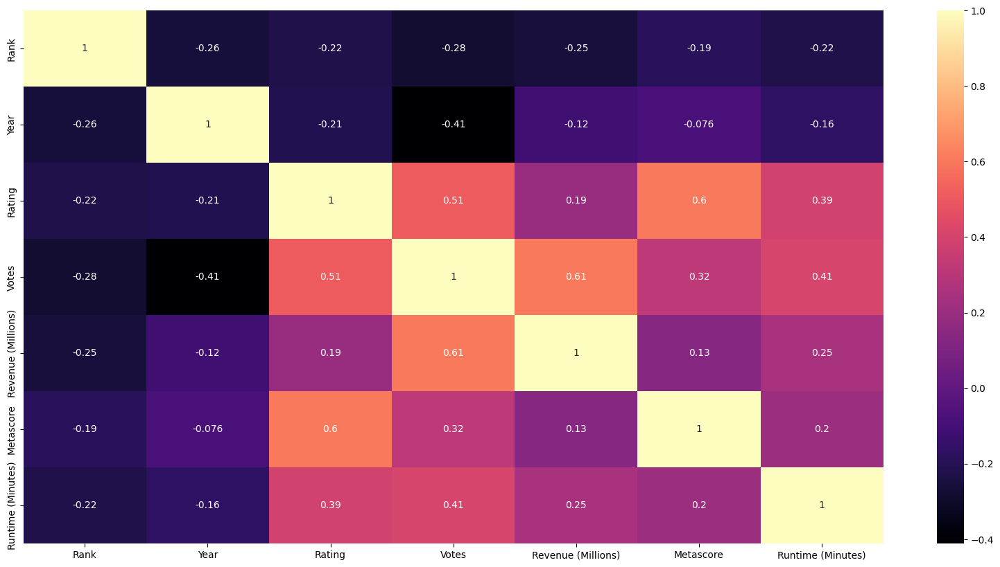

In [220]:
plt.rcParams["figure.figsize"] = (20, 10)
sns.heatmap(
    data.corr(), annot=True, cmap="magma"
)  # Heatmap showing correlation between the attributes.


**CORRELATION ANALYSIS:**

The graph above depicts the correlation between various features in the dataset. The heatmap shows a color matrix that represents the strength of the correlation between two variables.

A correlation coefficient, such as the Pearson correlation coefficient, can be used to calculate the correlation between two variables. This coefficient measures the linear relationship between two variables, with values ranging from -1 (perfect negative correlation) to 1 (perfect positive correlation) (perfect positive correlation). A value of 0 indicates that there is no correlation.

The correlation coefficients are represented as colors in a matrix in the heatmap above, with each variable plotted on both the x and y axes. The color of each cell in the matrix represents the strength of the correlation between the corresponding pair of variables, with a color scale ranging from low (e.g., light color) to high (e.g., dark color).

A correlation heatmap can assist in determining the relationships between variables in a dataset. It can be used to identify patterns and trends, as well as variables that are strongly correlated (either positively or negatively). This data can be used for exploratory data analysis as well as identifying potential predictors in statistical models.

Plotting all variables against each other to see if there is a relationship between them. It essentially tells the same story as the correlation matrix, but in a graphical format.

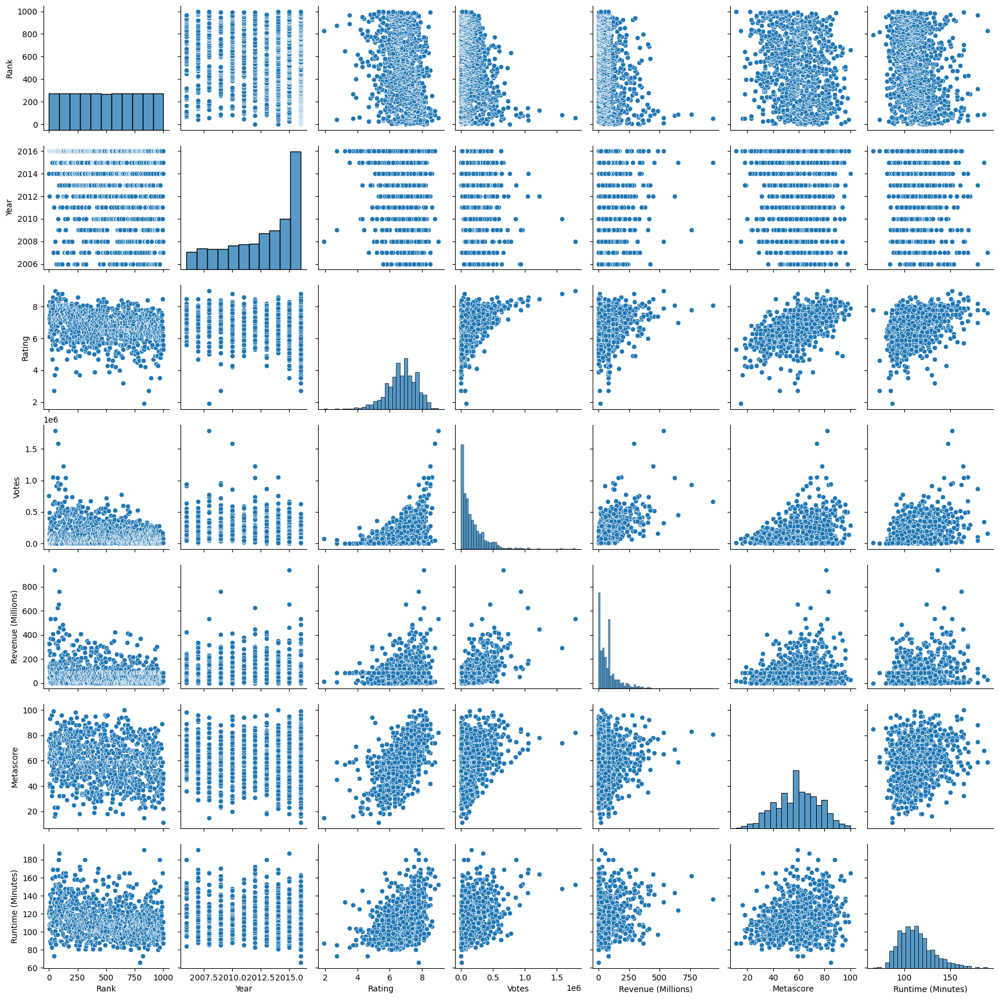

In [223]:
#Checking the Colinearity

sns.pairplot(
    data
) 

<Figure size 800x500 with 0 Axes>

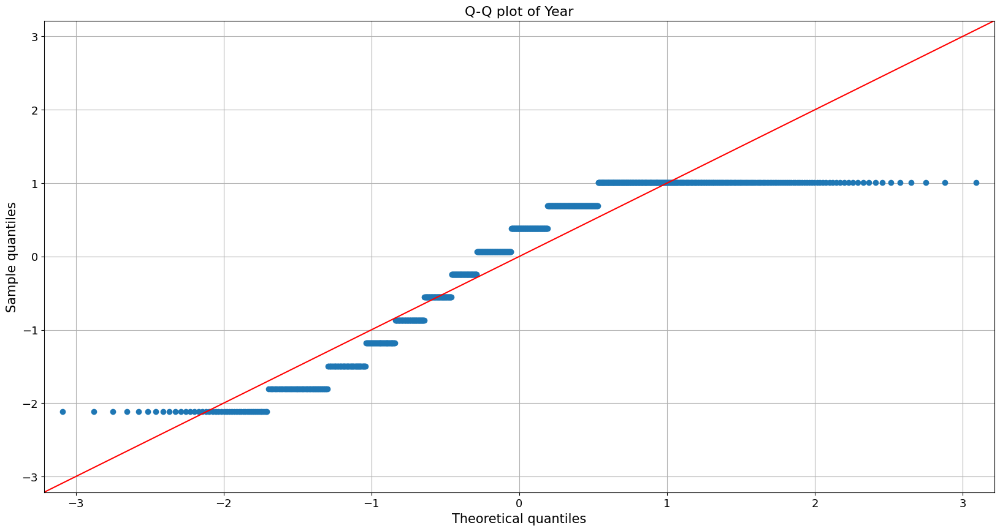

<Figure size 800x500 with 0 Axes>

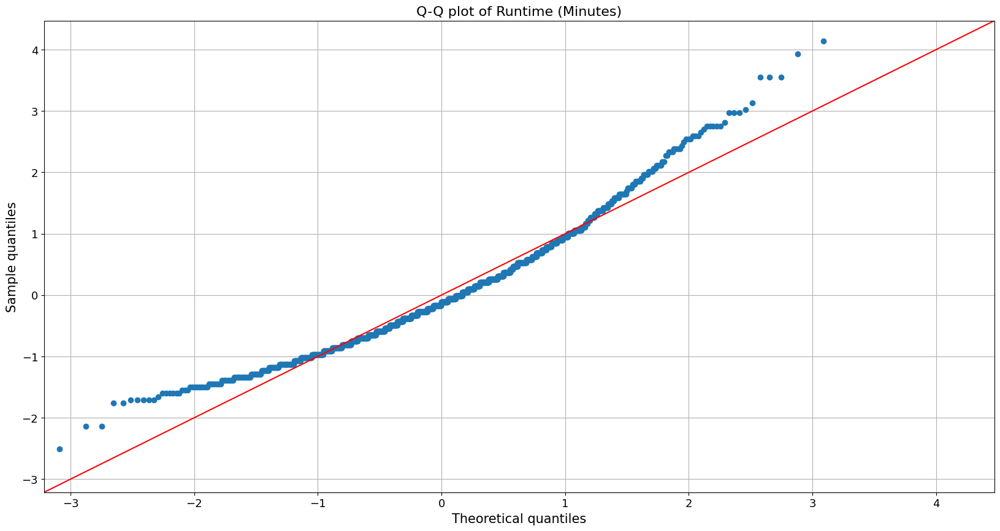

<Figure size 800x500 with 0 Axes>

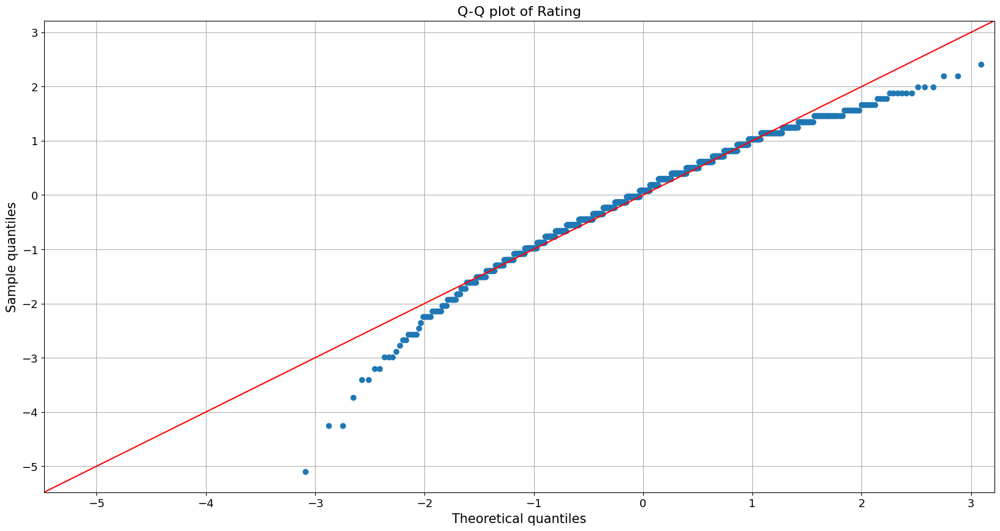

<Figure size 800x500 with 0 Axes>

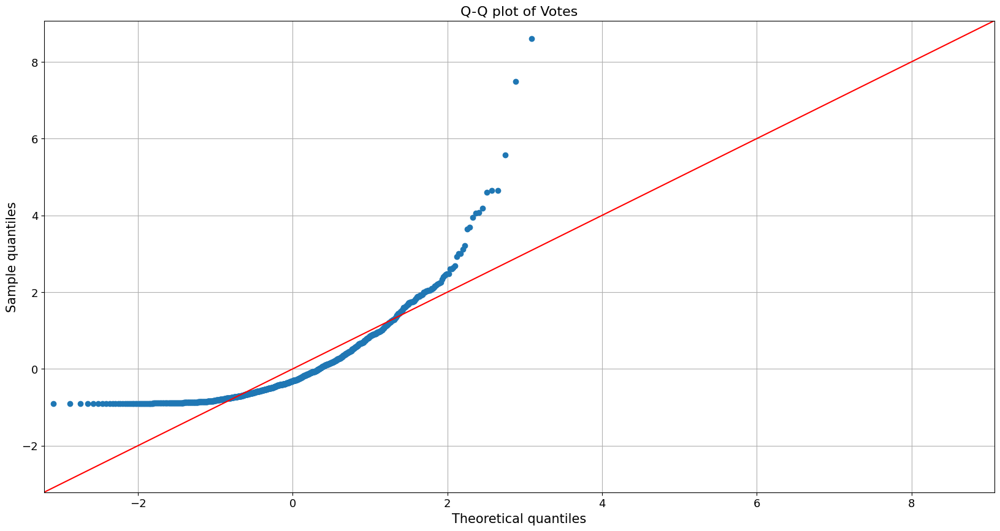

<Figure size 800x500 with 0 Axes>

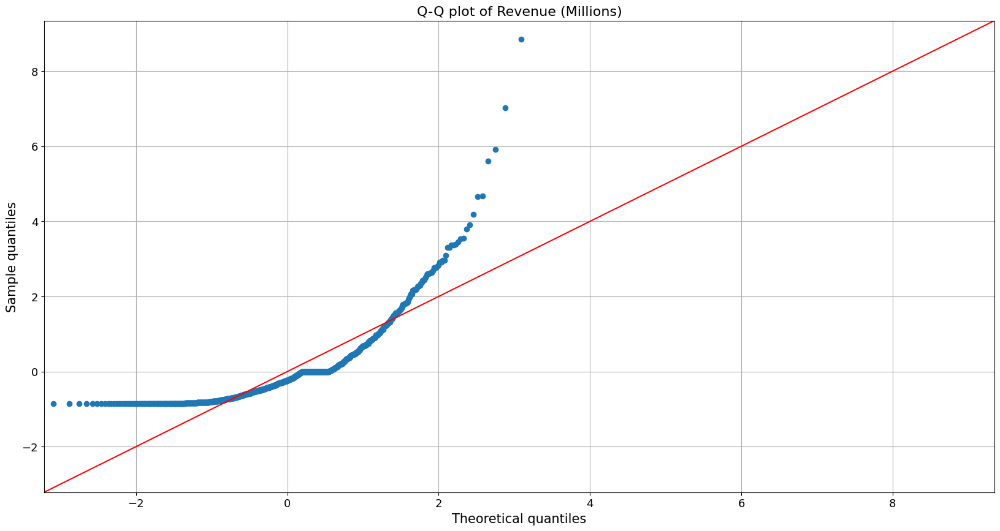

<Figure size 800x500 with 0 Axes>

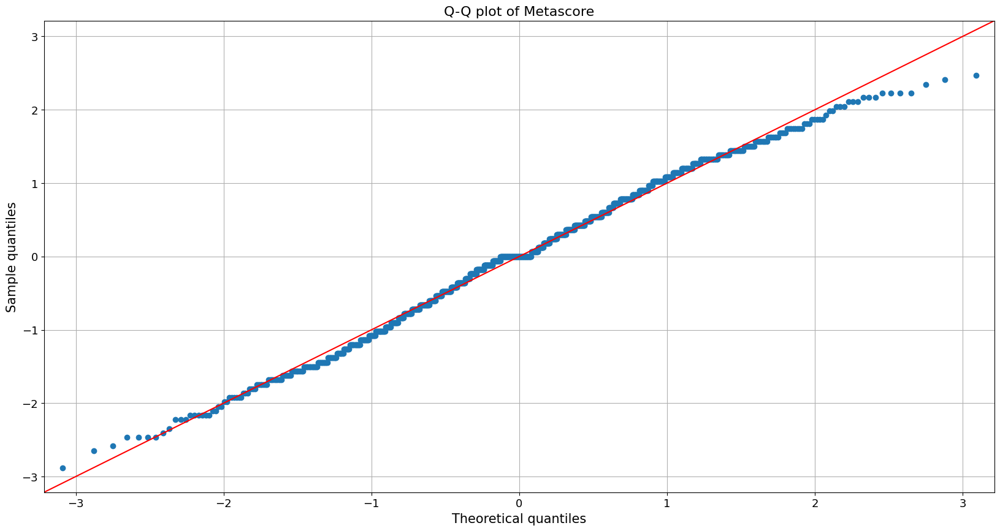

In [224]:
#The likely distributions of the numeric variables

from statsmodels.graphics.gofplots import qqplot
data_dist = data[['Year','Runtime (Minutes)','Rating','Votes','Revenue (Millions)','Metascore']]
for c in data_dist.columns[:]:
  plt.figure(figsize=(8,5))
  fig=qqplot(data_dist[c],line='45',fit='True')
  plt.xticks(fontsize=13)
  plt.yticks(fontsize=13)
  plt.xlabel("Theoretical quantiles",fontsize=15)
  plt.ylabel("Sample quantiles",fontsize=15)
  plt.title("Q-Q plot of {}".format(c),fontsize=16)
  plt.grid(True)
  plt.show()

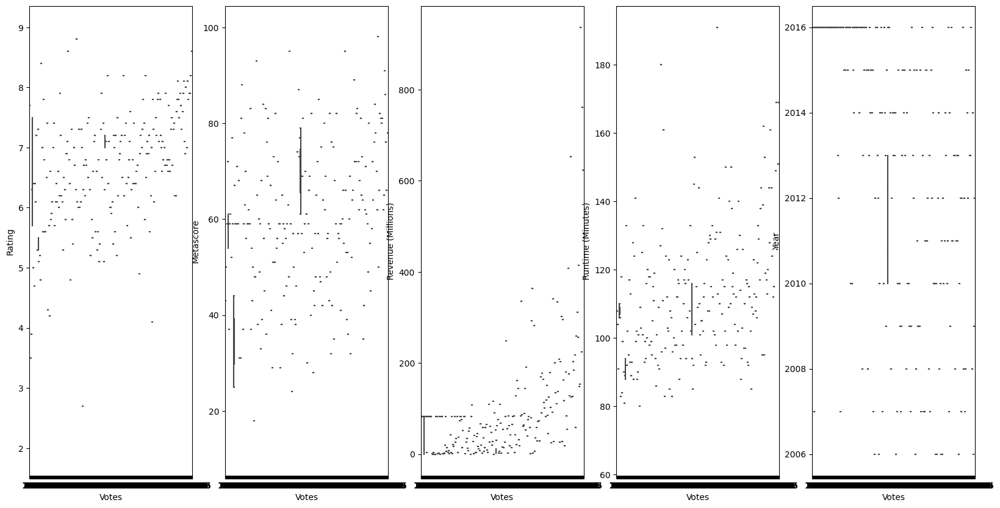

In [226]:
names = data_dist[
    [
        "Votes",
        "Rating",
        "Metascore",
        "Revenue (Millions)",
        "Runtime (Minutes)",
        "Year",
        
    ]
].columns.drop("Votes")
ncols = len(names)
fig, axes = plt.subplots(1, ncols)
for name, ax in zip(names, axes.flatten()):
    sns.boxplot(
        y=name,
        x="Votes",
        data=data[
            [
               "Votes",
               "Rating",
               "Metascore",
               "Revenue (Millions)",
               "Runtime (Minutes)",
               "Year",
               
            ]
        ],
        orient="v",
        ax=ax,
    )
plt.rcParams["figure.figsize"] = (12, 16)

#**Feature Importance and Selection**

In [235]:
# Scaling the data using Min-Max scaling for the purpose of evaluating Co-efficients, as non scaled data may mislead while we evaluate the co-efficients
df = data.drop(["Votes"], axis=1)
df_norm = (df - df.min()) / (df.max() - df.min())
df_norm = pd.concat((df_norm, data.Votes), 1)

In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.


In [236]:
#Using OLS for finding the p value to check the significant features
import statsmodels.api as sm

model = sm.OLS(data['Votes'], data[['Rank',  'Year', 'Runtime (Minutes)', 'Rating', 'Votes']]).fit()

# Print out the statistics
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:                  Votes   R-squared (uncentered):                   1.000
Model:                            OLS   Adj. R-squared (uncentered):              1.000
Method:                 Least Squares   F-statistic:                          1.137e+33
Date:                Sat, 08 Apr 2023   Prob (F-statistic):                        0.00
Time:                        01:50:27   Log-Likelihood:                          21547.
No. Observations:                1000   AIC:                                 -4.308e+04
Df Residuals:                     995   BIC:                                 -4.306e+04
Df Model:                           5                                                  
Covariance Type:            nonrobust                                                  
=====================================================================================
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
Rank               1.339e-13   1.23e-14     10.926      0.000     1.1e-13    1.58e-13
Year               4.441e-15   1.61e-14      0.276      0.782   -2.71e-14     3.6e-14
Runtime (Minutes) -7.674e-13   2.03e-13     -3.786      0.000   -1.17e-12    -3.7e-13
Rating             2.728e-12   4.27e-12      0.639      0.523   -5.66e-12    1.11e-11
Votes                 1.0000   2.19e-17   4.57e+16      0.000       1.000       1.000
==============================================================================
Omnibus:                      367.774   Durbin-Watson:                   0.872
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             1603.894
Skew:                           1.686   Prob(JB):                         0.00
Kurtosis:                       8.207   Cond. No.                     3.22e+05
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[3] The condition number is large, 3.22e+05. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

**Feature Selection**

Feature Selection is the process of selecting the features which are relevant to a machine learning model. It means that you select only those attributes that have a significant effect on the model's output.

Consider the case when you go to the departmental store to buy grocery items. A product has a lot of information on it, i.e., product, category, expiry date, retail cost, ingredients, and manufacturing details. All this information is the features of the product. Normally, you check the brand, retail cost, expiry date, weather the item is vegetarian or not before buying a product. However, manufacturing section is not your concern. Therefore, brand, retail cost, expiry date, vegetraian/non-vegetarian are relevant features, and the manufacturing details are irrelevant. This is how feature selection is done.

**Null-Hypothesis**

In [237]:
df_norm_feature_selected = df_norm[
    [
        "Votes",
        "Rating",
        "Metascore",
        "Revenue (Millions)",
        "Runtime (Minutes)",
        "Year",
    ]
]

In [238]:
#Using OLS for finding the p value to check the significant features
import statsmodels.api as sm

model2 = sm.OLS(data['Votes'], data[['Rank',  'Year', 'Runtime (Minutes)', 'Rating', 'Votes']]).fit()

# Print out the statistics
model2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:                  Votes   R-squared (uncentered):                   1.000
Model:                            OLS   Adj. R-squared (uncentered):              1.000
Method:                 Least Squares   F-statistic:                          1.137e+33
Date:                Sat, 08 Apr 2023   Prob (F-statistic):                        0.00
Time:                        01:54:17   Log-Likelihood:                          21547.
No. Observations:                1000   AIC:                                 -4.308e+04
Df Residuals:                     995   BIC:                                 -4.306e+04
Df Model:                           5                                                  
Covariance Type:            nonrobust                                                  
=====================================================================================
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
Rank               1.339e-13   1.23e-14     10.926      0.000     1.1e-13    1.58e-13
Year               4.441e-15   1.61e-14      0.276      0.782   -2.71e-14     3.6e-14
Runtime (Minutes) -7.674e-13   2.03e-13     -3.786      0.000   -1.17e-12    -3.7e-13
Rating             2.728e-12   4.27e-12      0.639      0.523   -5.66e-12    1.11e-11
Votes                 1.0000   2.19e-17   4.57e+16      0.000       1.000       1.000
==============================================================================
Omnibus:                      367.774   Durbin-Watson:                   0.872
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             1603.894
Skew:                           1.686   Prob(JB):                         0.00
Kurtosis:                       8.207   Cond. No.                     3.22e+05
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[3] The condition number is large, 3.22e+05. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

**Training the dataset**

**Fitting a SVM**

In [241]:
from sklearn import svm

regr = svm.SVR()
svm_model = regr.fit(x_train, y_train)

In [242]:
svm_predictions = svm_model.predict(x_test).round()


**Fitting a MLP Regressor**

In [245]:
from sklearn.neural_network import MLPRegressor

regr = MLPRegressor(random_state=1, max_iter=500).fit(x_train, y_train)

Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.


In [246]:
mlp_predictions = regr.predict(x_test).round()


**Model Selection**

From the above summary of the models trained on the dataset, the two best models is

 SVM best model with tuned hyperparameters.

Interpreting SVM Regressor using SHAP values

Here the x-axis is the feature and the y-axis is the output as we vary the feature. The grey histogram is the distribution of variables in the dataset and the cross made by E[Feature], E[f(x)] is the expected values.

Let us take a feature of fixed_acidity

The cross is made at approx E[f(x)] 5.74
So as the fixed_acidity increases the expected value also increases

Talking about the red line on the plot - When we give a sample as an input (sample_ind = 18) as an input to check the output. By plotting this we can see the difference between the model output from the expected value.

**Linear Regression**

In [18]:
X = data.drop(["Votes", "Rank"], axis=1)  # Training Feature
Y = data["Votes"]  # Target

In [92]:
(
    x_train,
    x_test,
    y_train,
    y_test,
) = train_test_split(  # Splitting Data into Training and Test
    X, Y, test_size=0.1, random_state=42
)
x_train_1000 = shap.utils.sample(
    x_train, 1000
)  # Taking 1000 samples out for SHAP analysis as it is a computationally expensive process
x_test_1000 = shap.utils.sample(
    x_test, 1000
)  # Taking 1000 samples out for SHAP analysis as it is a computationally expensive process

In [93]:
import sklearn

linear_model = sklearn.linear_model.LinearRegression()  # Initializing a Linear Model
linear_model.fit(x_train, y_train)  # Training a linear model

LinearRegression()

In [94]:
# Scaling the data using Min-Max scaling for the purpose of evaluating Co-efficients, as non scaled data may mislead while we evaluate the co-efficients
dff = data.drop("Votes", axis=1)
df_norm = (dff - dff.min()) / (dff.max() - dff.min())
df_norm = pd.concat((df_norm, df.Votes), 1)

In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.


In [95]:
import pandas as pd
import statsmodels.api as sm

# Create a dataframe with the predictor variables
X = sm.add_constant(data[['Rank', 'Year', 'Runtime (Minutes)', 'Rating', 'Revenue (Millions)', 'Metascore']])

# Create a series with the response variable
y = data['Votes']

# Fit a linear model
regr = sm.OLS(y, X).fit()

# Print the model summary
print(regr.summary())


                            OLS Regression Results                            
Dep. Variable:                  Votes   R-squared:                       0.640
Model:                            OLS   Adj. R-squared:                  0.638
Method:                 Least Squares   F-statistic:                     294.6
Date:                Sat, 08 Apr 2023   Prob (F-statistic):          1.64e-216
Time:                        00:15:55   Log-Likelihood:                -13055.
No. Observations:                1000   AIC:                         2.612e+04
Df Residuals:                     993   BIC:                         2.616e+04
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const               3.885e+07   2.51

In [96]:
y = regr.predict(X)
y

0      507710.695696
1      306078.884507
2      247376.275466
3      348861.117956
4      352605.111196
           ...      
995     37188.753495
996     81894.673767
997    140270.000465
998      2120.562428
999   -116692.129812
Length: 1000, dtype: float64

In [97]:
regr.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  Votes   R-squared:                       0.640
Model:                            OLS   Adj. R-squared:                  0.638
Method:                 Least Squares   F-statistic:                     294.6
Date:                Sat, 08 Apr 2023   Prob (F-statistic):          1.64e-216
Time:                        00:15:55   Log-Likelihood:                -13055.
No. Observations:                1000   AIC:                         2.612e+04
Df Residuals:                     993   BIC:                         2.616e+04
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const               3.885e+07   2.51e+06     15.500      0.000    3.39e+07    4.38e+07
Rank                -113.2988     14.137     -8.014      0.000    -141.041     -85.557
Year               -1.946e+04   1239.081    -15.709      0.000   -2.19e+04    -1.7e+04
Runtime (Minutes)    932.9269    214.971      4.340      0.000     511.078    1354.776
Rating              5.404e+04   5210.475     10.372      0.000    4.38e+04    6.43e+04
Revenue (Millions)   877.8190     39.872     22.016      0.000     799.577     956.061
Metascore            216.2373    272.531      0.793      0.428    -318.565     751.039
==============================================================================
Omnibus:                      495.824   Durbin-Watson:                   1.983
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             7078.997
Skew:                           1.909   Prob(JB):                         0.00
Kurtosis:                      15.463   Cond. No.                     1.45e+06
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.45e+06. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

The above fits a linear regression model using the Ordinary Least Squares (OLS) method.

The sm.OLS() function from the statsmodels library performs the OLS estimation of the linear regression model and returns an object that represents the fitted model. The fit() method of the model object is called to estimate the coefficients and other statistics for the model.

The linear regression model assumes that the response variable is linearly related to the predictor variables. The model.summary() function prints a summary of the estimated coefficients and other statistics, including the R-squared value that measures the proportion of the variability in the response variable that is explained by the predictor variables.

So, based on this output, we can say that a linear model is being fit.
****

**Interpretation of the regression coefficients**
****
The interpretation of the regression coefficients in this linear regression model is as follows:

The intercept coefficient const represents the expected value of the response variable (Votes) when all the predictor variables are zero. However, in this case, it does not have a meaningful interpretation as all the predictor variables are not possible to be zero.

The coefficient of Rank is -113.2988, which indicates that a one unit increase in the Rank of the movie is associated with a decrease of 113.2988 votes, all other predictor variables being constant.

The coefficient of Year is -19460, which indicates that a one unit increase in Year is associated with a decrease of 19460 votes, all other predictor variables being constant.

The coefficient of Runtime (Minutes) is 1034.5374, which indicates that a one unit increase in Runtime (Minutes) is associated with an increase of 1034.53749 votes, all other predictor variables being constant.

The coefficient of Rating is 54040, which indicates that a one unit increase in Rating is associated with an increase of 54040 votes, all other predictor variables being constant.

The coefficient of Revenue (Millions) is 877.8190, which indicates that a one unit increase in Revenue (Millions) is associated with an increase of 877.8190 votes, all other predictor variables being constant.

The coefficient of Metascore is 216.2373, which indicates that a one unit increase in Metascore is associated with an increase of 216.2373 votes, all other predictor variables being constant.

**Note: ** The interpretation of each coefficient is based on the assumption that all other predictor variables in the model are held constant. Also, the p-values associated with each coefficient provide information about the statistical significance of the coefficient in the model.
****
**The p values:**

The p-values in the regression model indicate the statistical significance of each predictor variable in the model. The null hypothesis for each p-value test is that the corresponding regression coefficient is equal to zero. If the p-value is less than the chosen significance level (often 0.05), then we can reject the null hypothesis and conclude that there is evidence of a non-zero effect of the predictor variable on the response variable.

In this model, we can see that all predictor variables have p-values less than 0.05, except for the Metascore variable. This suggests that there is strong evidence that the Rank, Year, Runtime (Minutes), Rating, and Revenue (Millions) variables are all associated with the response variable Votes. However, we cannot conclude that the Metascore variable is statistically significant in predicting Votes based on this model, as its p-value is 0.428 which is greater than 0.05.
****
**Skewness & Kurtosis**

In the output of the regression model, we can see that the skewness of the residuals is 1.909, which is greater than 0. This suggests that the distribution of the residuals is positively skewed, meaning that there are more extreme positive values than negative values. This could indicate that the model is not fully capturing the variation in the data, particularly in the upper end of the response variable.

The kurtosis of the residuals is 15.463, which is much greater than 3 (the kurtosis of a normal distribution). This indicates that the distribution of the residuals is very peaked, with heavy tails, suggesting that there are some extreme values in the residuals. This could indicate that there are outliers or influential observations in the data that are affecting the fit of the model.

The Durbin-Watson statistic is a measure of autocorrelation in the residuals of a regression model. Autocorrelation occurs when the residuals of a model are not independent of each other, which violates one of the assumptions of the linear regression model.
****
**Durbin-Watson**

The Durbin-Watson statistic ranges from 0 to 4, with a value of 2 indicating no autocorrelation in the residuals. Values between 0 and 2 indicate positive autocorrelation, while values between 2 and 4 indicate negative autocorrelation.

In the output of the regression model, we can see that the Durbin-Watson statistic is 1.983. This indicates that there is some positive autocorrelation in the residuals, meaning that the residuals are not independent of each other.
****
**Jarque-Bera:**

In the regression output provided, we can see that the Jarque-Bera test is performed on the residuals of the regression model. The test statistic is reported as 7078.997 and the p-value is reported as 0.000, indicating that the residuals are not normally distributed. This suggests that there may be some underlying patterns or features in the data 



In [98]:
shap.initjs()


Attempting to set identical low and high xlims makes transformation singular; automatically expanding.


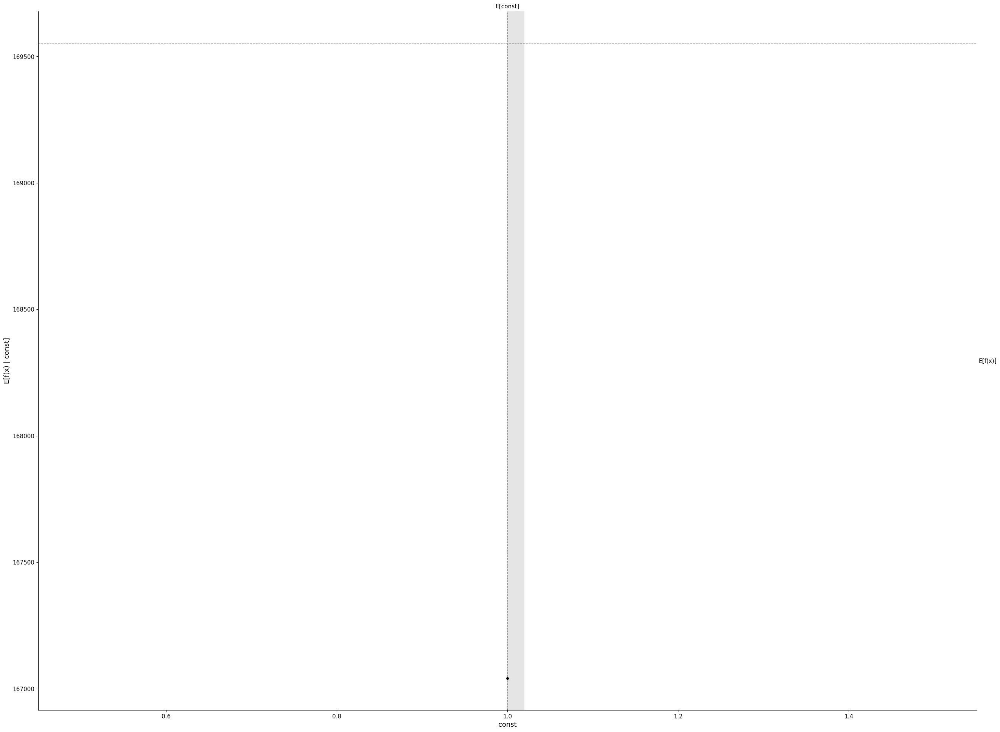

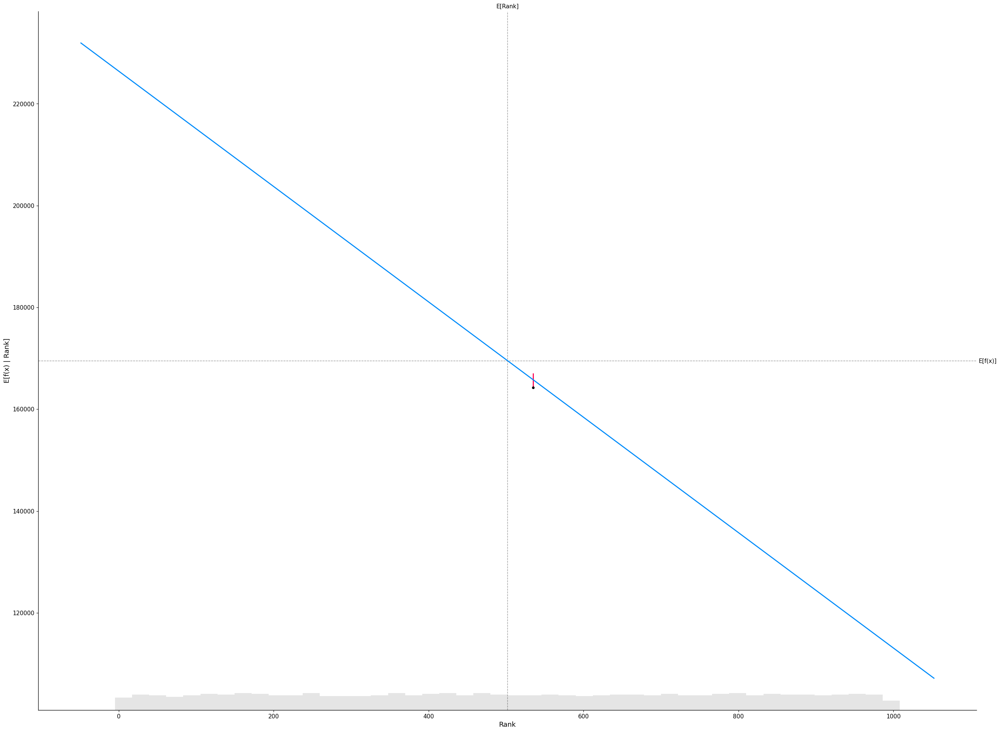

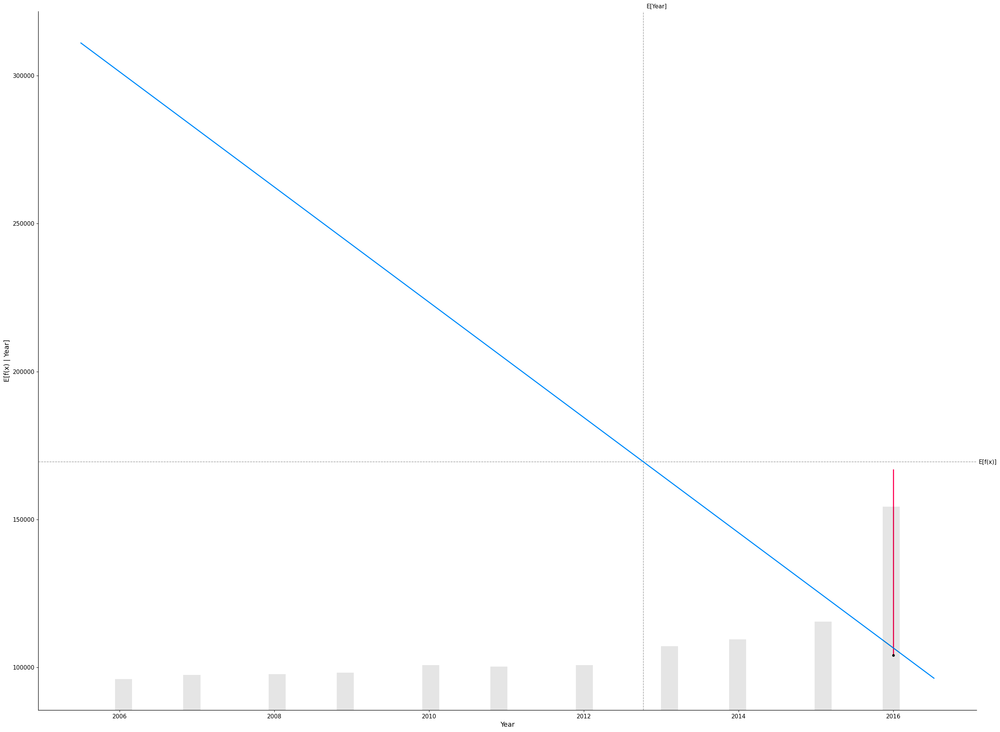

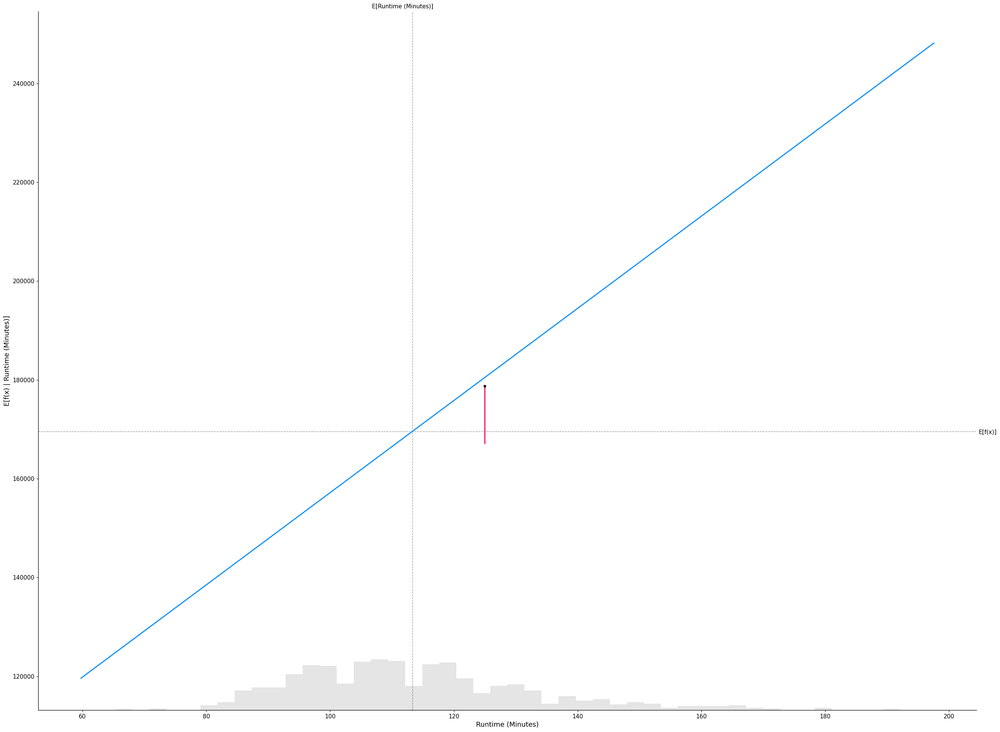

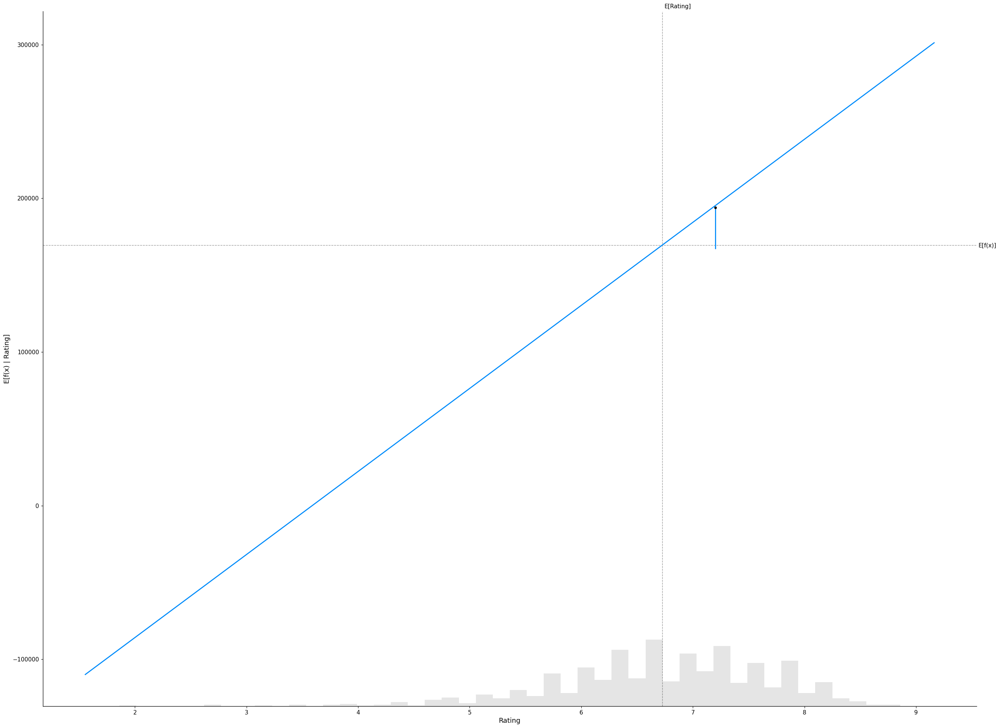

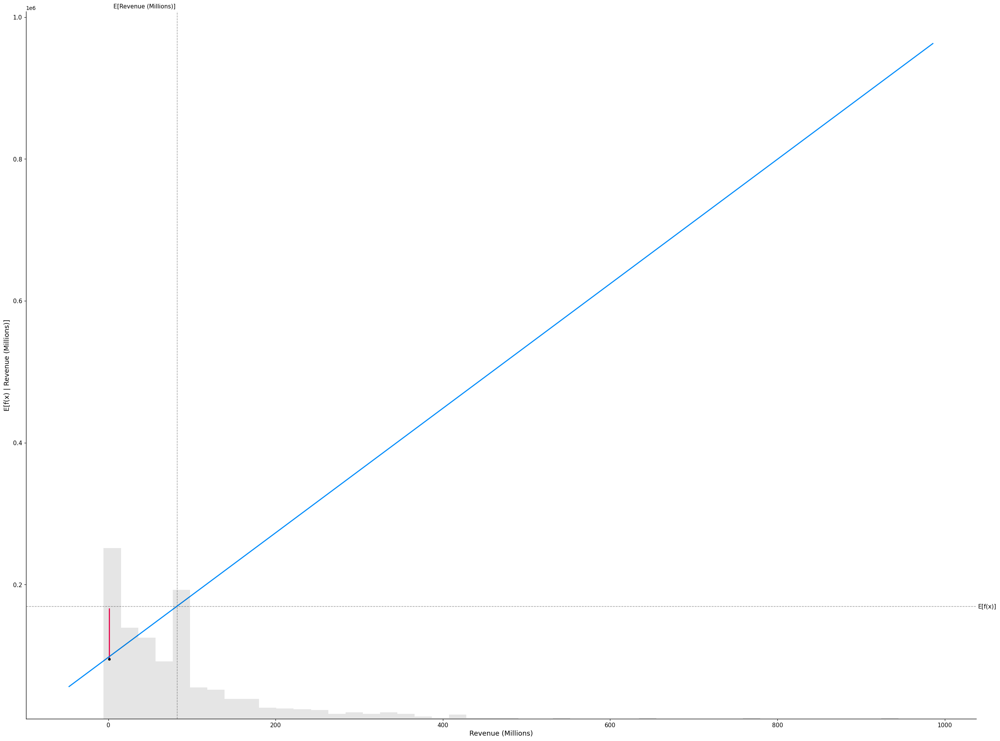

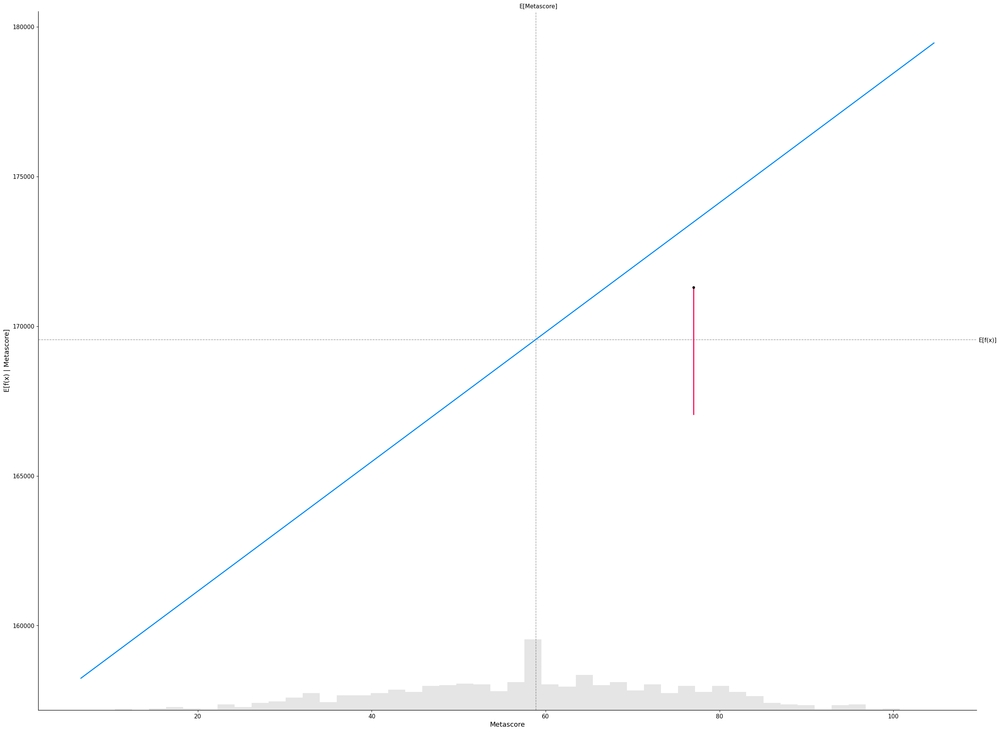

In [99]:
# SHAP explanation of a Linear Model
linear_explainer = shap.Explainer(regr.predict, x_train_1000)
linear_shap_values = linear_explainer(x_train)
for i in x_train.columns:
    # make a standard partial dependence plot
    sample_ind = 18
    shap.partial_dependence_plot(
        i,
        regr.predict,
        x_train_1000,
        model_expected_value=True,
        feature_expected_value=True,
        ice=False,
        shap_values=linear_shap_values[sample_ind : sample_ind + 1, :],
    )

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


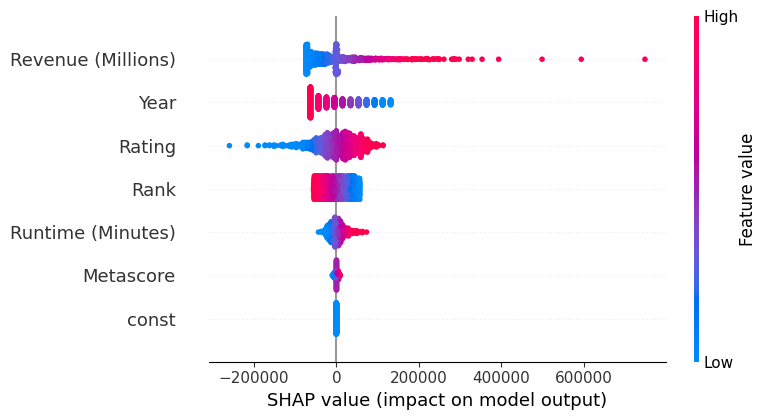

In [100]:
# shap summmary for linear model

shap.summary_plot(linear_shap_values, x_train)

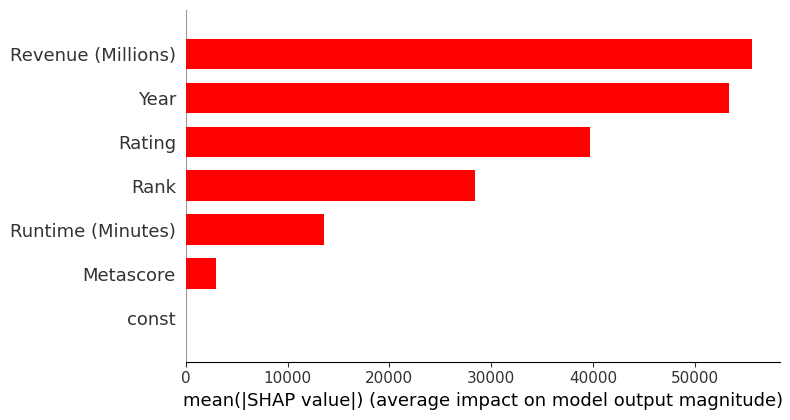

In [101]:
# SHAP variable importance for a Linear Model

shap.summary_plot(linear_shap_values, x_train, plot_type="bar", color="red")


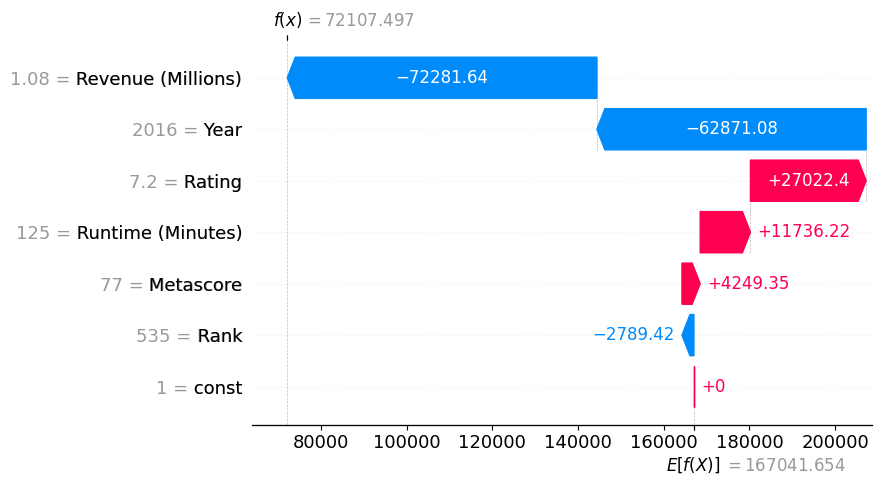

In [102]:
# Waterfall plot for linear model
shap.plots.waterfall(linear_shap_values[sample_ind], max_display=14)

**Interpreting Waterfall SHAP visualization**


Let's consider the same sample (sample_ind = 18)
Notice the value of revenue in the waterfall model is the same as what we have in SHAP partial dependence plot. It says that f(x) = 72107 is what we got as a model output and the expected output for this sample was 72107. We came pretty close to determining it as the difference is only 0.04. The waterfall model explains how we got the expected output, and which features contributed to what. The below graph shows that revenue has the biggest and most positive impact in increasing the votes for this specific sample. Followed by year had a negative impact and it bought the votes down again for this sample, and so on. Using this model we can visually interpret why exactly this specific sample is giving an output of 5.7.


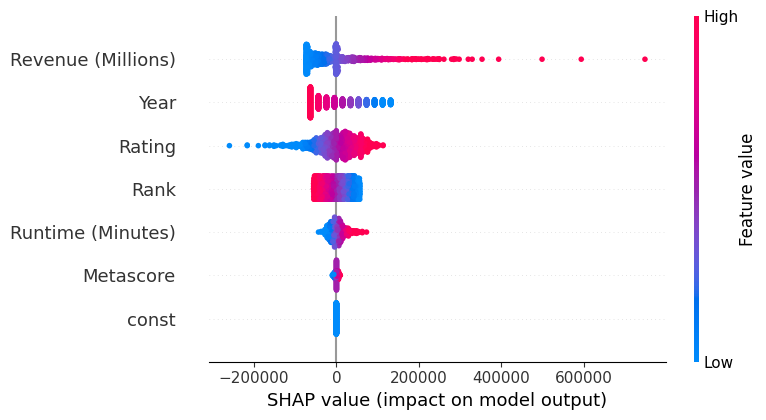

In [103]:
# SHAP summary for Linear Model
shap.summary_plot(linear_shap_values, x_train)

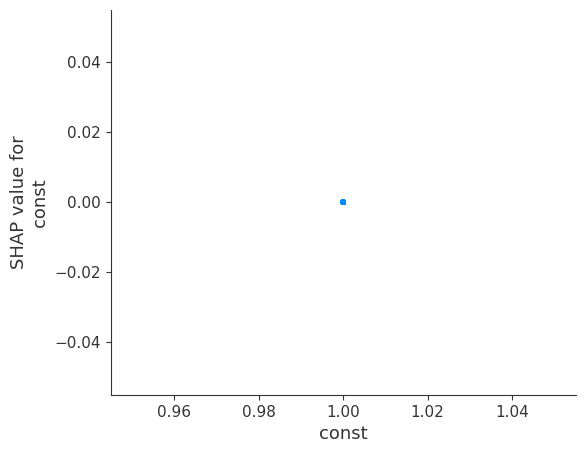

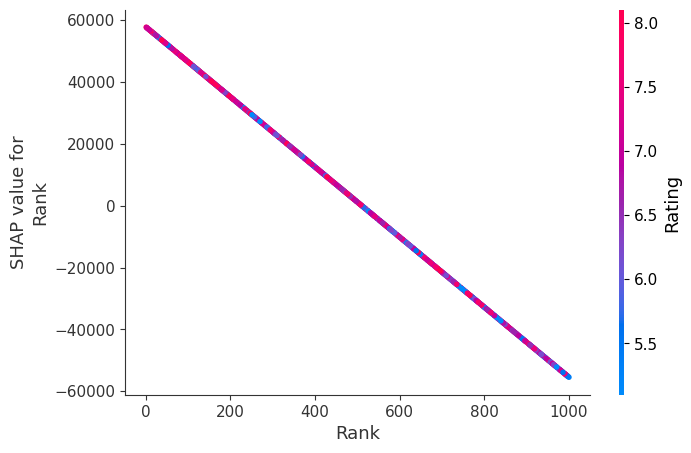

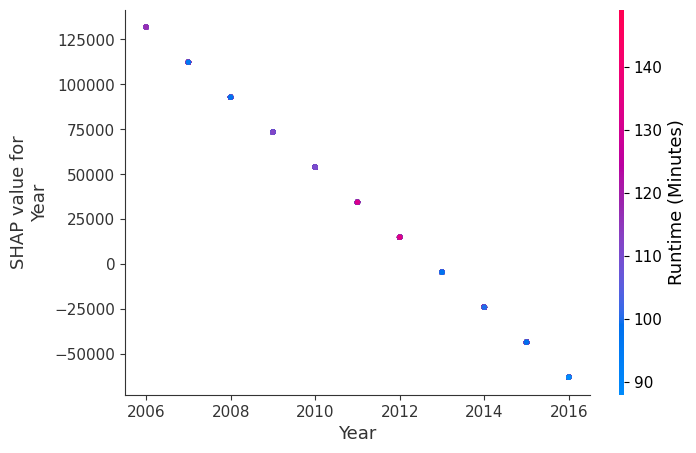

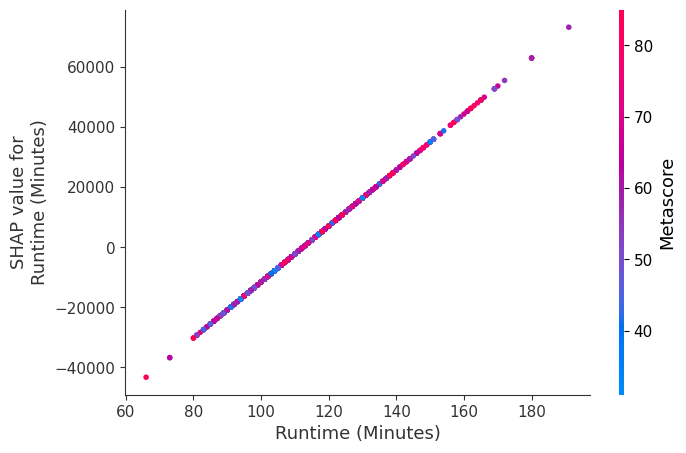

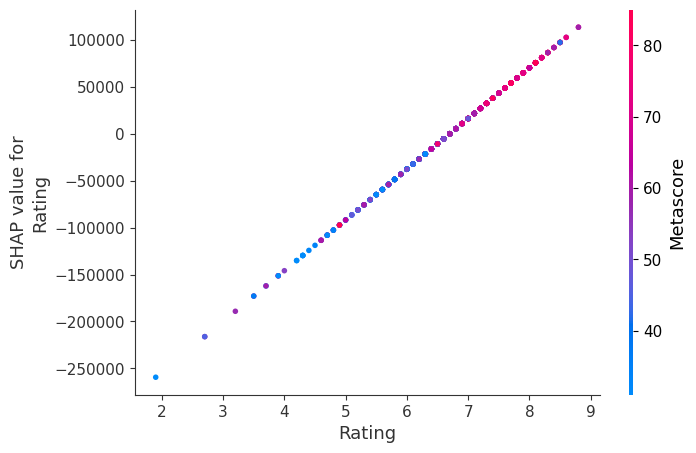

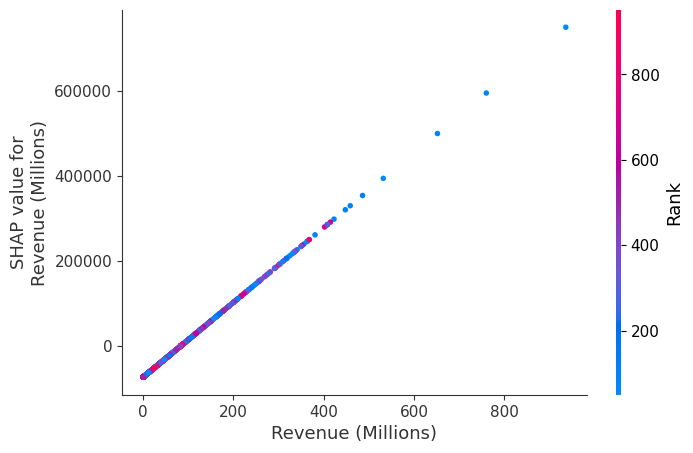

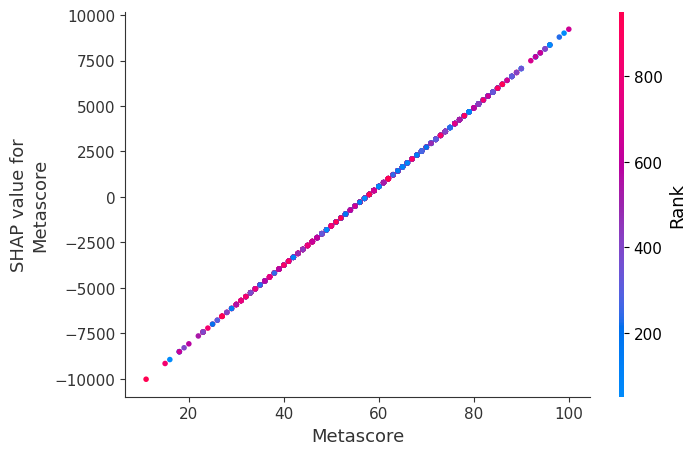

In [104]:
# SHAP partial dependence plot for linear model
for i in x_train.columns:
    shap.dependence_plot(i, linear_shap_values.values, x_train)

**Fitting a tree-based model-**

**Random Forest**

In [105]:
# Setting the max_dept to 3 for the purpose of ease of explainbility and readability
tree_model = RandomForestRegressor(max_depth=3, random_state=0, n_estimators=10)
tree_model.fit(x_train, y_train)

RandomForestRegressor(max_depth=3, n_estimators=10, random_state=0)

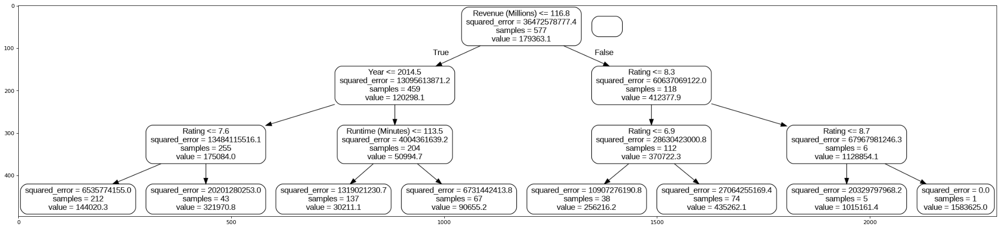

In [106]:
# Visualization of Nodes for the purpose of explainability
figure(figsize=(32, 24), dpi=80)
tree = tree_model.estimators_[0]
export_graphviz(
    tree,
    out_file="tree.dot",
    feature_names=list(x_train.columns),
    rounded=True,
    precision=1,
)
(graph,) = pydot.graph_from_dot_file("tree.dot")
graph.write_png("tree.png")
img = mpimg.imread("tree.png")
imgplot = plt.imshow(img)
plt.show()
     

**Interpreting Nodes of a Tree-Based Model**

Random Forest Regressor works on the concept of the wisdom of the crowd. The above decision tree is one of the many trees involved in predicting the target variable. Each decision tree regression predicts a number as an output for a given input. Random forest regression takes the average of those predictions as its final output.

As usual, the tree has conditions on each internal node and a value associated with each leaf (i.e. the value to be predicted). But additionally, we’ve plotted out the value at each internal node i.e. the mean of the response variables in that region.

Leaf1:Rating

Leaf2:Rating

Leaf3:Runtime (Minutes)

Leaf4:Runtime (Minutes)

Leaf5:Rating

Leaf6:Rating

Leaf7:Rating

Leaf8:Rating

In [107]:
# Get numerical feature importances
tree_importances = list(tree_model.feature_importances_)
# List of tuples with variable and importance
feature_importances = [
    (feature, round(importance, 2))
    for feature, importance in zip(x_train.columns, tree_importances)
]
# Sort the feature importances by most important first
feature_importances = sorted(feature_importances, key=lambda x: x[1], reverse=True)
     

In [108]:
# Print out the feature and importances
[print("Variable: {:20} Importance: {}".format(*pair)) for pair in feature_importances];

Variable: Revenue (Millions)   Importance: 0.53
Variable: Rating               Importance: 0.29
Variable: Year                 Importance: 0.13
Variable: Rank                 Importance: 0.03
Variable: Runtime (Minutes)    Importance: 0.02
Variable: const                Importance: 0.0
Variable: Metascore            Importance: 0.0


In [109]:
shap.initjs()


Attempting to set identical low and high xlims makes transformation singular; automatically expanding.


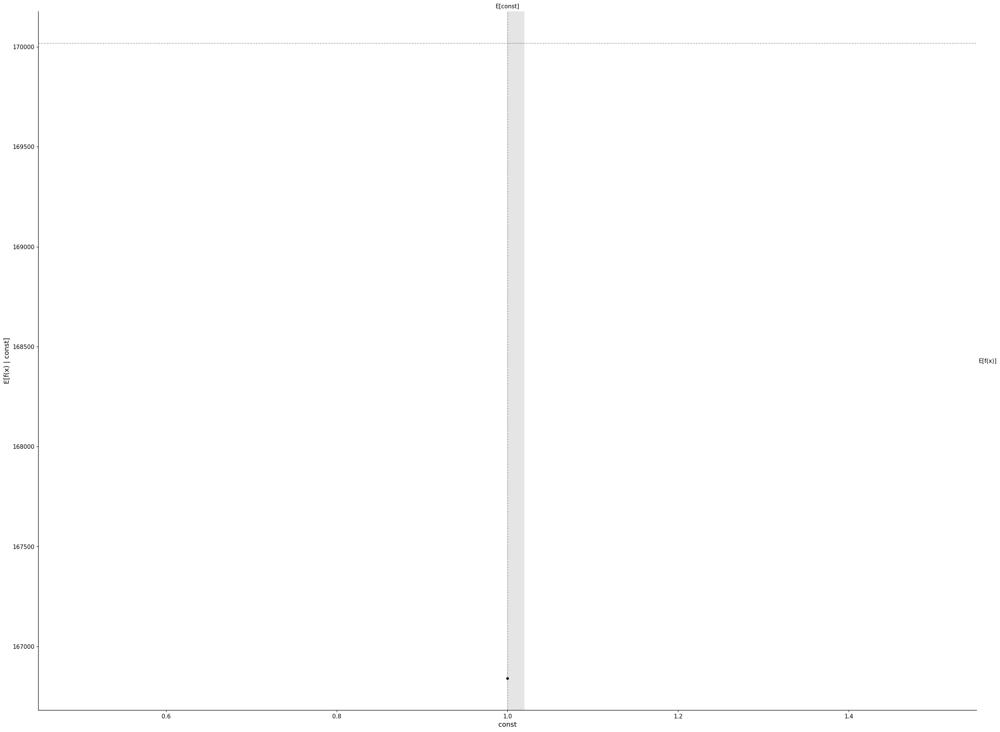

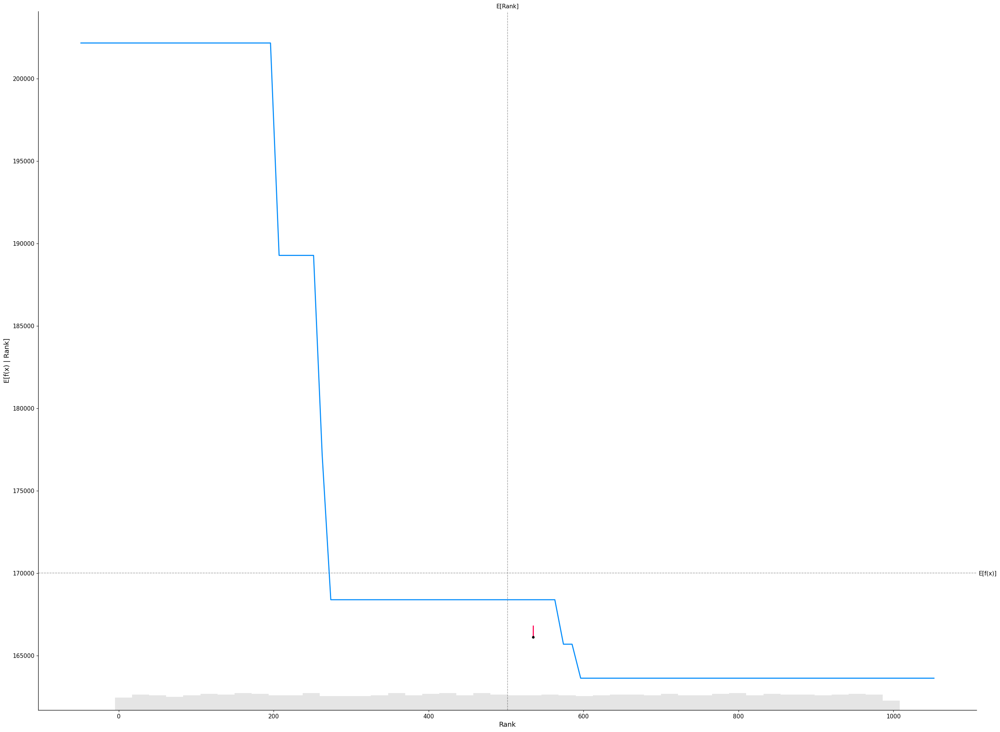

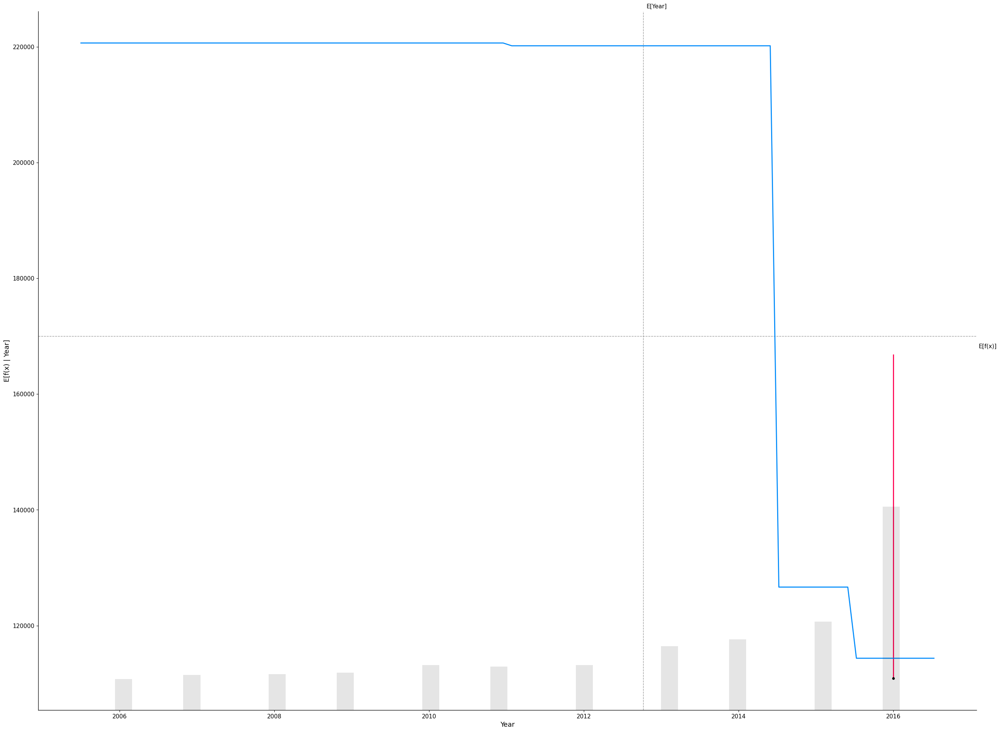

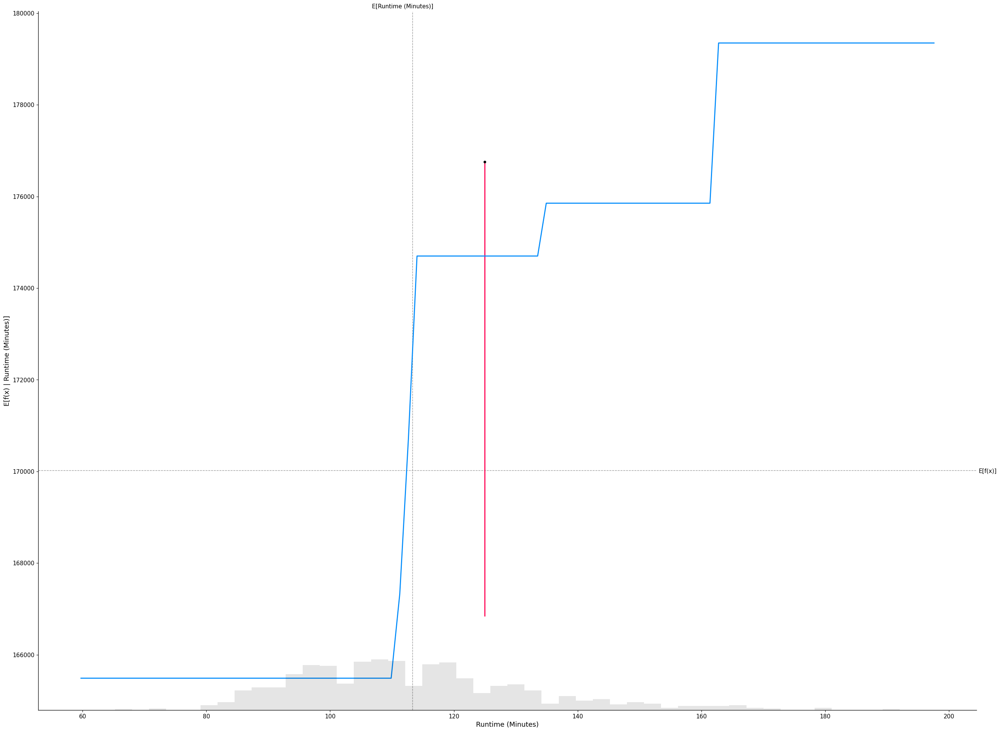

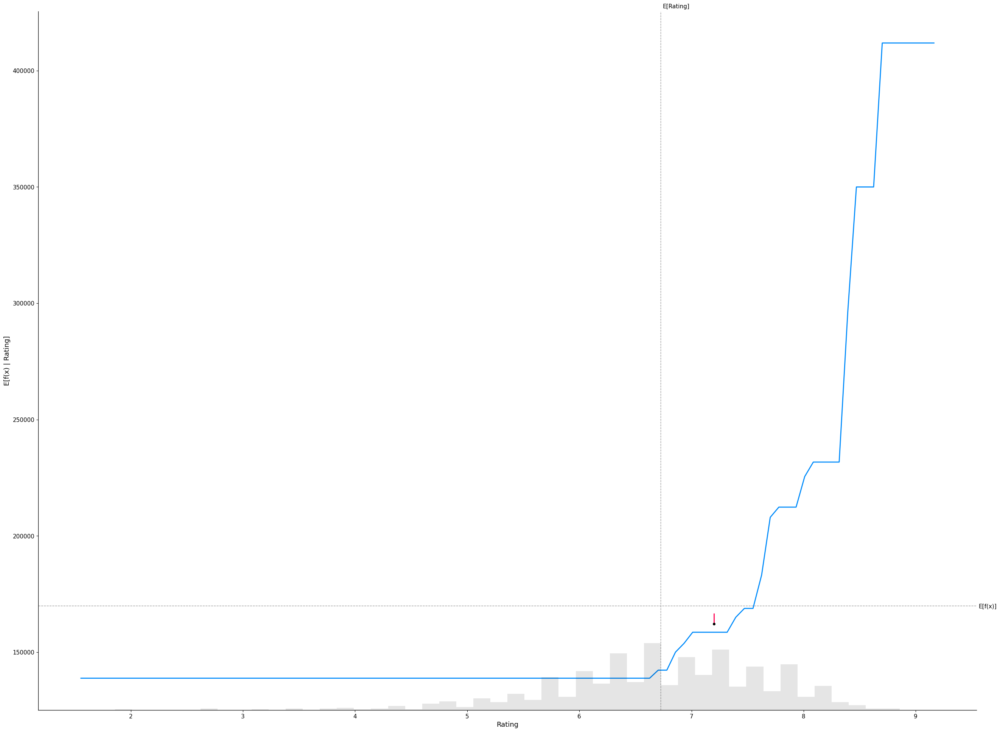

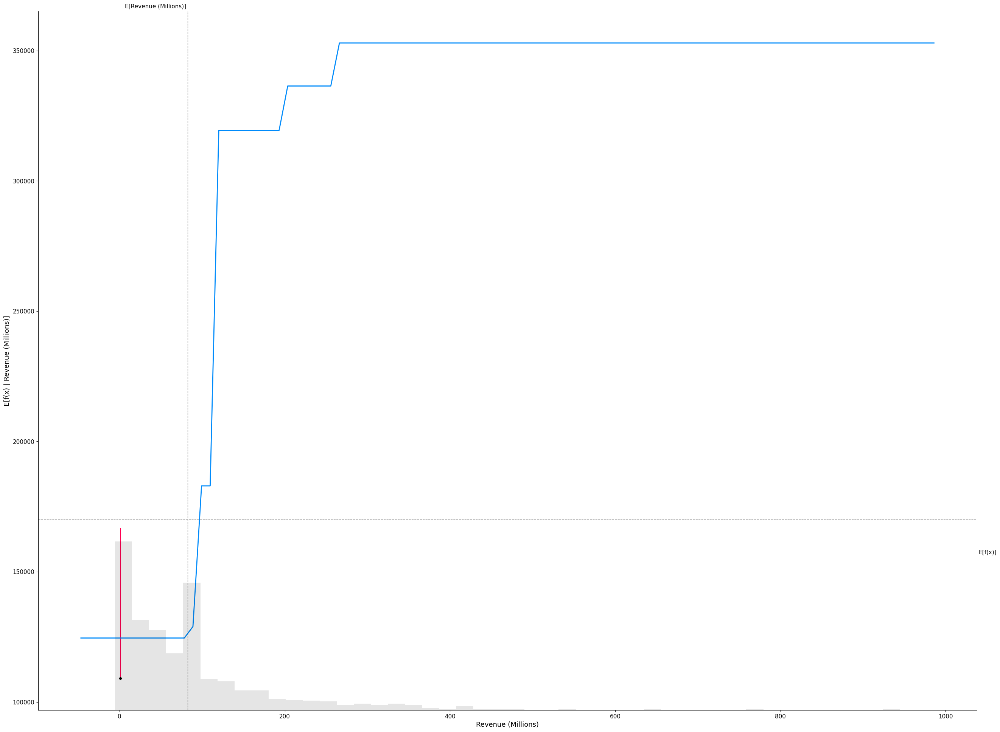

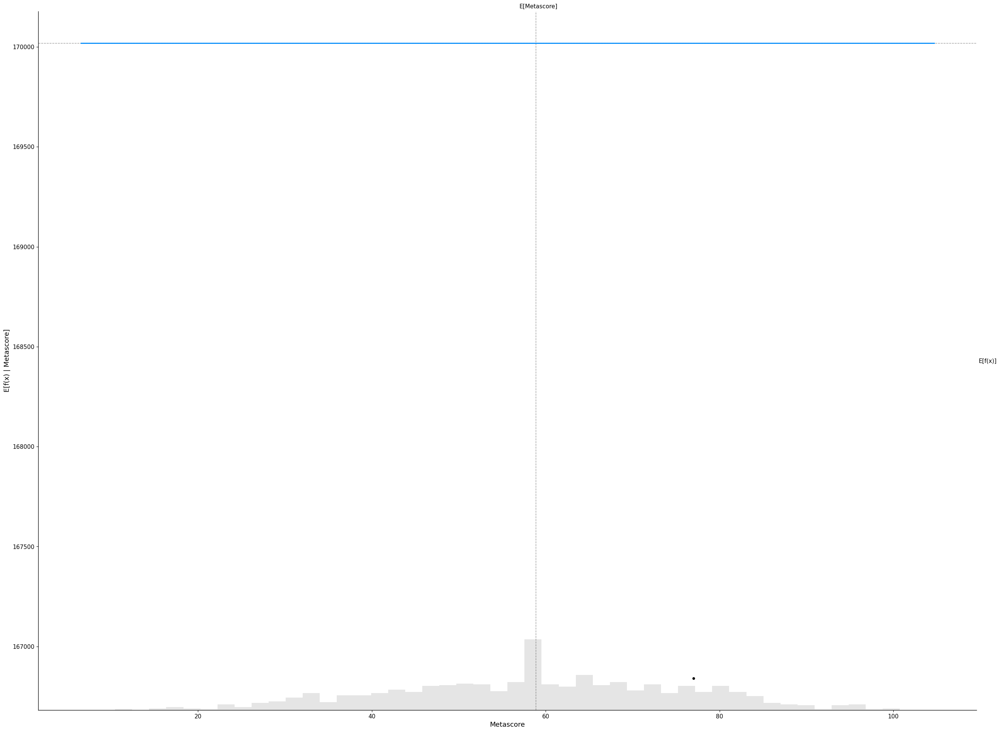

In [110]:
# SHAP explanation of a tree based model
tree_explainer = shap.Explainer(tree_model.predict, x_train_1000)
tree_shap_values = tree_explainer(x_train)
for i in x_train.columns:
    # make a standard partial dependence plot
    sample_ind = 18
    shap.partial_dependence_plot(
        i,
        tree_model.predict,
        x_train_1000,
        model_expected_value=True,
        feature_expected_value=True,
        ice=False,
        shap_values=tree_shap_values[sample_ind : sample_ind + 1, :],
    )

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


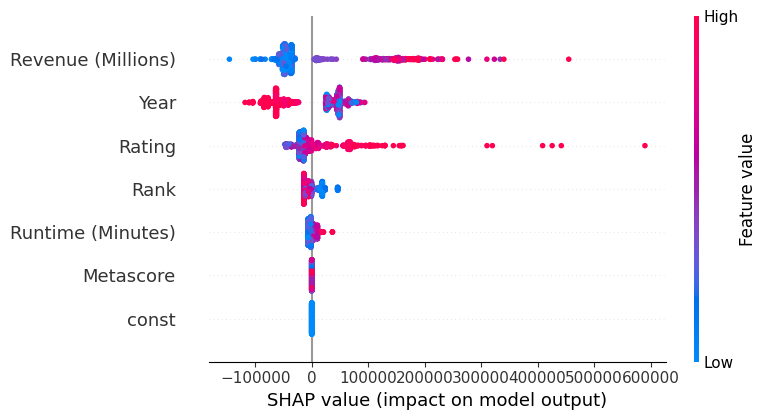

In [111]:
# shap summmary for random forest

shap.summary_plot(tree_shap_values, x_train)

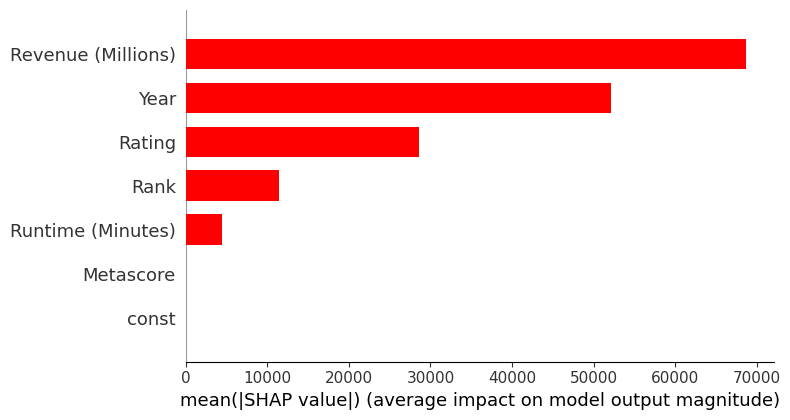

In [112]:
# SHAP variable importance for a random forest Model

shap.summary_plot(tree_shap_values, x_train, plot_type="bar", color="red")


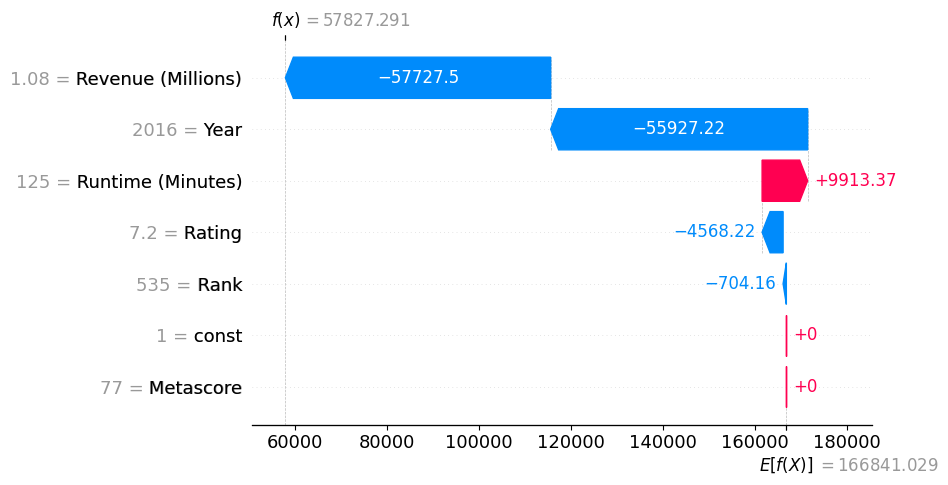

In [113]:
# Waterfall plot for random forest model
shap.plots.waterfall(tree_shap_values[sample_ind], max_display=14)

**Interpreting Waterfall SHAP visualization**

We can interpret the tree-based model for the same sample.
Where the output we got was 57827 and the expected output was 57827. in the tree-based model, we just see that the magnitude of the impact made by individual features varies from what we had in a linear model. Here in the tree-based model, the output is majorly determined by only three features - revenue, year, and runtime, whereas in the linear model revenue, year, and runtime, these features had maximum impact.

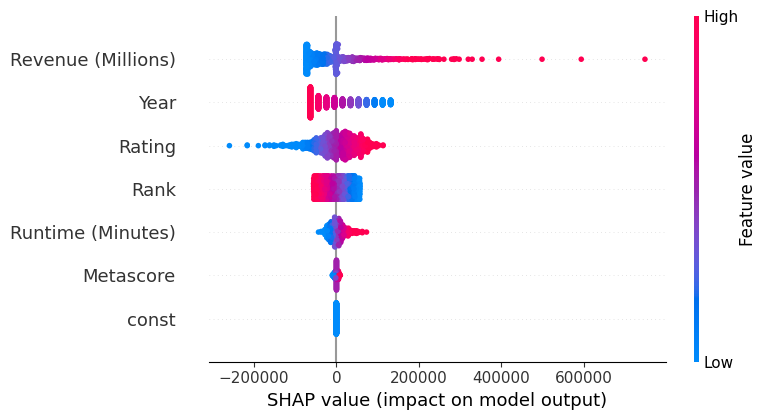

In [114]:
# SHAP summary for Linear Model
shap.summary_plot(linear_shap_values, x_train)

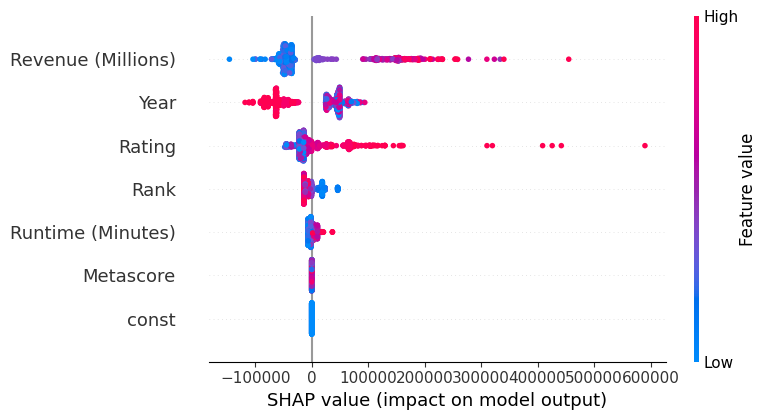

In [115]:
# SHAP summary for Tree Based Model
shap.summary_plot(tree_shap_values, x_train)

**Interpreting SHAP dependence plot for Linear and Tree-based model**

The SHAP dependence plot shows the marginal effect one or two features have on the predicted outcome of a machine learning model. It tells whether the relationship between the target and a feature is linear, monotonic, or more complex. Let us interpret the linear and Tree-based models using the SHAP dependence plot. Here in these graphs, we get a dot for every column in our dataset.

As we can observe the linear model feature and its SHAP value have a linear relationship. If a feature has a positive impact on the votes then the relationship will be directly proportional e.g. revenue and if the feature harms votes the relationship will be inversely proportional. 

For the tree-based model as observed the relationship between feature and its SHAP value is no longer linear. Now we see that the SHAP dependence plot no longer exactly matches the partial dependence plot because they are accounting for the interaction effects. Because if we look at the PDP, we are losing all the high order interaction (and's and or's) in the model that our model may be doing. But unlike PDP, the SHAP defense plot takes these interactions into account.

Example of SHAP dependence plot of imdb

In the linear model the relationship is linear between revenue and its SHAP values. There is not much information to extract from these plots the only information which could be extracted is if the relationship is directly or inversely proportional.
In the tree-based model we could extract the information on how the votes are affected while being tuned the feature. It also reinforces the inference we got from the above PDP and ICE plot i.e. 

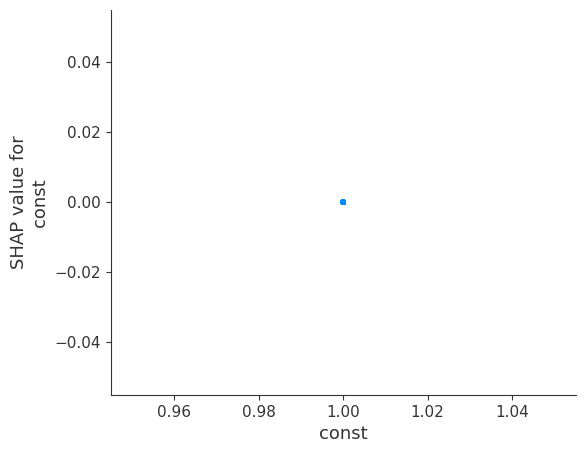

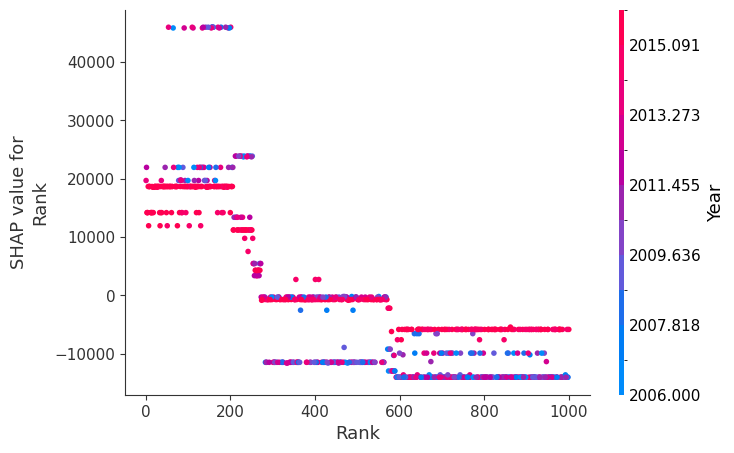

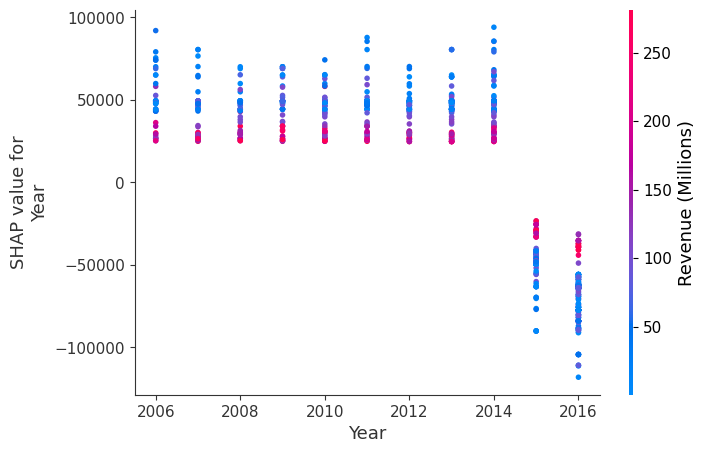

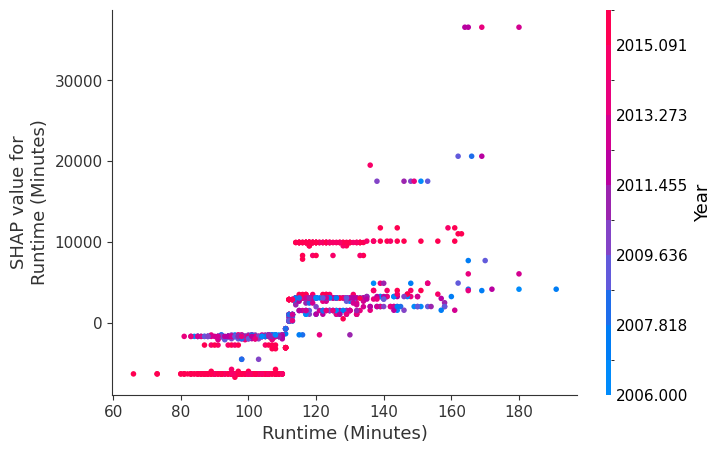

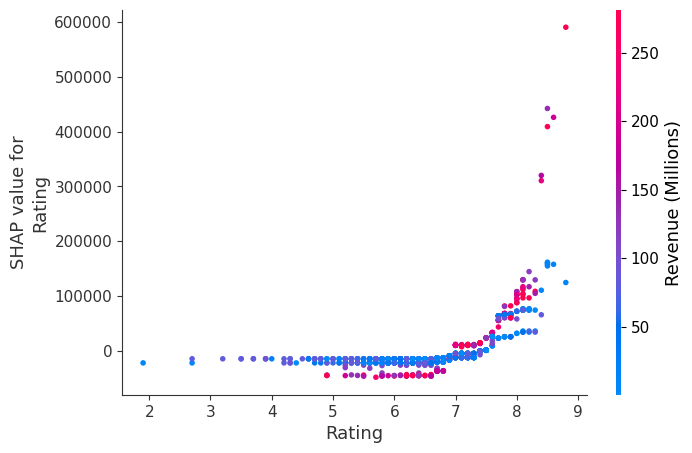

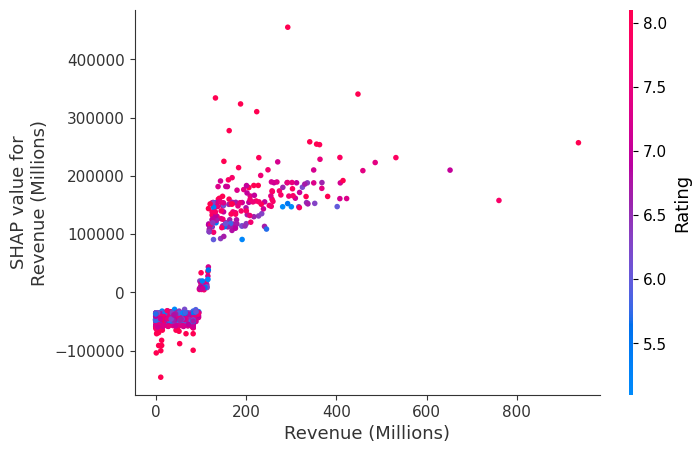

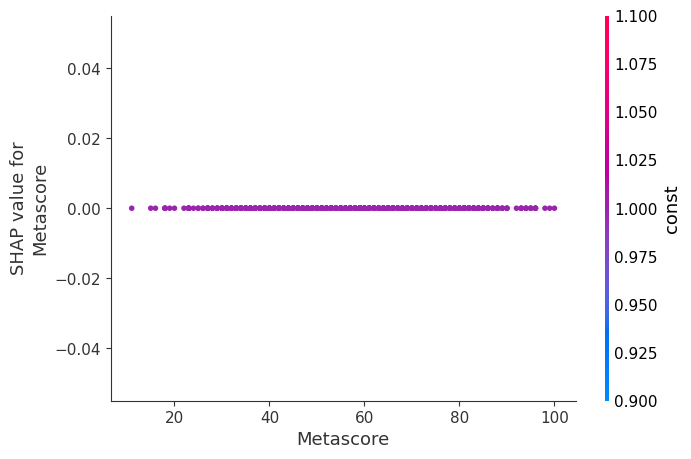

In [116]:
# SHAP partial dependence plot for a tree based model
for i in x_train.columns:
    shap.dependence_plot(i, tree_shap_values.values, x_train)

In [117]:
X_output_linear = x_test.copy()
X_output_linear.loc[:, "predict"] = np.round(
    linear_model.predict(X_output_linear), 2
)  # Attaching the output of linear model to test dataframe

X_output_tree = x_test.copy()
X_output_tree.loc[:, "predict"] = np.round(
    tree_model.predict(X_output_tree), 2
)  # Attaching the output of tree based model to test dataframe

In [118]:
# Force Plot of Tree Based Model
explainerModel = shap.TreeExplainer(tree_model)
shap_values_Model = explainerModel.shap_values(X_output_tree)


def shap_plot_tree(j):
    p = shap.force_plot(
        explainerModel.expected_value, shap_values_Model[j], X_output_tree.iloc[[j]]
    )
    return p

**Force Plot SHAP analysis**
This plot is the same as the waterfall model which we saw above the only difference is the visualization is condensed. It is really up to an individual which visualization is preferred some find this easier to read others find the waterfall model easier to read.

In [119]:
shap.initjs()  # Initializing JavaScript module
print(shap_plot_tree(18))  # SHAP force plot for sample 18

**Heatmap Visualization for Linear and Tree-based model**
This visualization is a summarization of the entire dataset on how each data point in every feature is affecting the target(Votes).

Here the Y-axis is Features
and X-axis is Instance of that feature
The color of the instance defines if it had a positive effect or negative effect by its color. If the instance is red then it had a positive effect and if the instance is blue then it had a negative effect
The intensity of the color is directly proportional to the intensity of the effect. Deeper the color, the more impactful the feature is.

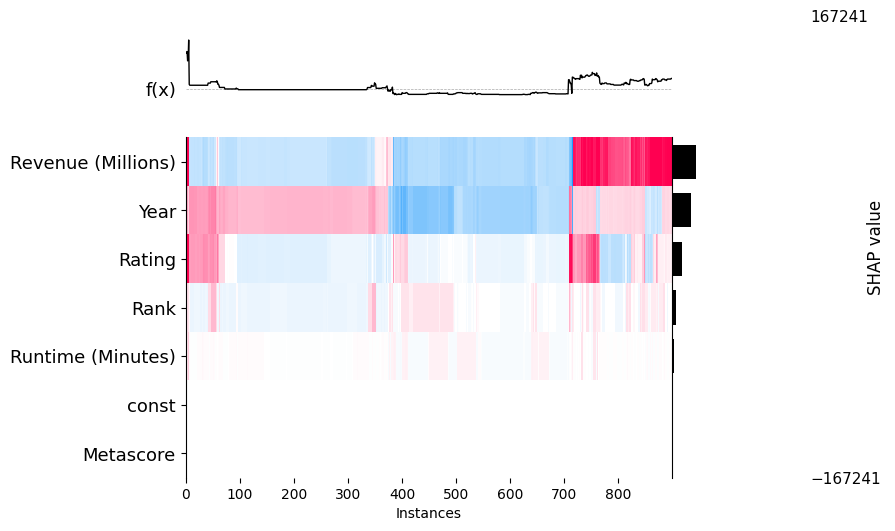

In [120]:
shap.plots.heatmap(tree_shap_values)  # SHAP HeatMap of a Tree Based Model


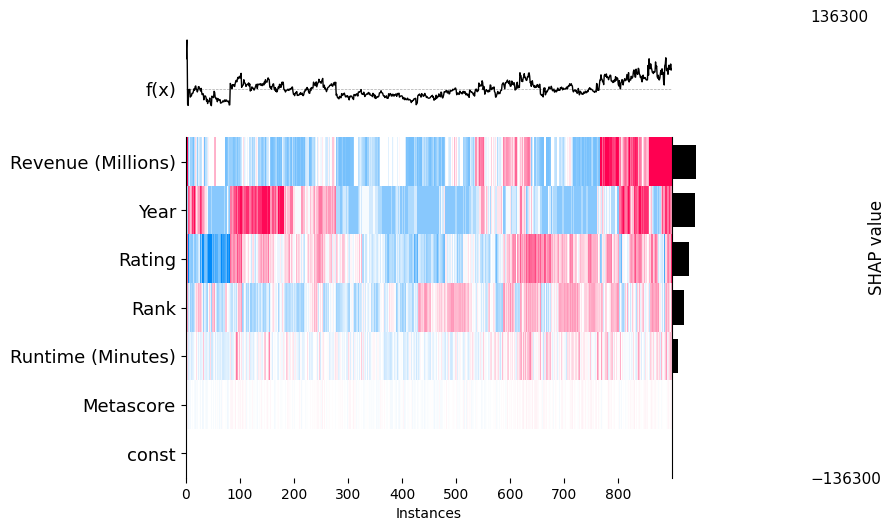

In [121]:
shap.plots.heatmap(linear_shap_values)  # SHAP heatmap for a Linear Model


**LIME (Local Interpretation Model-Agnostic Explanation) Analysis**

LIME builds a surrogate model, i.e. converts a more complicated model (say a deep tree-based model into a simple linear model) around the data points in which we are interested and then it will try to make an approximation out of this simple model on the whole model. LIME builds a local model in such a way that it can interpret the whole Black-Box

LIME works well on tabular, text, image datasets - hence it works on different datasets

Let us Interpret our Linear model and Tree-based model on sample data (sample_index = 18) using LIME and try to understand what is happening under the hood. Please refer below for Visualizations of both models

As we can see on the left-hand side LIME gives us information about the minimum and maximum values predicted by the model. The Color orange here represents positive and blue represents negative
Here for this sample as seen below alcohol, sulfate, volatile_acidity, residual_sugar harmed both linear and tree-based model
total_sulphur_dioxide, density, pH, citric_acid, had a positive effect on the quality of wine in both models
fixed_acidity, free_sulphur_dioxide, chloride had a negative effect in the linear model but positive in tree-based model
These interpretations were carried out locally in the region where of out sample data(sample_index = 18).

**LINEAR MODEL**

In [122]:
# Initializing LIME explainer for Linear Model
lime_linear_explainer = lime_tabular.LimeTabularExplainer(
    training_data=np.array(x_train), feature_names=x_train.columns, mode="regression"
)

In [123]:
# Getting LIME interpretation for a sample data
idx = 18
np_x_test = np.array(x_test)
np_y_test = np.array(y_test)
print("Prediction : ", linear_model.predict(np_x_test[0].reshape(1, -1)))
print("Actual :     ", np_y_test[idx])

lime_linear_explanation = lime_linear_explainer.explain_instance(
    np_x_test[idx], linear_model.predict, num_features=np_x_test.shape[1]
)
lime_linear_explanation


Prediction :  [35091.07266823]
Actual :      151970


X does not have valid feature names, but LinearRegression was fitted with feature names
X does not have valid feature names, but LinearRegression was fitted with feature names


In [124]:
lime_linear_explanation.show_in_notebook()  # Display Results in Notebook


**TREE BASED MODEL**

In [125]:
# Initializing LIME explainer for Tree Based Model
lime_tree_explainer = lime_tabular.LimeTabularExplainer(
    training_data=np.array(x_train), feature_names=x_train.columns, mode="regression"
)

In [126]:
# Getting LIME interpretation for a sample data
idx = 18
np_x_test = np.array(x_test)
np_y_test = np.array(y_test)
print("Prediction : ", tree_model.predict(np_x_test[0].reshape(1, -1)))
print("Actual :     ", np_y_test[idx])

lime_tree_explanation = lime_linear_explainer.explain_instance(
    np_x_test[idx], tree_model.predict, num_features=np_x_test.shape[1]
)
lime_tree_explanation

X does not have valid feature names, but RandomForestRegressor was fitted with feature names
X does not have valid feature names, but RandomForestRegressor was fitted with feature names


Prediction :  [142905.4867722]
Actual :      151970


In [127]:
lime_tree_explanation.show_in_notebook()  # Display Results in Notebook


**PDP(Partial Dependence Plot) for Linear model and Tree-based Model
Linear Model -**

Tree-Based Model - On looking at the PDP of the tree-based model, it re-affirms the interpretation we got from the PDP of the Linear Model and Best AutoML model. The only difference here is that the output doesn't vary linearly

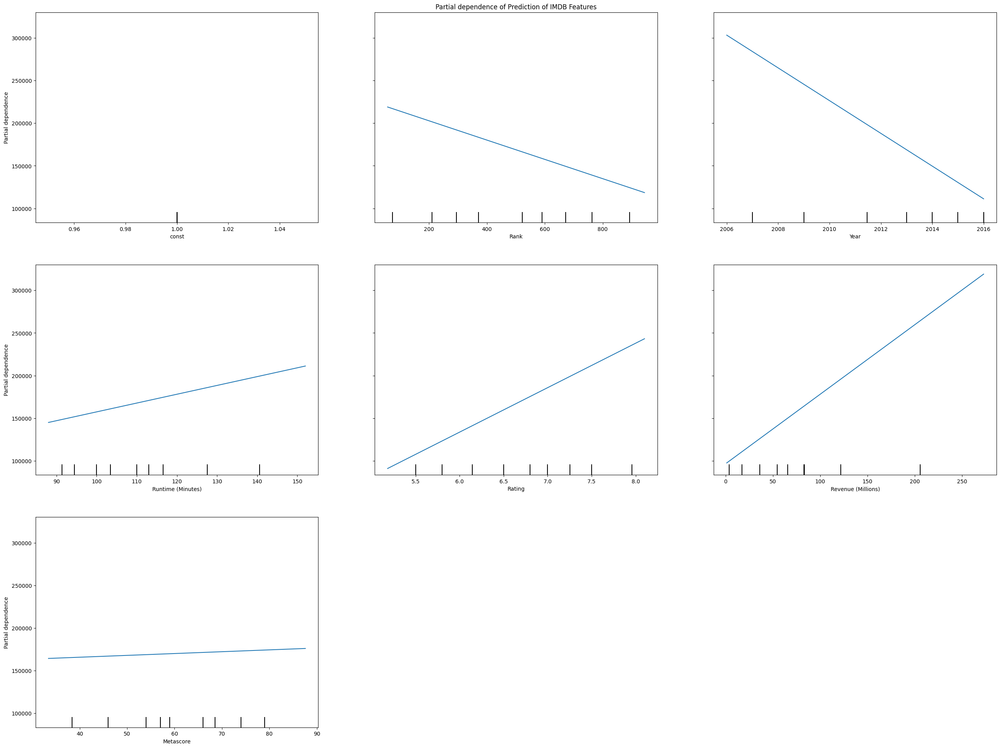

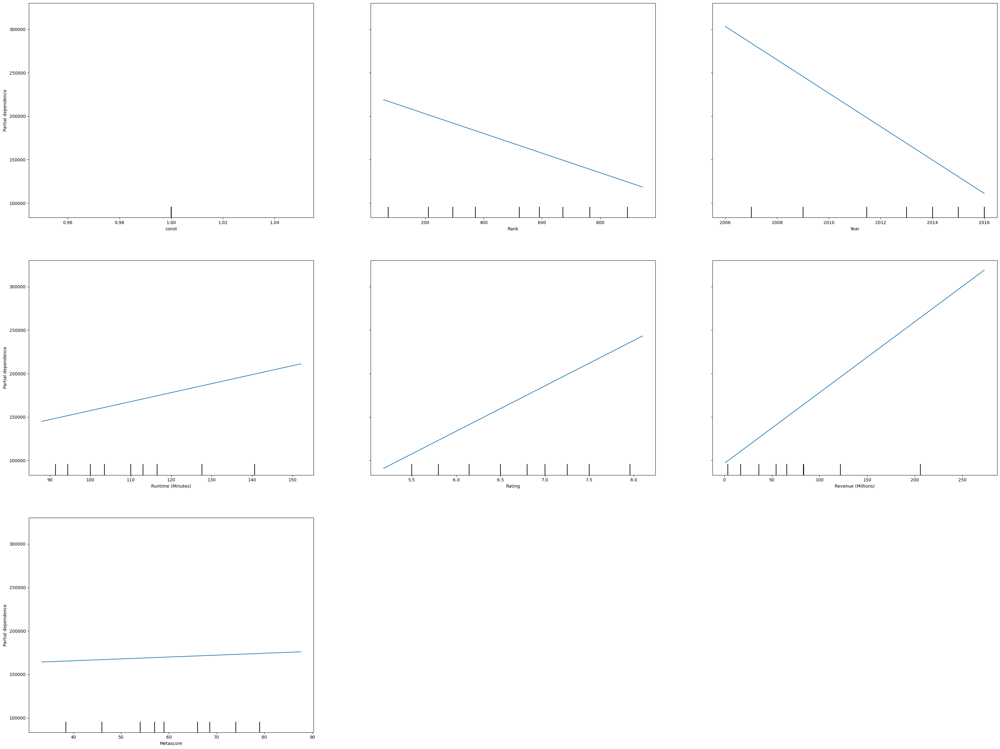

In [128]:
# PDP Plot for Linear Model
fig, ax = plt.subplots(figsize=(32, 24))
display = PartialDependenceDisplay.from_estimator(linear_model, x_test, x_test.columns, n_jobs=3, grid_resolution=20)
display.plot(ax=ax)
ax.set_title("Partial dependence of Prediction of IMDB Features")
plt.tight_layout()
plt.show()

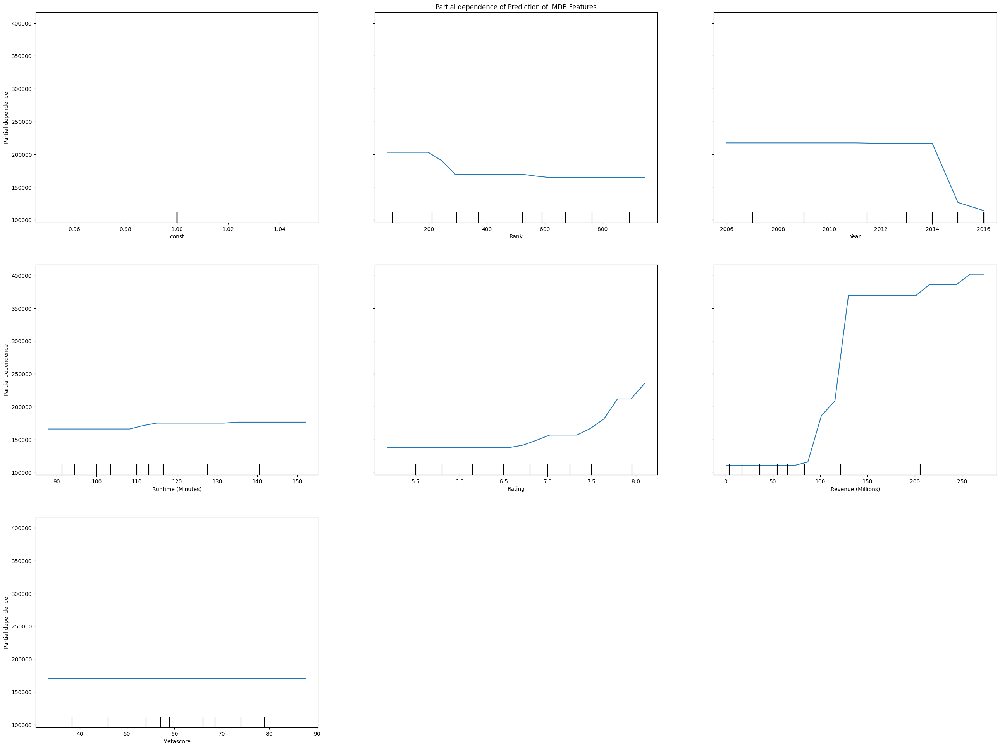

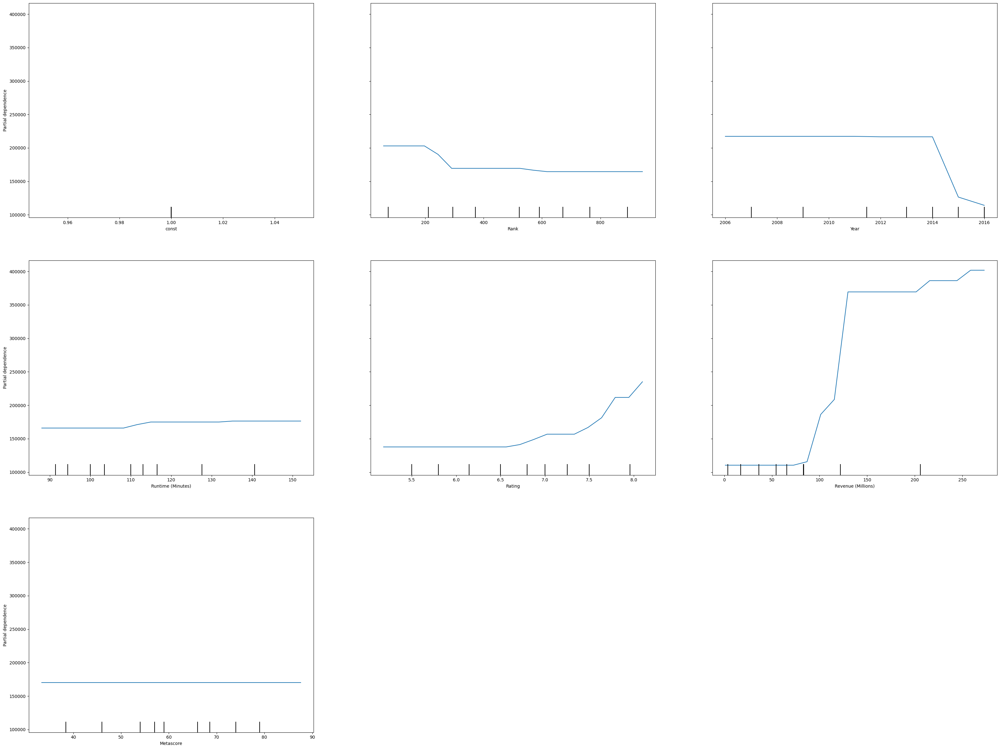

In [129]:
# PDP Plot for Tree Based Model
fig, ax = plt.subplots(figsize=(32, 24))
display = PartialDependenceDisplay.from_estimator(tree_model, x_test, x_test.columns, n_jobs=3, grid_resolution=20)
display.plot(ax=ax)
ax.set_title("Partial dependence of Prediction of IMDB Features")
plt.tight_layout()
plt.show()

Talking about the red line on the plot - When we give a sample as an input (sample_ind = 18) as an input to check the output. By plotting this we can see the difference between the model output from the expected value.

In [248]:
svm_explainer = shap.Explainer(svm_model.predict, x_train_1000)
svm_shap_values = svm_explainer(x_train_1000)

Exact explainer: 901it [04:08,  3.52it/s]


Attempting to set identical low and high xlims makes transformation singular; automatically expanding.


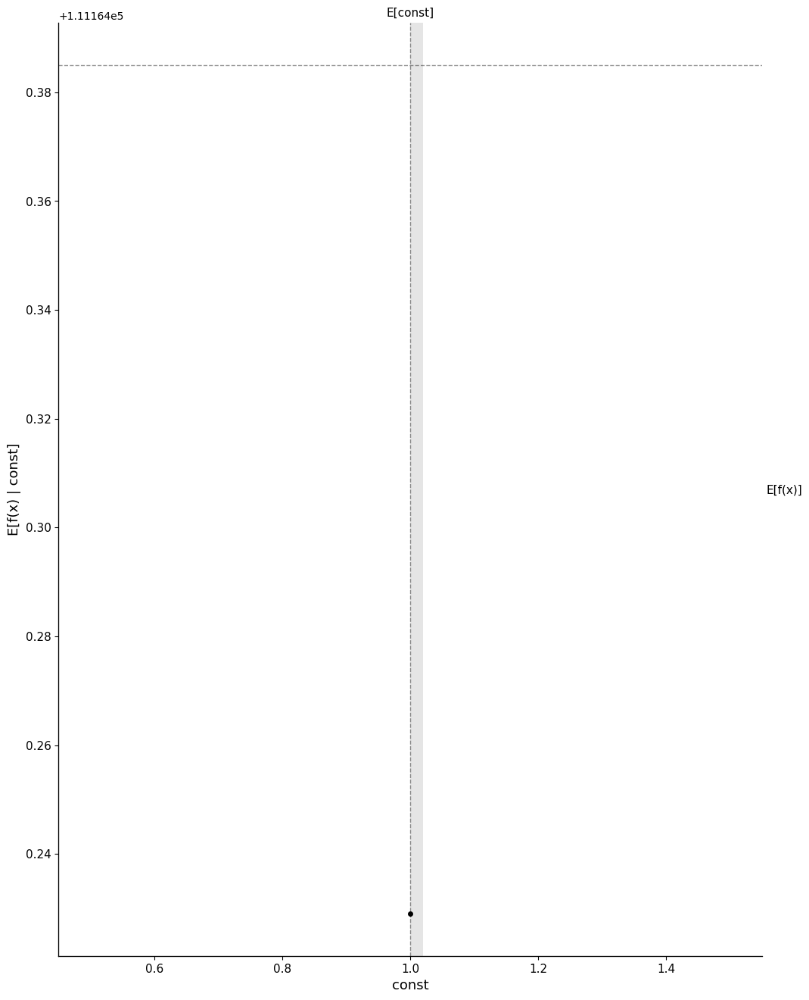

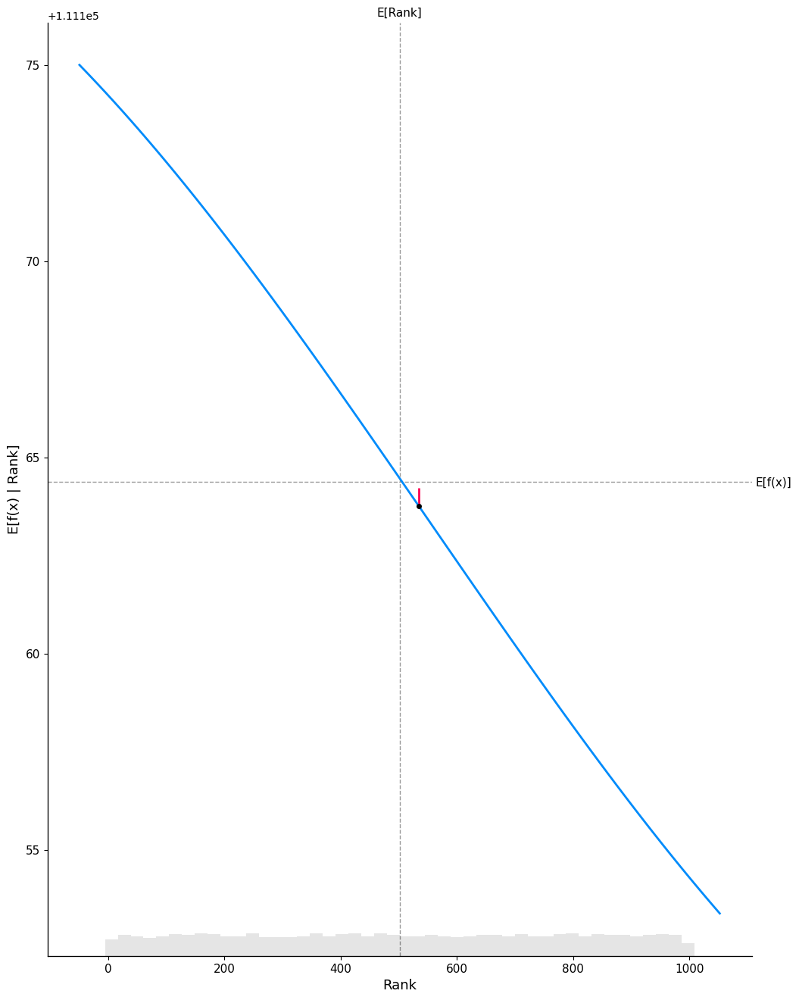

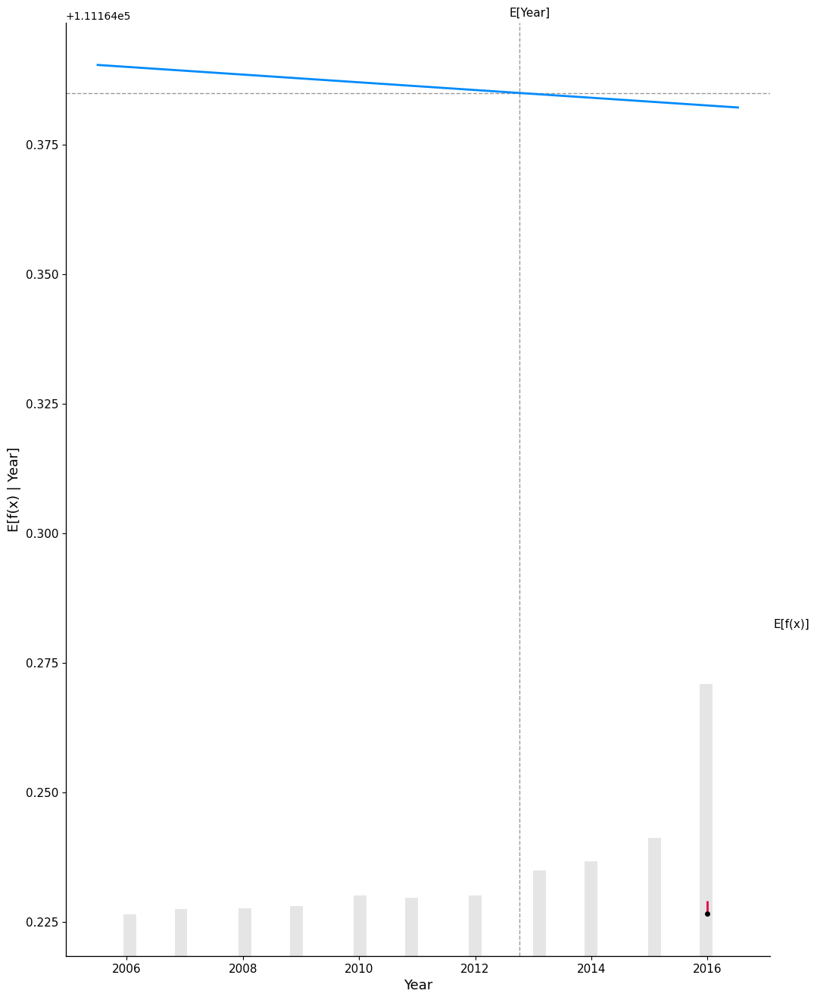

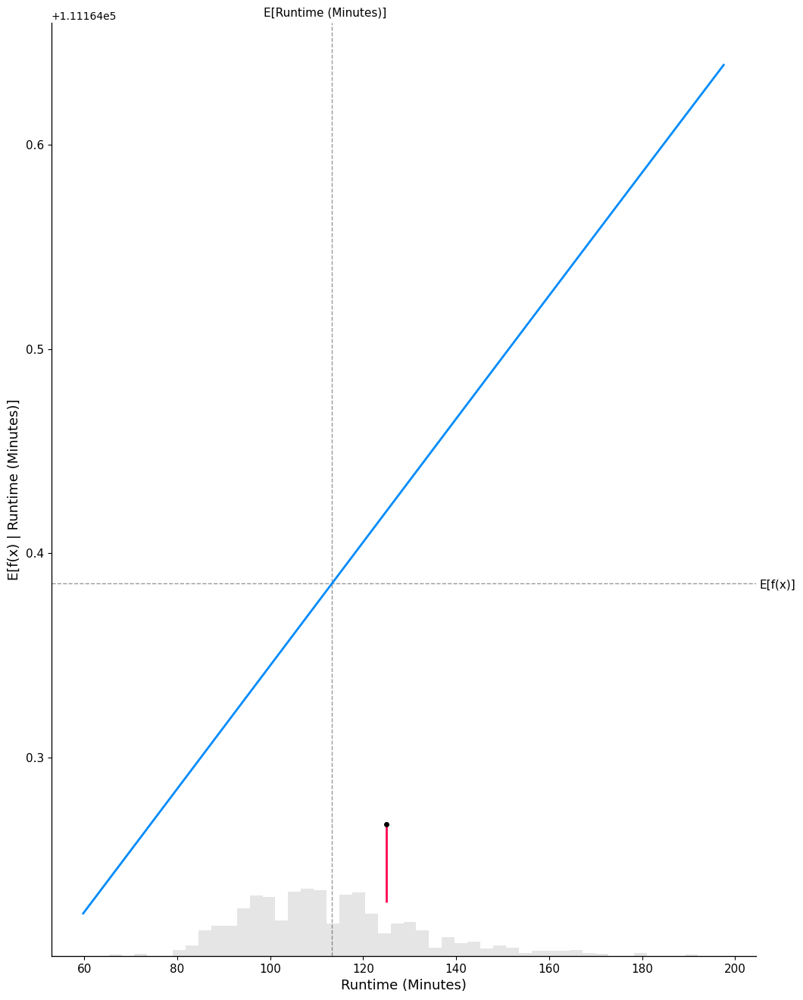

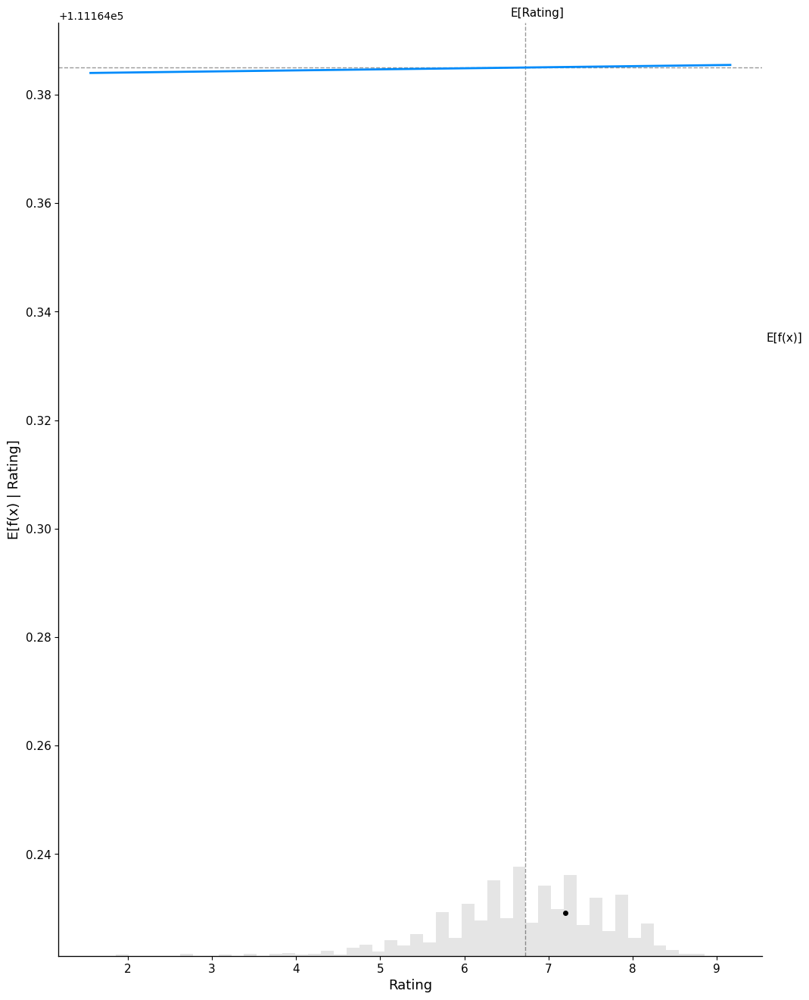

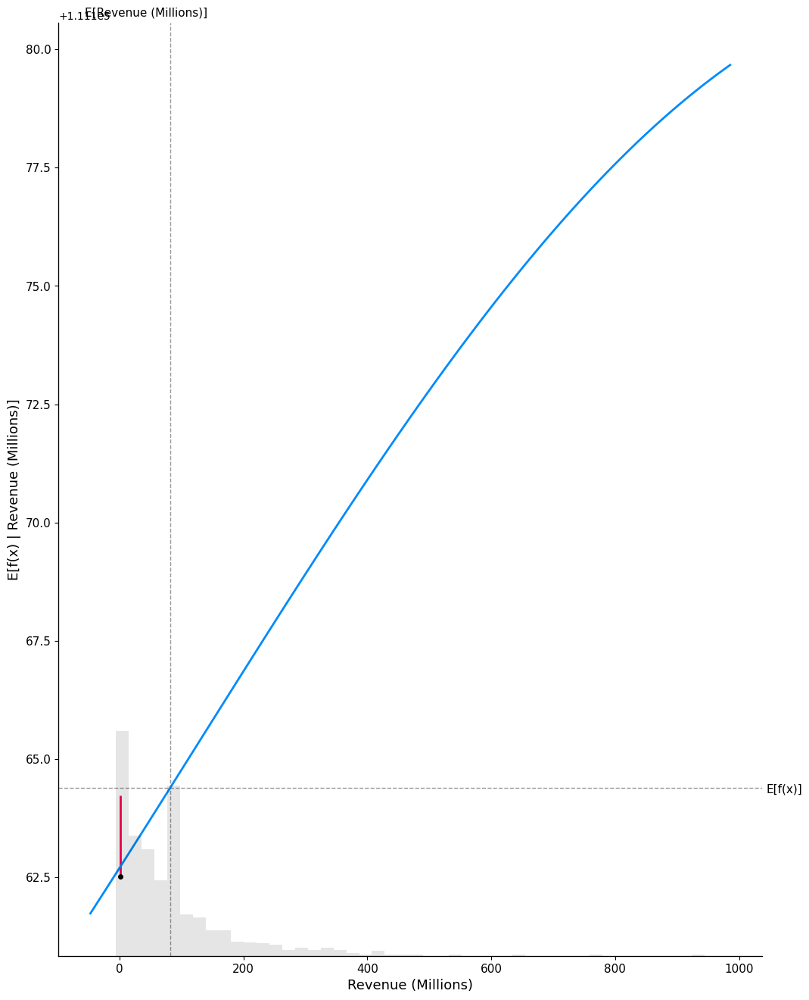

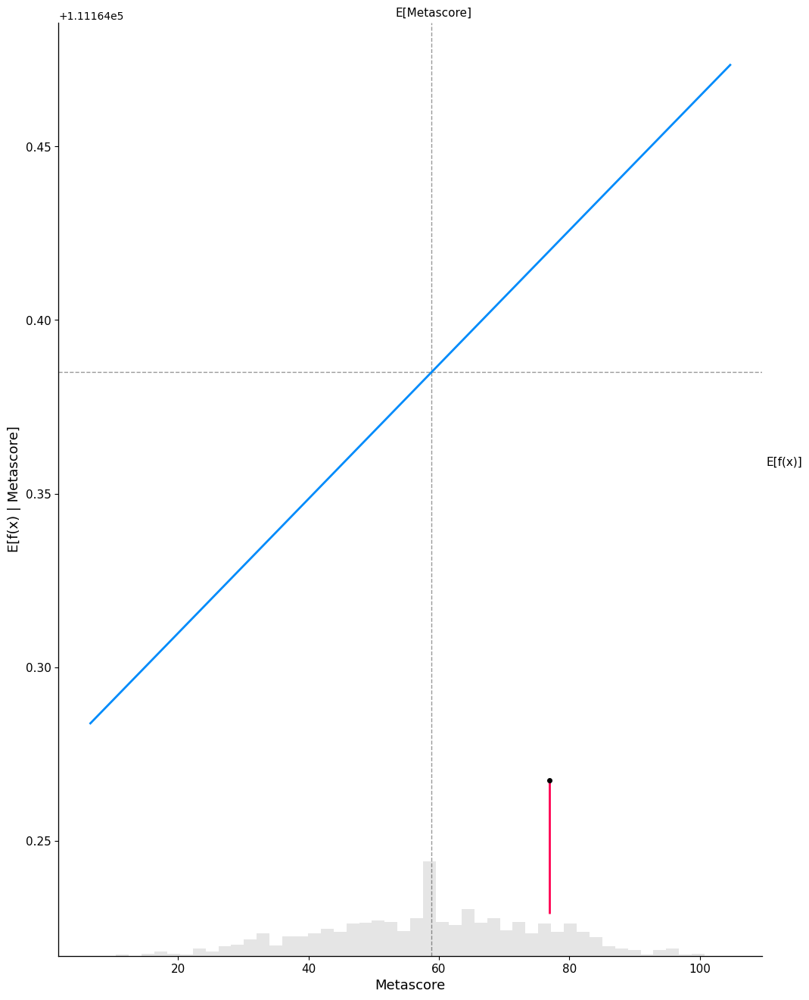

In [249]:
for i in x_train_1000.columns:
    # make a standard partial dependence plot
    sample_ind = 18
    shap.partial_dependence_plot(
        i,
        svm_model.predict,
        x_train_1000,
        model_expected_value=True,
        feature_expected_value=True,
        ice=False,
        shap_values=svm_shap_values[sample_ind : sample_ind + 1, :],
    )

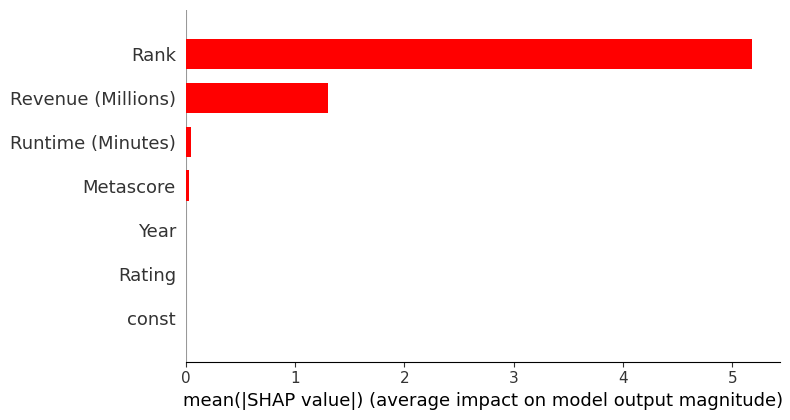

In [259]:
# SHAP variable importance for a svm Model
shap.summary_plot(svm_shap_values, x_train, plot_type="bar", color="red")

In [258]:
# Waterfall plot for svm model
def get_SHAP(index=18):
    shap.plots.waterfall(svm_shap_values[index], max_display=14)

**Interpreting Waterfall SHAP visualization**

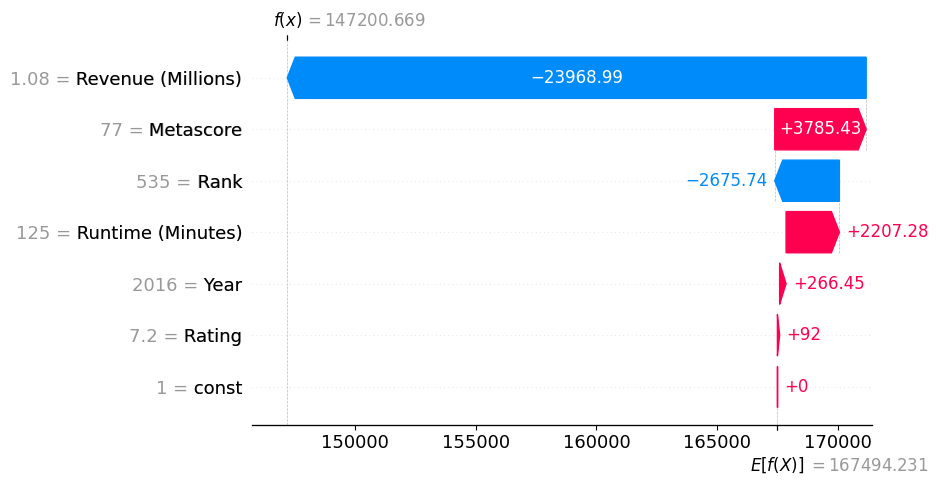

In [263]:
get_SHAP()

**Interpret the summary plot SVM Model**

Here the features are listed in descending order of their importance. This is one of the easiest ways to analyze an ML model and how the features are affecting the target and to what extent.

Each dot(both red and blue) represents a feature of a wine
Red color represents high values whereas blue color represents low value
If a dot(a feature of wine) is on the right side of the y-axis then it had a positive impact and if it is on the left side of the axis it had a negative impact
The position of a dot(a feature of wine) on the x-axis represents the intensity of impact it had, the more it is away from the axis greater the intensity.

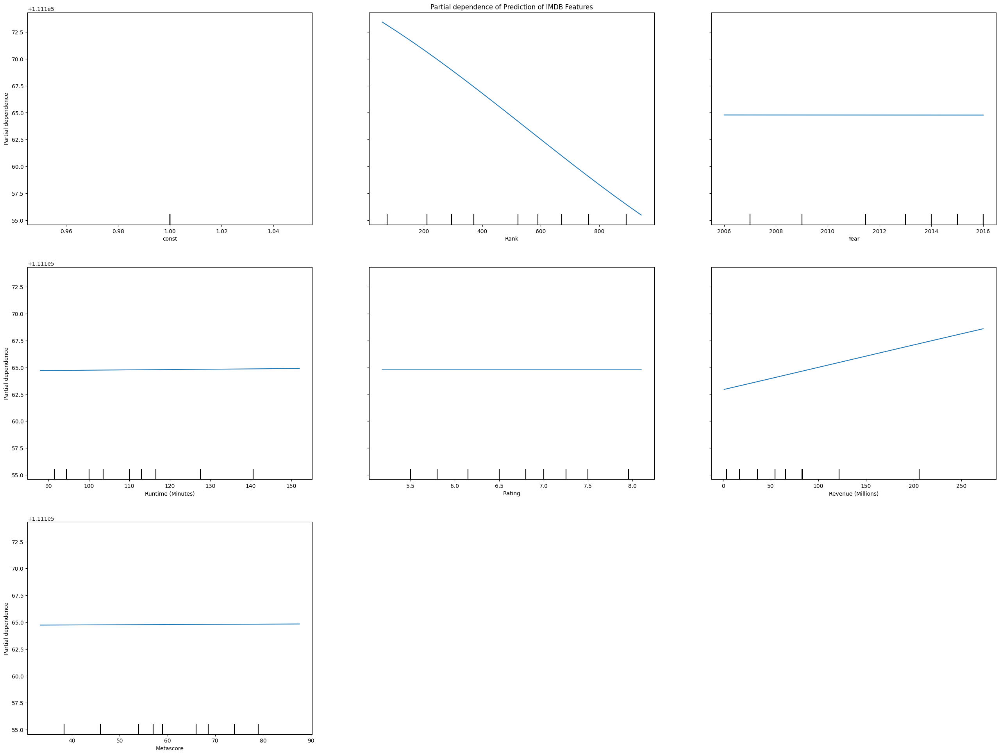

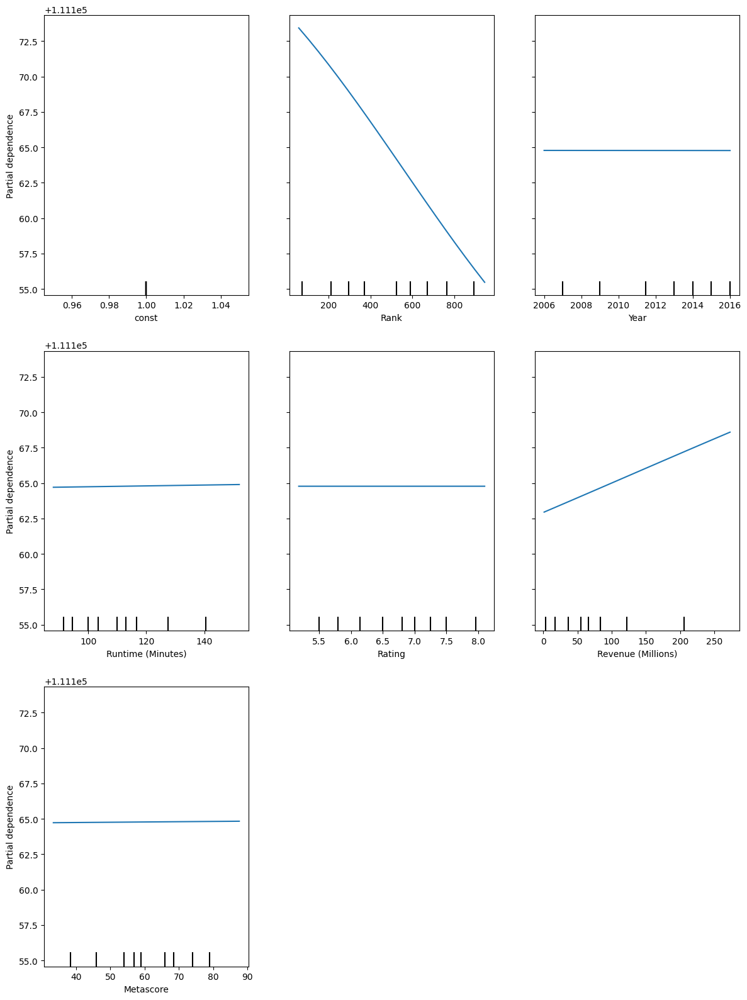

In [254]:
# PDP Plot for SVM Model

fig, ax = plt.subplots(figsize=(32, 24))
display = PartialDependenceDisplay.from_estimator(svm_model, x_test, x_test.columns, n_jobs=3, grid_resolution=20)
display.plot(ax=ax)
ax.set_title("Partial dependence of Prediction of IMDB Features")
plt.tight_layout()
plt.show()

In [256]:
mlp_explainer = shap.Explainer(regr.predict, x_train_1000)
mlp_shap_values = mlp_explainer(x_train_1000)

Exact explainer: 901it [00:11,  9.14it/s]                         


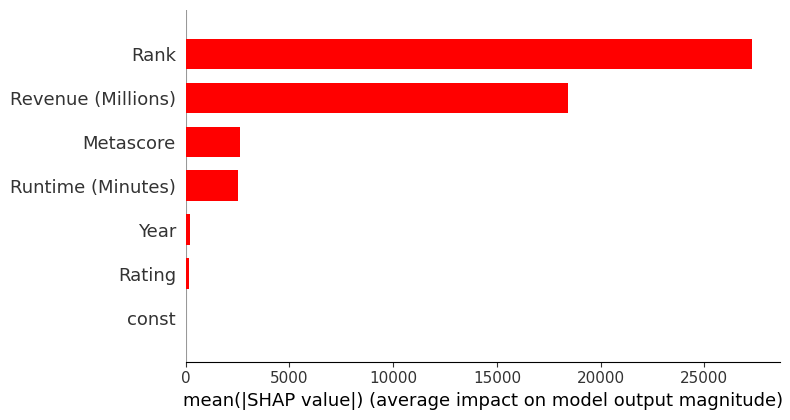

In [260]:
# SHAP variable importance for a mlp Model
shap.summary_plot(mlp_shap_values, x_train, plot_type="bar", color="red")

In [262]:
# Waterfall plot for mlp model
def get_SHAP(index=18):
    shap.plots.waterfall(mlp_shap_values[index], max_display=14)

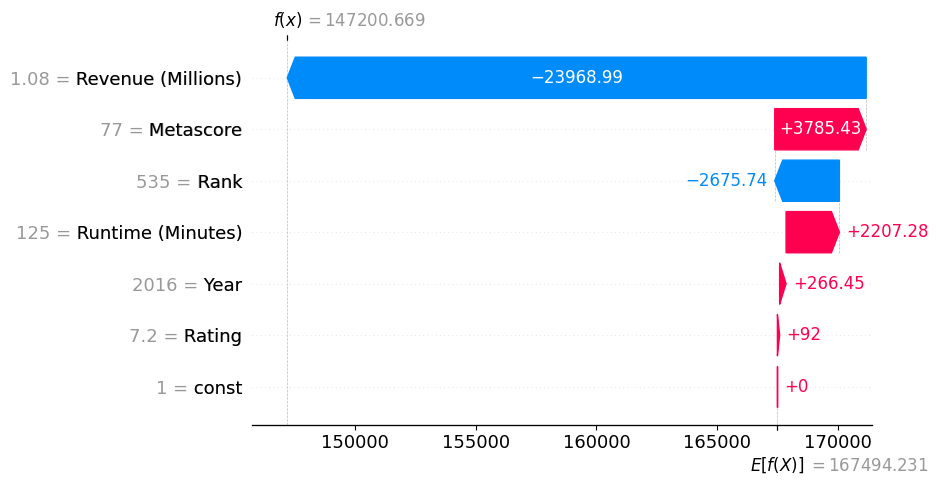

In [265]:
get_SHAP()

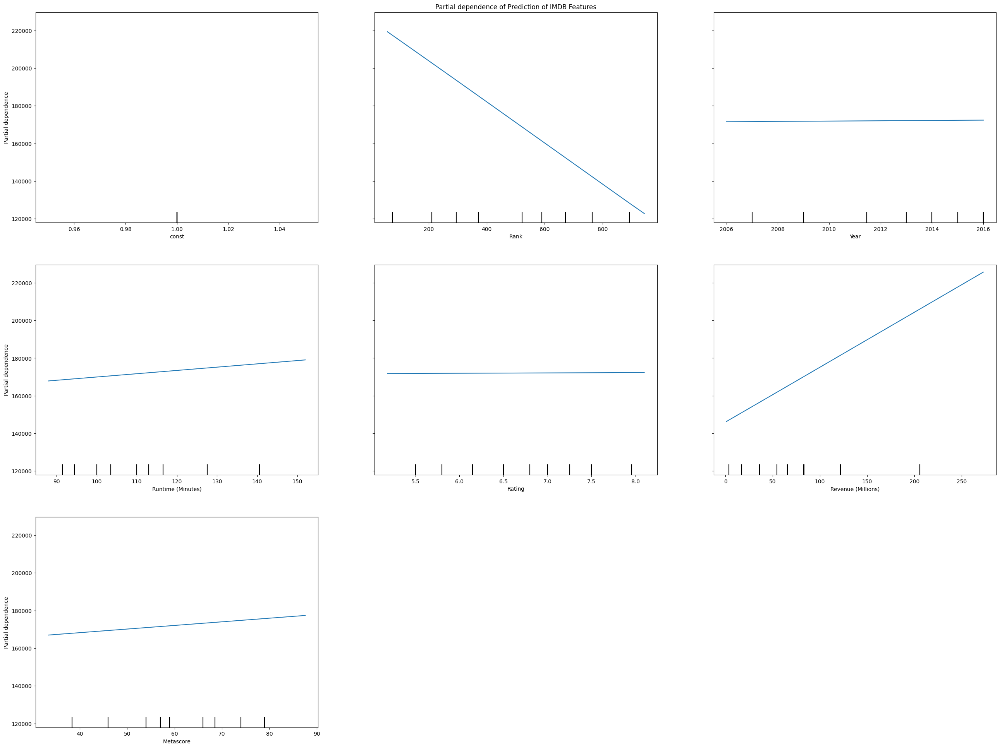

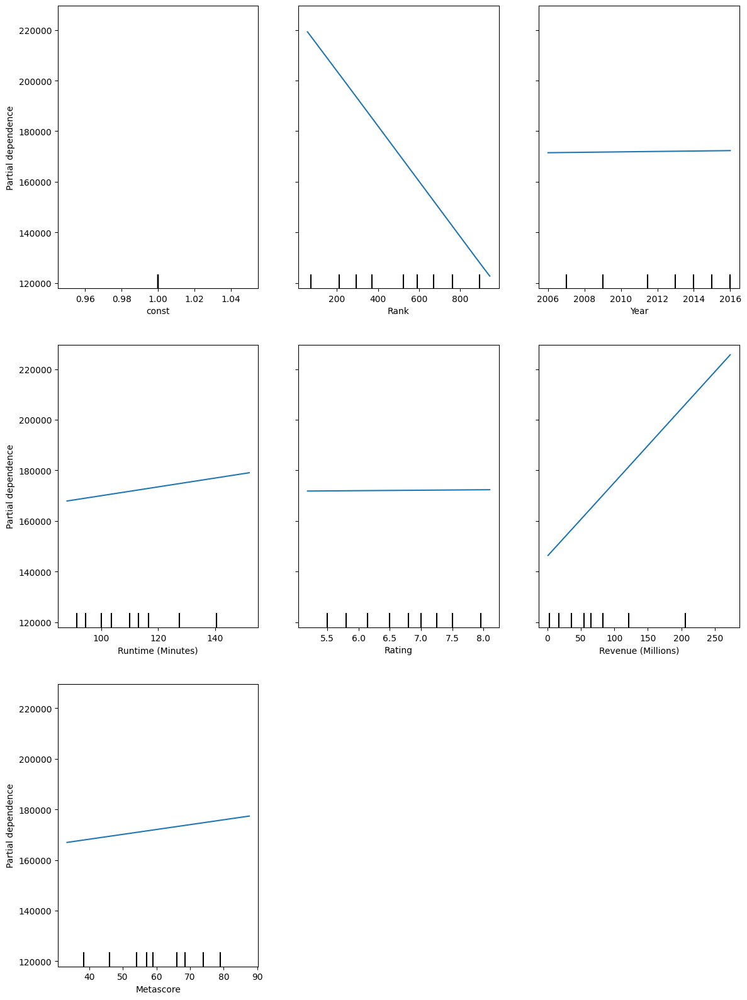

In [267]:
# PDP Plot for mlp Model

fig, ax = plt.subplots(figsize=(32, 24))
display = PartialDependenceDisplay.from_estimator(regr, x_test, x_test.columns, n_jobs=3, grid_resolution=20)
display.plot(ax=ax)
ax.set_title("Partial dependence of Prediction of IMDB Features")
plt.tight_layout()
plt.show()

# **Getting the best model using AutoML**

In [130]:
# Converting Pandas dataframe in H2O dataframe
hdf = h2o.H2OFrame(data)  

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


In [131]:
# Setting up the data split between training and test dataset
pct_rows = 0.80  
hdf_train, hdf_test = hdf.split_frame([pct_rows])

In [132]:
# Setting up AutoML
def autoML(hdf_train=100, hdf_test=100):
    X = hdf.columns
    y = "Votes"

    X.remove(y)  # Removing the result frm our predictors data
    X.remove("Rank")  # Removing Rank from the predictor's data, as it is not related

    aml = H2OAutoML(max_runtime_secs=222, seed=1)  # Setting of AutoML
    aml.train(
        x=X, y=y, training_frame= hdf_train
    )  # Trainig the dataset on different models

    return hdf_train, hdf_test, aml


# Function to get best model from the AutoML leaderboard
def getBestModel(aml):
    model_index = 0
    glm_index = 0
    glm_model = ""
    aml_leaderboard_df = aml.leaderboard.as_data_frame()
    models_dict = {}

    for m in aml_leaderboard_df["model_id"]:
        models_dict[m] = model_index
        if "StackedEnsemble" not in m:
            break
        model_index = model_index + 1

    for m in aml_leaderboard_df["model_id"]:
        if "GLM" in m:
            models_dict[m] = glm_index
            break
        glm_index = glm_index + 1

    print(model_index)
    best_model = h2o.get_model(aml.leaderboard[model_index, "model_id"])
    return best_model

In [133]:
autoML = autoML(hdf_train, hdf_test)  # Training AutoML


AutoML progress: |███████████████████████████████████████████████████████████████| (done) 100%


In [134]:
autoML[2].leaderboard  # Leaderbord of AutoML output


model_id,rmse,mse,mae,rmsle,mean_residual_deviance
StackedEnsemble_BestOfFamily_4_AutoML_2_20230408_01649,81282.7,6.60688e+09,55104.3,nan,6.60688e+09
StackedEnsemble_BestOfFamily_3_AutoML_2_20230408_01649,81302.5,6.6101e+09,55066.6,nan,6.6101e+09
GBM_5_AutoML_2_20230408_01649,81448.5,6.63385e+09,55357.4,nan,6.63385e+09
XGBoost_lr_search_selection_AutoML_2_20230408_01649_select_grid_model_2,81531.4,6.64736e+09,55128.1,nan,6.64736e+09
GBM_grid_1_AutoML_2_20230408_01649_model_2,81619.5,6.66174e+09,55199.3,nan,6.66174e+09
GBM_grid_1_AutoML_2_20230408_01649_model_12,81813.3,6.69341e+09,54406.1,nan,6.69341e+09
StackedEnsemble_AllModels_2_AutoML_2_20230408_01649,82133.8,6.74596e+09,55033.6,nan,6.74596e+09
StackedEnsemble_AllModels_3_AutoML_2_20230408_01649,83048.2,6.897e+09,57010,1.28879,6.897e+09
StackedEnsemble_AllModels_1_AutoML_2_20230408_01649,83208.6,6.92367e+09,55704.4,nan,6.92367e+09
XGBoost_grid_1_AutoML_2_20230408_01649_model_16,83278,6.93522e+09,56729.7,nan,6.93522e+09


In [135]:
autoML_model = getBestModel(autoML[2])  # Getting Best Model
print(autoML_model)

2
Model Details
H2OGradientBoostingEstimator : Gradient Boosting Machine
Model Key: GBM_5_AutoML_2_20230408_01649


Model Summary: 
    number_of_trees    number_of_internal_trees    model_size_in_bytes    min_depth    max_depth    mean_depth    min_leaves    max_leaves    mean_leaves
--  -----------------  --------------------------  ---------------------  -----------  -----------  ------------  ------------  ------------  -------------
    49                 49                          33473                  6            6            6             32            60            49.7143

ModelMetricsRegression: gbm
** Reported on train data. **

MSE: 1008841046.7620392
RMSE: 31762.258212571083
MAE: 23224.20180495242
RMSLE: NaN
Mean Residual Deviance: 1008841046.7620392

ModelMetricsRegression: gbm
** Reported on cross-validation data. **

MSE: 6633853599.246774
RMSE: 81448.47204979829
MAE: 55357.440238152136
RMSLE: NaN
Mean Residual Deviance: 6633853599.246774

Cross-Validation Metrics S

In [136]:
autoML_model.predict


<bound method ModelBase.predict of H2OGradientBoostingEstimator({'parms': {'model_id': {'__meta': {'schema_version': 3, 'schema_name': 'ModelParameterSchemaV3', 'schema_type': 'Iced'}, 'name': 'model_id', 'label': 'model_id', 'help': 'Destination id for this model; auto-generated if not specified.', 'required': False, 'type': 'Key<Model>', 'default_value': None, 'actual_value': {'__meta': {'schema_version': 3, 'schema_name': 'ModelKeyV3', 'schema_type': 'Key<Model>'}, 'name': 'GBM_5_AutoML_2_20230408_01649', 'type': 'Key<Model>', 'URL': '/3/Models/GBM_5_AutoML_2_20230408_01649'}, 'input_value': None, 'level': 'critical', 'values': [], 'is_member_of_frames': [], 'is_mutually_exclusive_with': [], 'gridable': False}, 'training_frame': {'__meta': {'schema_version': 3, 'schema_name': 'ModelParameterSchemaV3', 'schema_type': 'Iced'}, 'name': 'training_frame', 'label': 'training_frame', 'help': 'Id of the training data frame.', 'required': False, 'type': 'Key<Frame>', 'default_value': None, '

In [137]:
#Getting the best model
autoML_model.algo

'gbm'

In [138]:
print(autoML_model.r2(train=True))

0.9677113405741438


In [144]:
data=data[["Rank","Year","Rating","Votes","Revenue (Millions)","Metascore","Runtime (Minutes)"]]


In [145]:
train,test = hdf.split_frame([.9])


In [146]:
#  Set response variable and your choice of predictor variables
myY = "Revenue (Millions)"
myX = ["Rank","Year","Rating","Votes","Metascore","Runtime (Minutes)"]

#**REGULARIZATION:**

**GLM models** with Ridge and Lasso regularization techniques are commonly used in linear regression to prevent overfitting and improve the model's ability to generalize to new data. Ridge regularization works by adding a penalty term to the least-squares objective function of the linear regression model that is proportional to the square of the magnitude of the coefficients. This penalty term helps to shrink the coefficients towards zero, thereby reducing the effect of correlated input variables and improving the model's performance. The strength of the penalty is controlled by a hyperparameter that needs to be tuned to optimize performance. Lasso regularization, on the other hand, adds a penalty term proportional to the absolute value of the coefficients, which can set some coefficients to exactly zero and effectively remove irrelevant variables from the model. The main difference between Ridge and Lasso regularization is the type of penalty function used, with Ridge using L2 regularization and Lasso using L1 regularization. The choice between these techniques depends on the specific problem and input variables.

In [157]:
from h2o.estimators.glm import H2OGeneralizedLinearEstimator

params = {"family": "gaussian", "nfolds": 5}

imdb_glm = H2OGeneralizedLinearEstimator(lambda_=0, compute_p_values=True, **params)
imdb_glm_regularization_ridge = H2OGeneralizedLinearEstimator(alpha=0, **params)
imdb_glm_regularization_lasso = H2OGeneralizedLinearEstimator(alpha=1, **params)
imdb_glm_regularization_lamba_search = H2OGeneralizedLinearEstimator(lambda_search=True)

This code defines several H2O GLM models with a common set of hyperparameters by first creating a dictionary params that contains the common parameters, including the family type (gaussian) and the number of cross-validation folds (nfolds) set to 5.

The H2OGeneralizedLinearEstimator function is then used to create four different GLM models, each with a slightly different set of hyperparameters:

imdb_glm is a GLM model with Elastic Net regularization, set by the lambda_=0 parameter and with compute_p_values set to True. The **params syntax at the end of the line passes the dictionary of common parameters to the H2OGeneralizedLinearEstimator function, which will apply those parameters to this model.

imdb_glm_regularization_ridge is a GLM model with Ridge regularization, set by the alpha=0 parameter. It also uses the common parameters defined in the params dictionary.

imdb_glm_regularization_lasso is a GLM model with LASSO regularization, set by the alpha=1 parameter. It also uses the common parameters defined in the params dictionary.

imdb_glm_regularization_lamba_search is a GLM model that uses lambda search to automatically determine the optimal value for the regularization parameter lambda. It does not specify any of the common hyperparameters, so they will default to their H2O library defaults.

By using a dictionary to define the common hyperparameters, the code simplifies the process of creating multiple similar models with slightly different hyperparameters, reducing code duplication and making the code easier to read and maintain.

In [198]:
hdf.isna().sum()


0.0

In [199]:
hdf.describe()


Rows:1000
Cols:7

,Rank,Year,Rating,Votes,Revenue (Millions),Metascore,Runtime (Minutes)
type,int,int,real,int,real,real,int
mins,1.0,2006.0,1.9,61.0,0.0,11.0,66.0
mean,500.5,2012.782999999999,6.723199999999997,169808.2550000001,82.95637614678903,58.98504273504268,113.17200000000001
maxs,1000.0,2016.0,9.0,1791916.0,936.63,100.0,191.0
sigma,288.8194360957494,3.2059615077522667,0.945428789277963,188762.6475182208,96.41204294886714,16.63485825330044,18.810908172288404
zeros,0,0,0,0,1,0,0
missing,0,0,0,0,0,0,0
0,1.0,2014.0,8.1,757074.0,333.13,76.0,121.0
1,2.0,2012.0,7.0,485820.0,126.46,65.0,124.0
2,3.0,2016.0,7.3,157606.0,138.12,62.0,117.0


In [158]:
# Build simple GLM model
data_glm = H2OGeneralizedLinearEstimator(family="gaussian", standardize=True)
data_glm.train(x               =myX,
               y               =myY,
               training_frame  =train,
               validation_frame=test)

glm Model Build progress: |██████████████████████████████████████████████████████| (done) 100%


Model Details
=============
H2OGeneralizedLinearEstimator : Generalized Linear Modeling
Model Key: GLM_model_python_1680910787497_53


GLM Model: summary
    family    link      regularization                               number_of_predictors_total    number_of_active_predictors    number_of_iterations    training_frame
--  --------  --------  -------------------------------------------  ----------------------------  -----------------------------  ----------------------  ----------------
    gaussian  identity  Elastic Net (alpha = 0.5, lambda = 0.1148 )  6                             6                              1                       py_36_sid_a7a6

ModelMetricsRegressionGLM: glm
** Reported on train data. **

MSE: 5617.61369144578
RMSE: 74.95074176714851
MAE: 51.22052108284931
RMSLE: 1.4320875866685194
Mean Residual Deviance: 5617.61369144578
R^2: 0.3953683877180465
Null degrees of freedom: 914
Residual degrees of freedom: 908
Null deviance: 8501236.824640213
Residual deviance: 5140116.527672889
AIC: 10512.458467791432

ModelMetricsRegressionGLM: glm
** Reported on validation data. **

MSE: 3958.382149919727
RMSE: 62.9156749142829
MAE: 47.7828326088195
RMSLE: 1.4203359310856374
Mean Residual Deviance: 3958.382149919727
R^2: 0.5709586656689258
Null degrees of freedom: 84
Residual degrees of freedom: 78
Null deviance: 784799.2028000136
Residual deviance: 336462.4827431768
AIC: 961.3247578302432

Scoring History: 
    timestamp            duration    iterations    negative_log_likelihood    objective          training_rmse      training_deviance    training_mae       training_r2         validation_rmse    validation_deviance    validation_mae    validation_r2
--  -------------------  ----------  ------------  -------------------------  -----------------  -----------------  -------------------  -----------------  ------------------  -----------------  ---------------------  ----------------  ------------------
    2023-04-08 00:31:47  0.000 sec   0             8501236.823868118          9290.969206413243
    2023-04-08 00:31:47  0.005 sec   1                                                           74.95074176714851  5617.61369144578     51.22052108284931  0.3953683877180465  62.9156749142829   3958.382149919727      47.7828326088195  0.5709586656689258

Variable Importances: 
variable           relative_importance    scaled_importance    percentage
-----------------  ---------------------  -------------------  ------------
Votes              62.3464                1                    0.64313
Rating             14.2545                0.228634             0.147041
Year               10.6508                0.170833             0.109868
Rank               4.92939                0.0790646            0.0508488
Runtime (Minutes)  3.97936                0.0638266            0.0410488
Metascore          0.781719               0.0125383            0.00806377

[tips]
Use `model.explain()` to inspect the model.
--
Use `h2o.display.toggle_user_tips()` to switch on/off this section.

# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

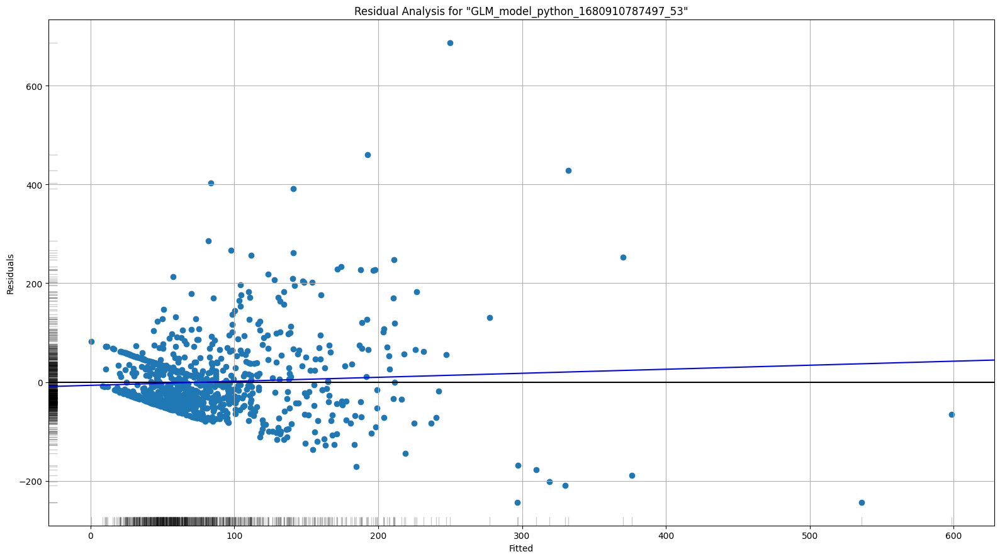

# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

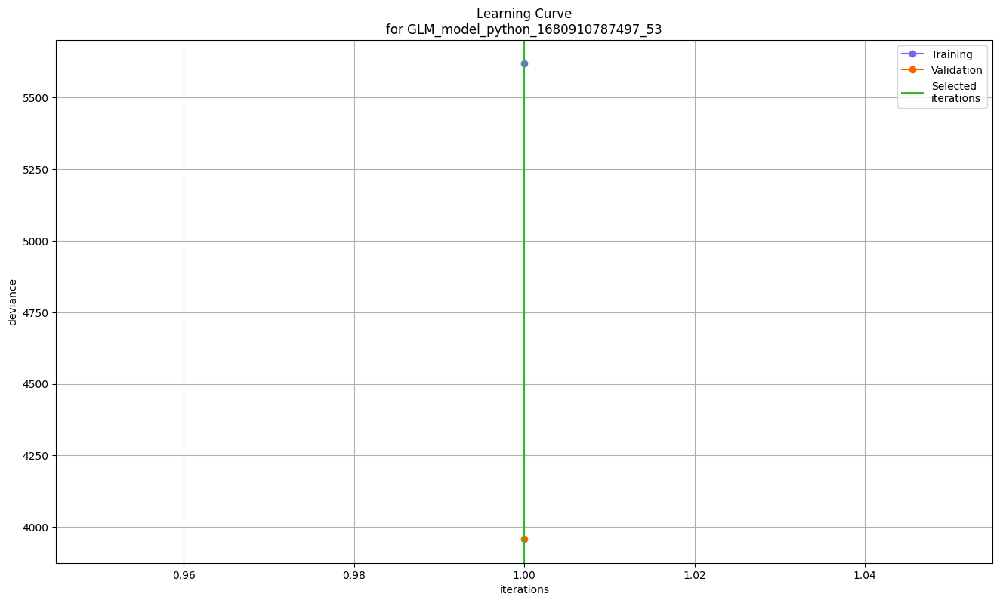

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

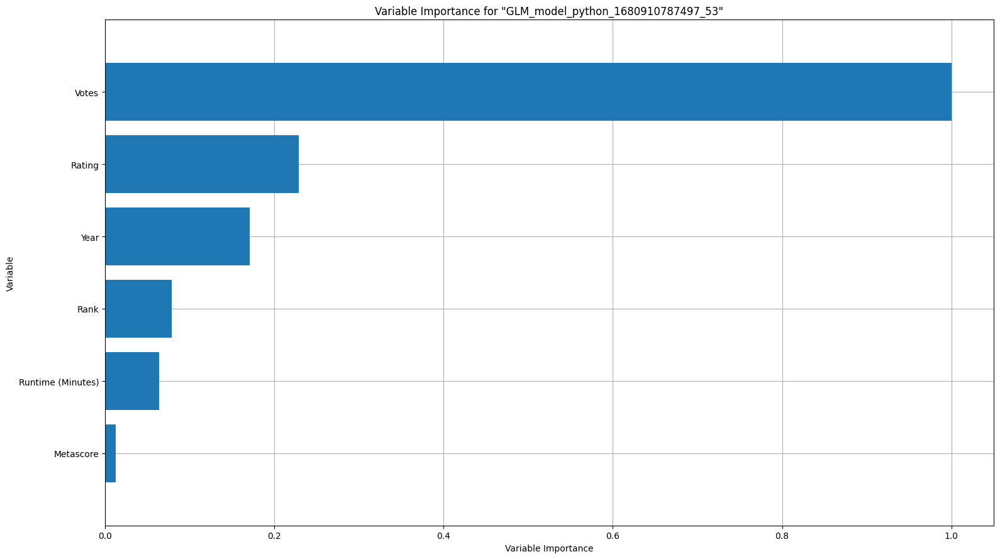

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

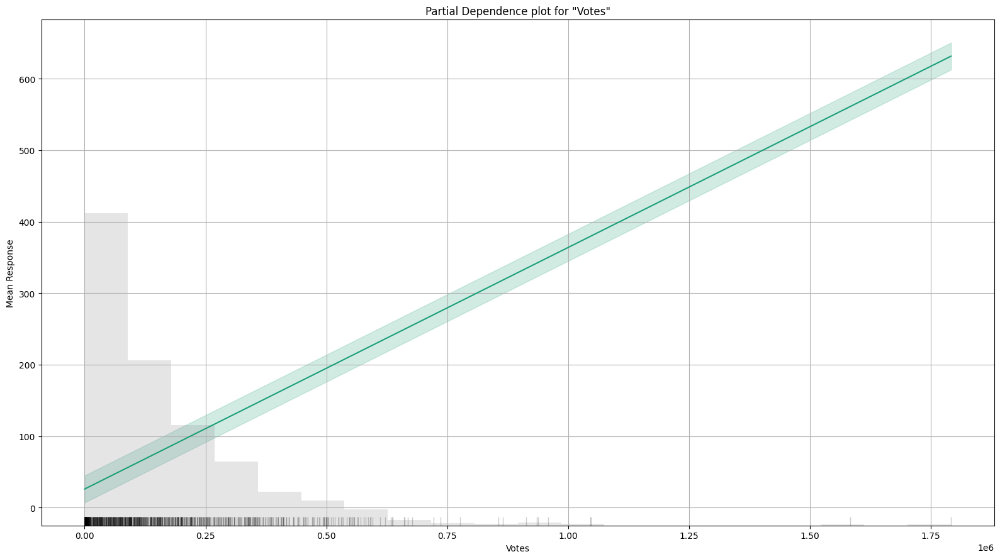

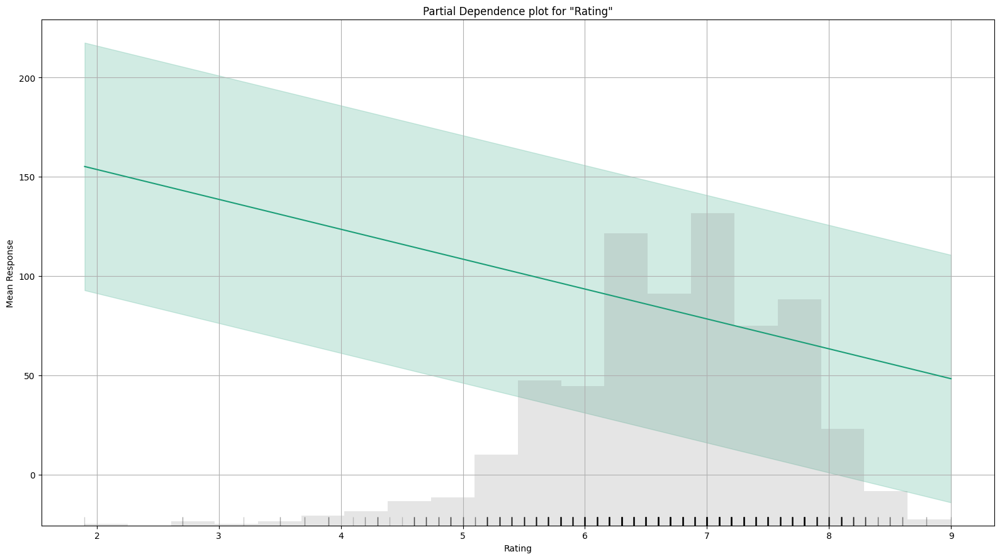

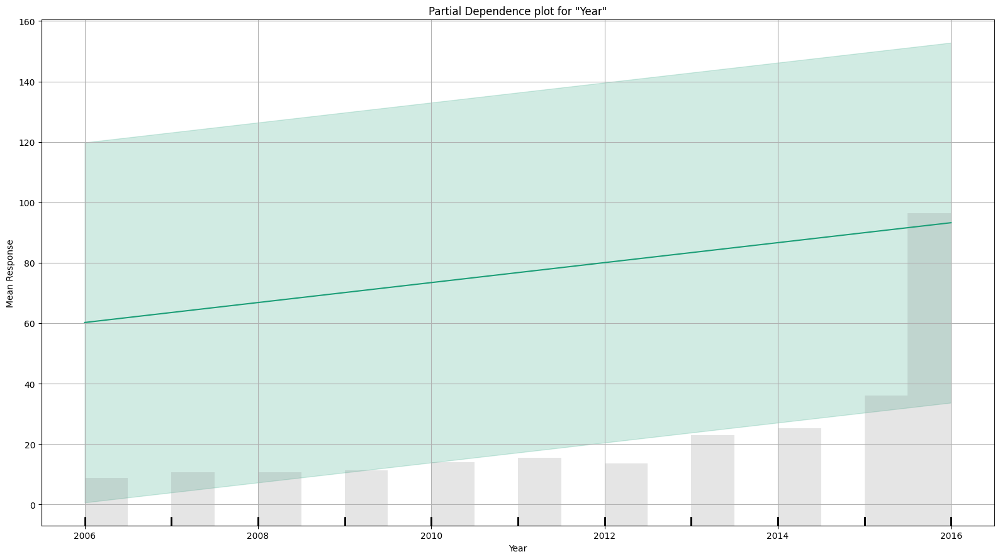

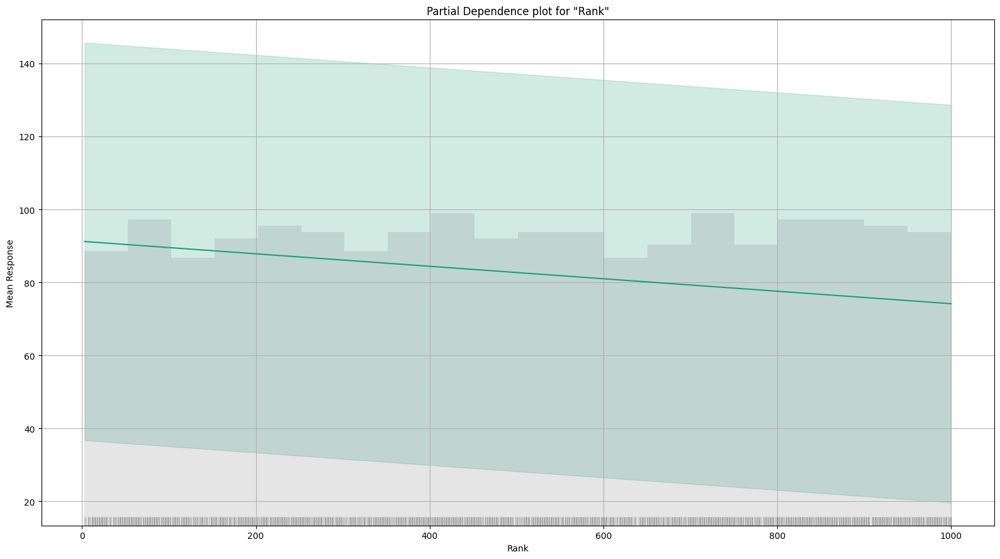

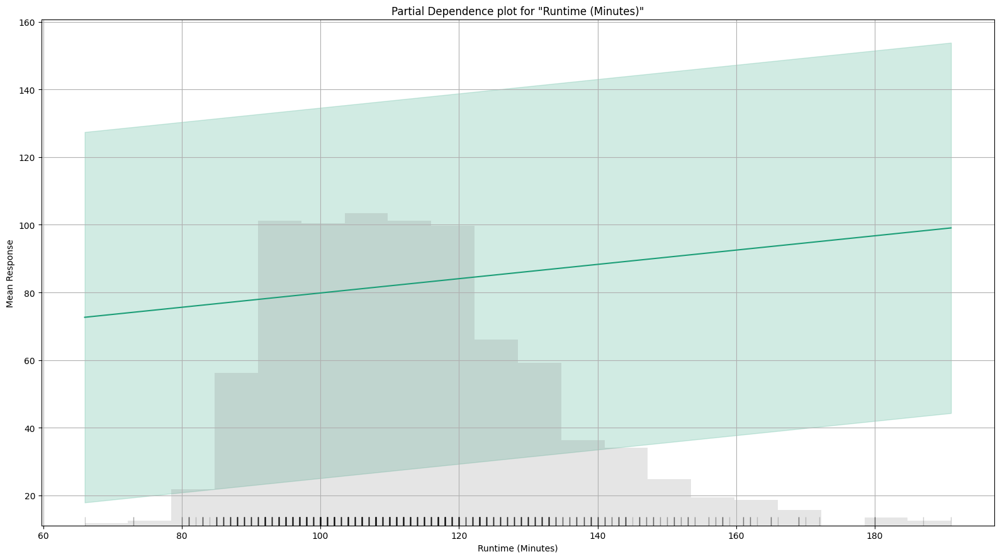

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

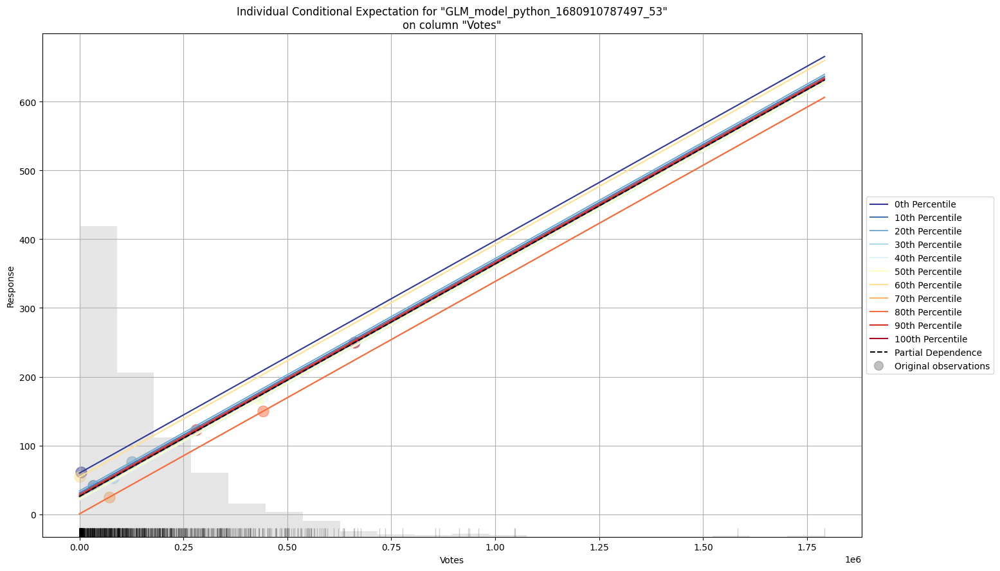

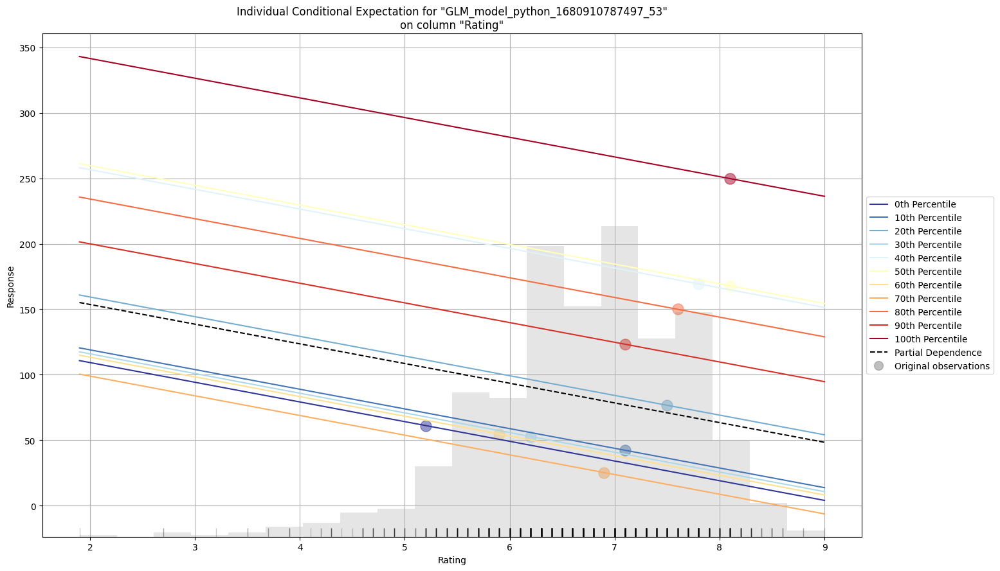

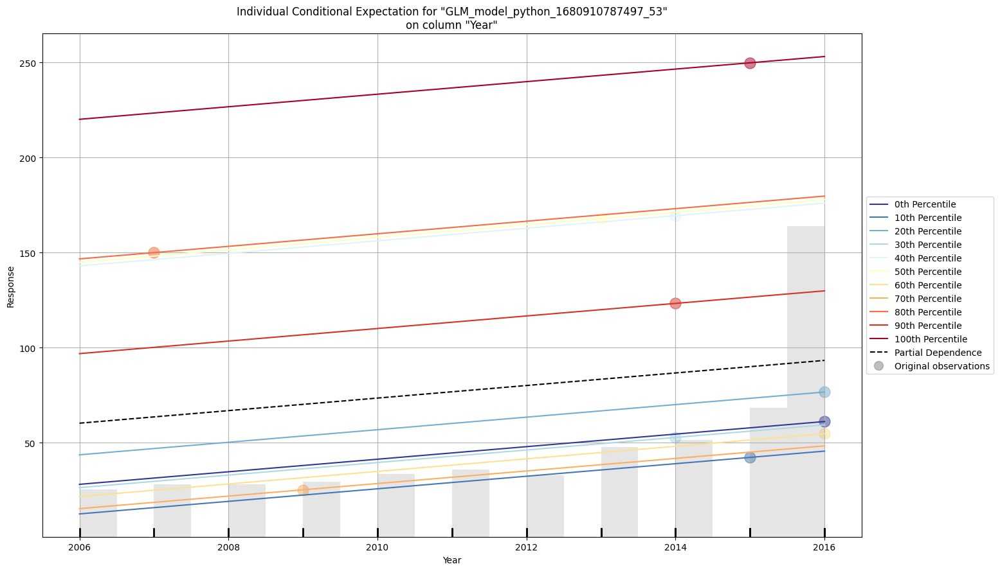

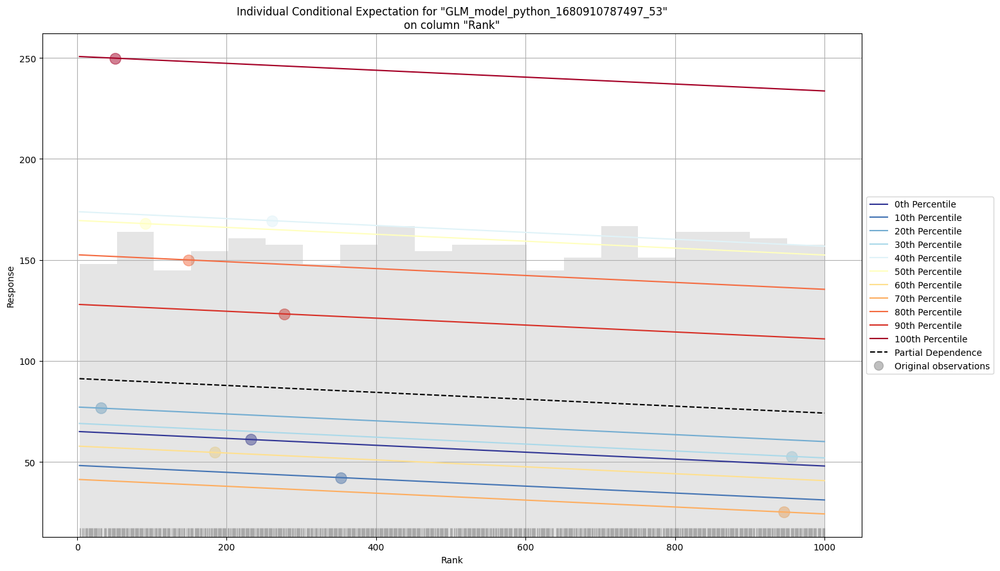

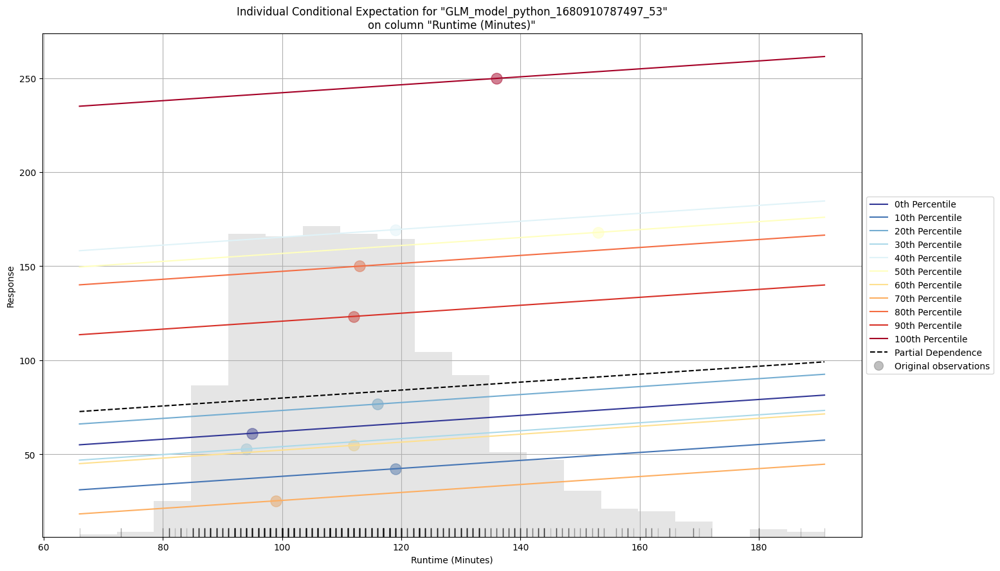

# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

In [159]:
data_glm.explain(train[1:1000,:])


**GBM Model Gradient Boosting Machine (for Regression and Classification)** is a forward learning ensemble method. The guiding heuristic is that good predictive results can be obtained through increasingly refined approximations. H2O’s GBM sequentially builds regression trees on all the features of the dataset in a fully distributed way - each tree is built in parallel.

In [147]:
# Building a simple GBM model

from h2o.estimators import H2OGradientBoostingEstimator

# Initialize the GBM model with hyperparameters
model_gbm = H2OGradientBoostingEstimator(
                balance_classes=True,
                ntrees=1000,
                max_depth=1,
                learn_rate=0.1,
                min_rows=2)

# Train the GBM model on the training data
model_gbm.train(x=myX,
                y=myY,
                training_frame = hdf_train,
                validation_frame = hdf_test)

gbm Model Build progress: |██████████████████████████████████████████████████████| (done) 100%


,number_of_trees,number_of_internal_trees,model_size_in_bytes,min_depth,max_depth,mean_depth,min_leaves,max_leaves,mean_leaves
,1000.0,1000.0,84826.0,1.0,1.0,1.0,2.0,2.0,2.0
,timestamp,duration,number_of_trees,training_rmse,training_mae,training_deviance,validation_rmse,validation_mae,validation_deviance
,2023-04-08 00:20:51,0.013 sec,0.0,96.3086313,62.7579612,9275.3524672,96.5897367,64.0915934,9329.5772410
,2023-04-08 00:20:51,0.016 sec,1.0,93.5934475,61.0683508,8759.7334075,93.7086450,62.2599885,8781.3101479
,2023-04-08 00:20:51,0.017 sec,2.0,91.3349974,59.6437399,8342.0817534,91.3105323,60.7628218,8337.6133072
,2023-04-08 00:20:51,0.020 sec,3.0,89.3997572,58.2342882,7992.3165844,89.2497744,59.5384829,7965.5222322
,2023-04-08 00:20:51,0.022 sec,4.0,87.6987538,57.3920871,7691.0714174,87.7562099,58.5943459,7701.1523778
,2023-04-08 00:20:51,0.024 sec,5.0,86.1985629,56.3240346,7430.1922394,86.1474569,57.7665068,7421.3843354
,2023-04-08 00:20:51,0.026 sec,6.0,84.8855372,55.7232000,7205.5544327,85.0644426,57.2531749,7235.9593966
,2023-04-08 00:20:51,0.027 sec,7.0,83.7110834,54.9982344,7007.5454851,83.8565324,56.8211406,7031.9180228


# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

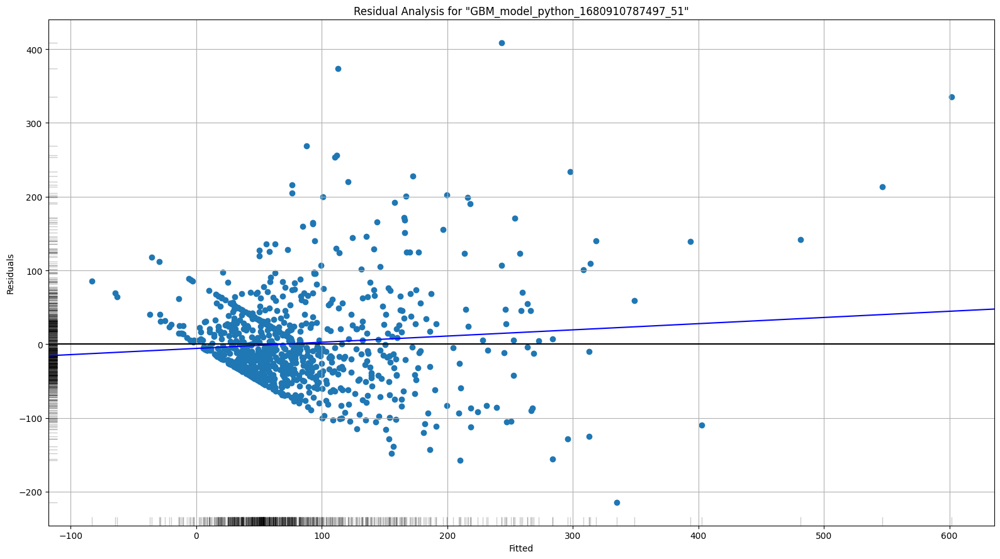

# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

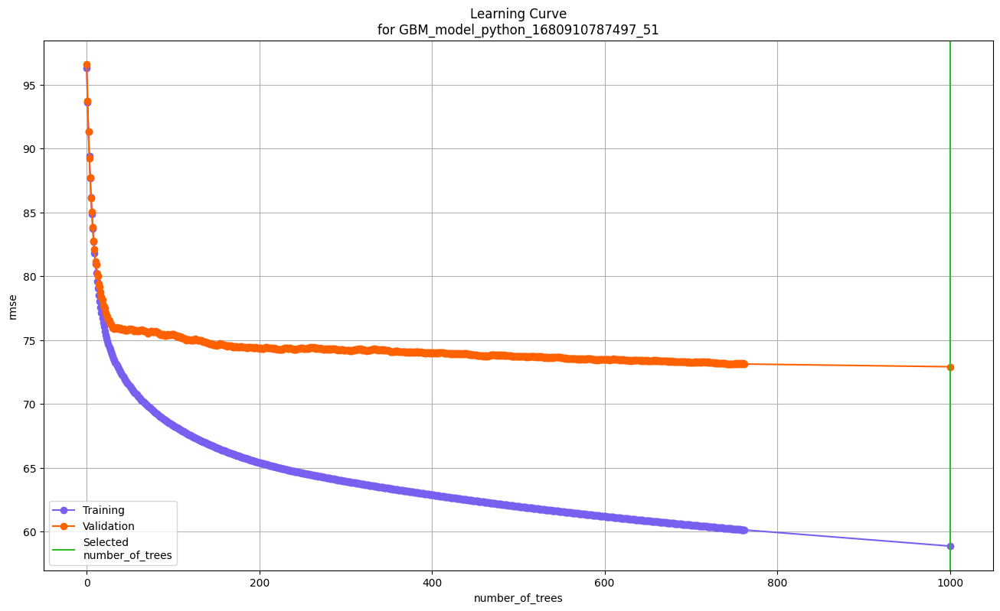

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

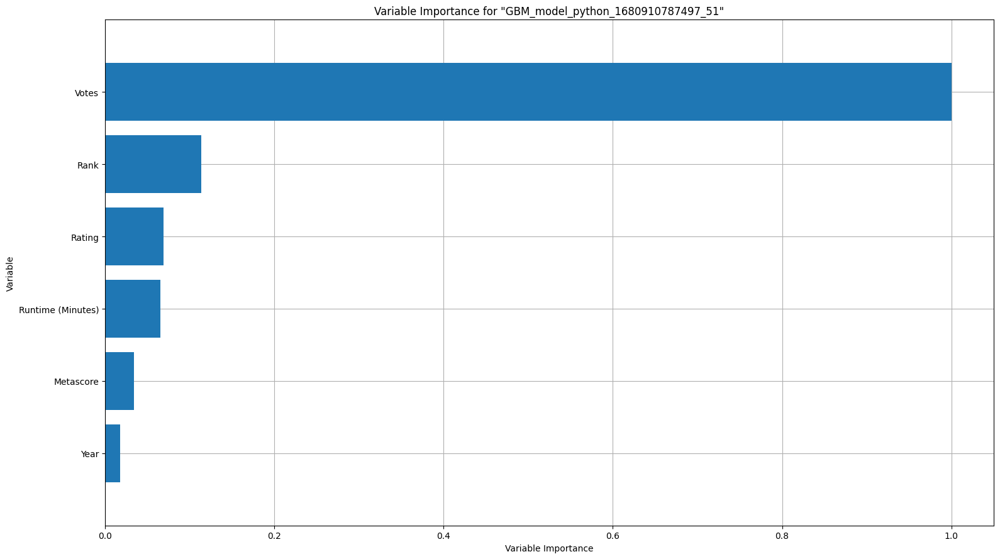

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

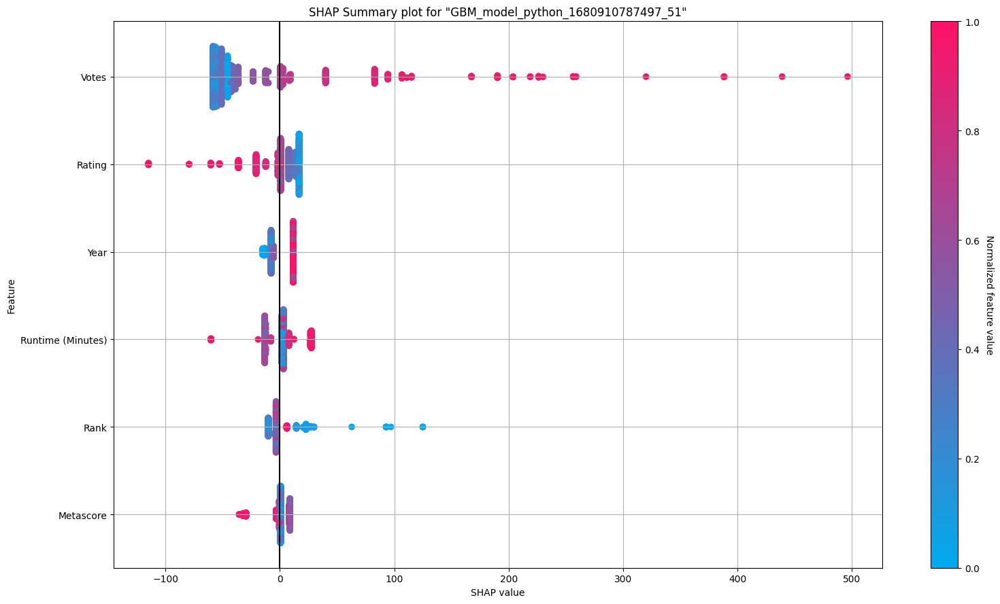

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

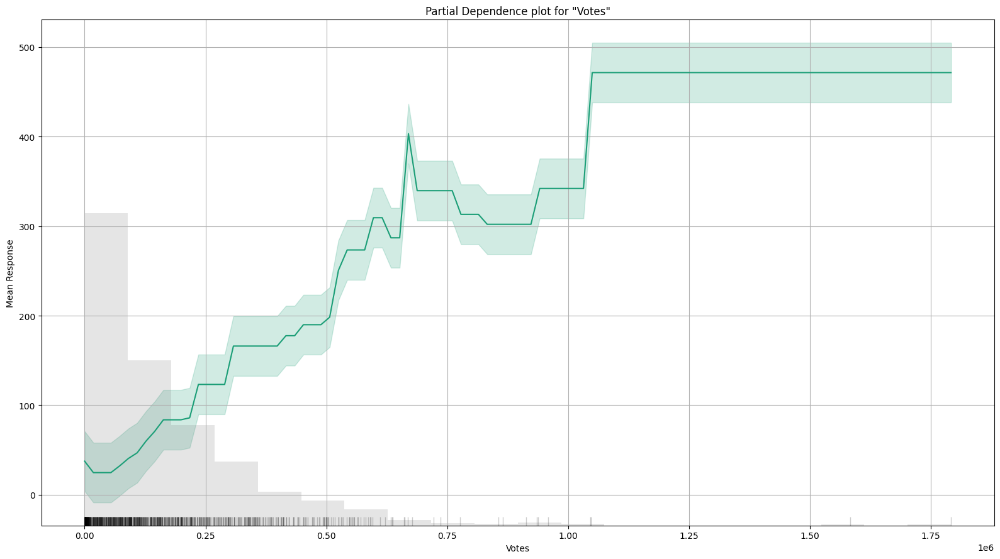

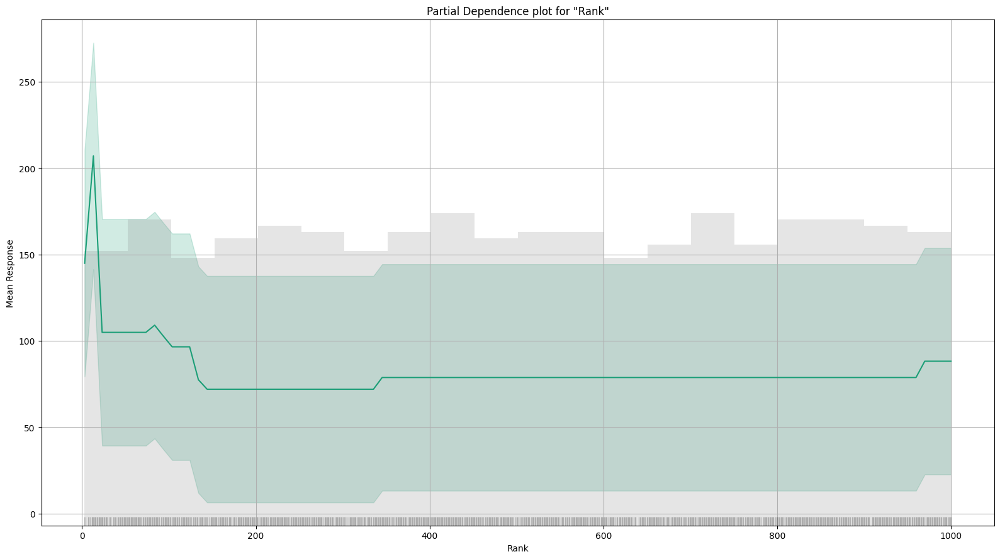

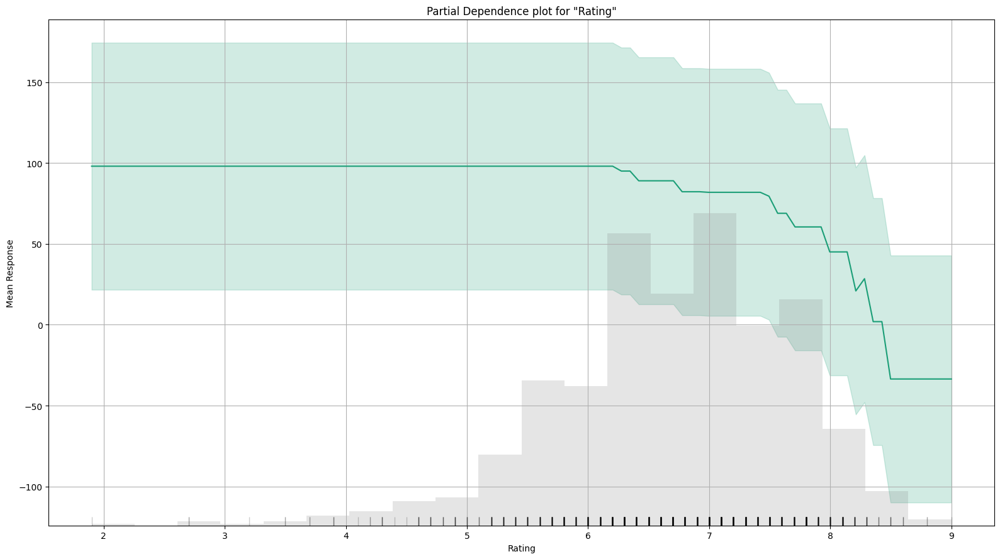

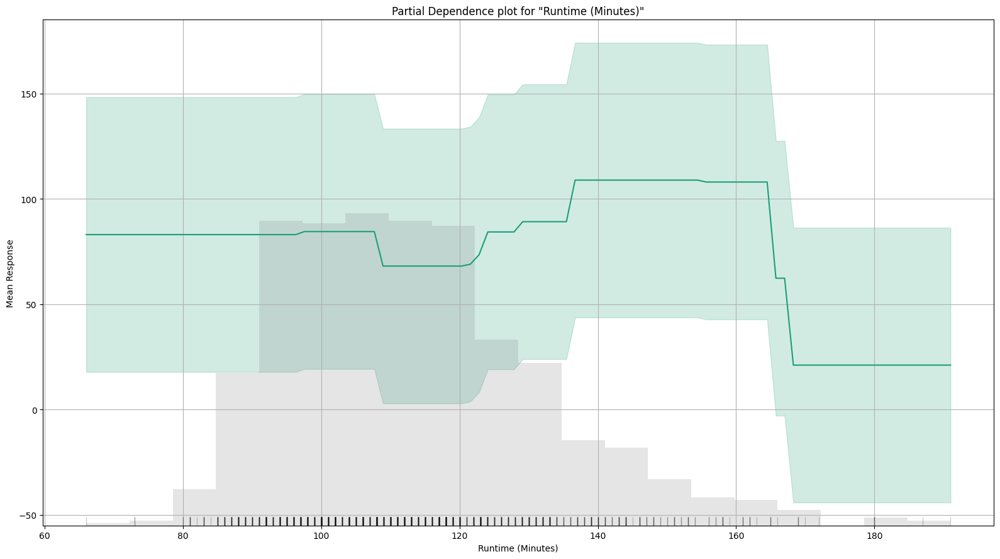

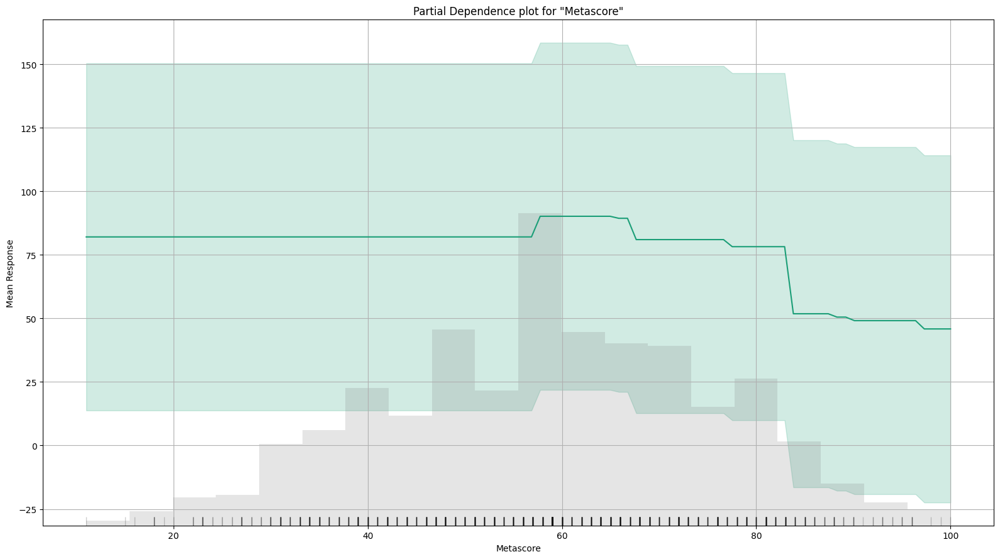

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

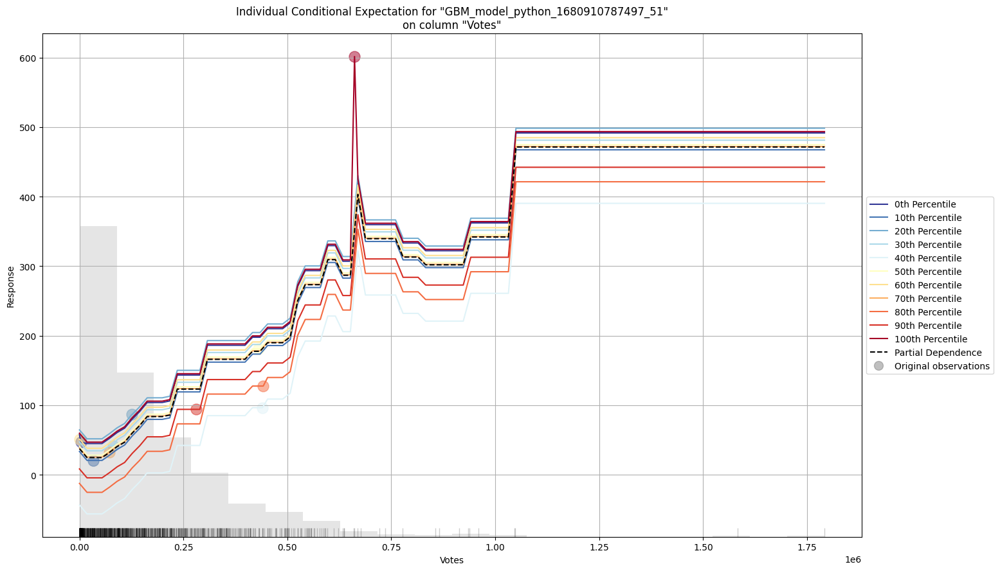

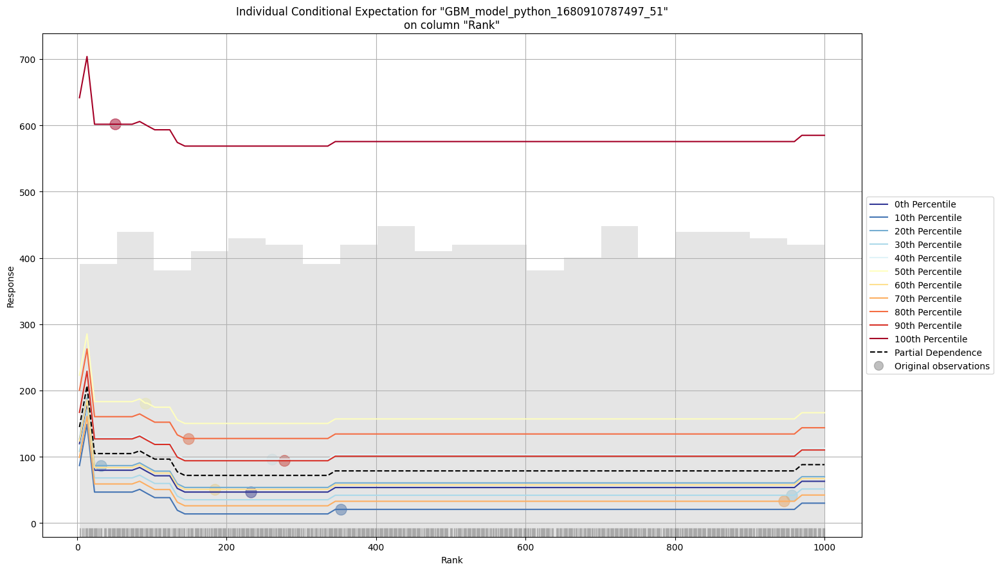

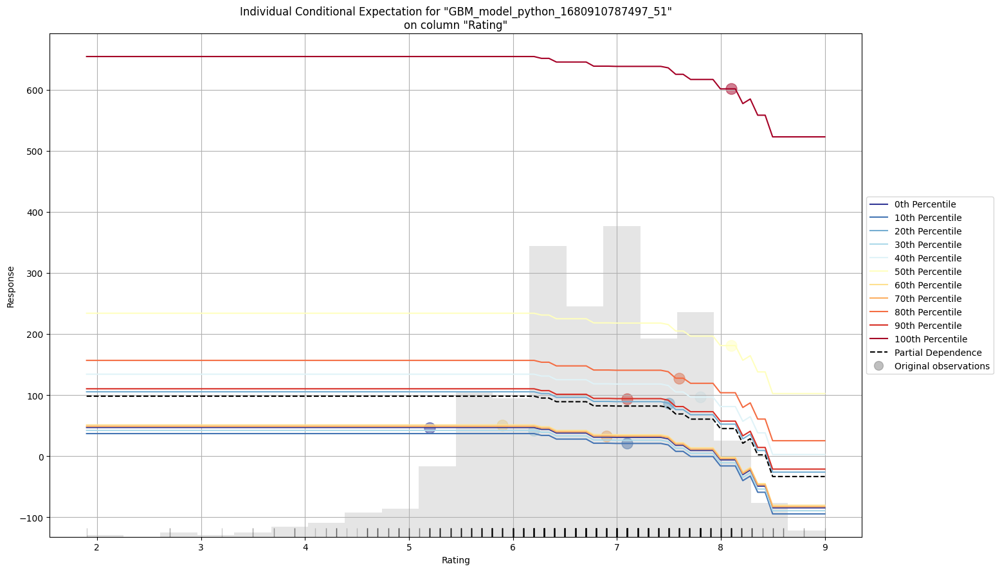

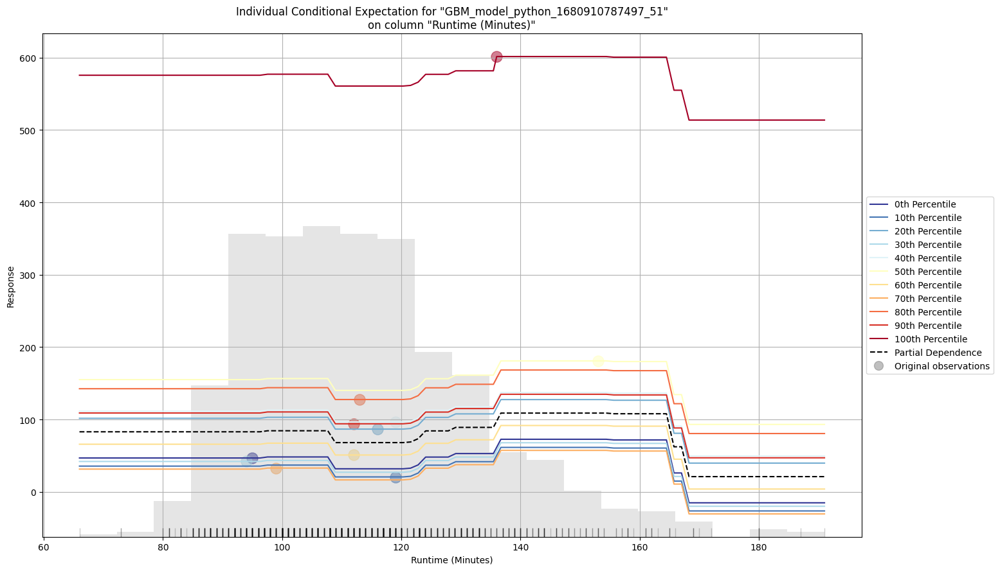

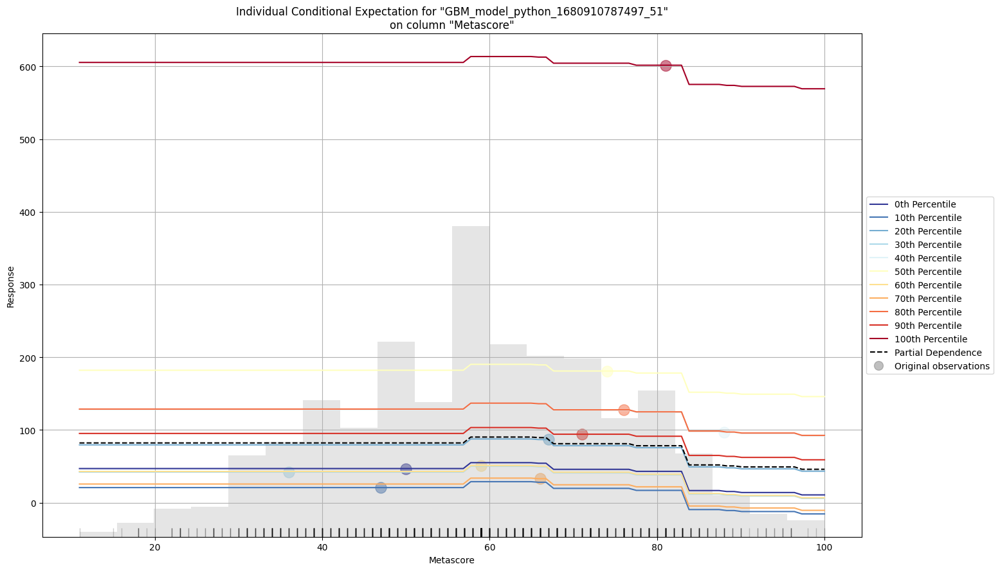

# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

In [153]:
model_gbm.explain(train[1:1000,:])


In [160]:
# Variable importances from each algorithm
# Calculate magnitude of normalized GLM coefficients
from six import iteritems
import operator
from tabulate import tabulate

glm_varimp = data_glm.coef_norm()
for k,v in iteritems(glm_varimp):
    glm_varimp[k] = abs(glm_varimp[k])
    
# Sort in descending order by magnitude
glm_sorted = sorted(glm_varimp.items(), key = operator.itemgetter(1), reverse = True)
table = tabulate(glm_sorted, headers = ["Predictor variable", " Coefficient"], tablefmt = "orgtbl")
print("Variable Importances:\n\n" + table)

Variable Importances:

| Predictor variable   |    Coefficient |
|----------------------+----------------|
| Intercept            |      82.7344   |
| Votes                |      62.3464   |
| Rating               |      14.2545   |
| Year                 |      10.6508   |
| Rank                 |       4.92939  |
| Runtime (Minutes)    |       3.97936  |
| Metascore            |       0.781719 |


In [162]:
data_glm.varimp()

[('Votes', 62.34639358520508, 1.0, 0.6431296872639994),
 ('Rating', 14.254505157470703, 0.22863399689654745, 0.1470413109219948),
 ('Year', 10.650810241699219, 0.1708328201396829, 0.10986765819086133),
 ('Rank', 4.929393291473389, 0.07906460996395377, 0.05084879787976768),
 ('Runtime (Minutes)',
  3.979357957839966,
  0.06382659411408642,
  0.04104877751171863),
 ('Metascore', 0.7817192673683167, 0.012538323749231587, 0.008063768231658087)]

In [163]:
model_gbm.varimp()

[('Votes', 18781710.0, 1.0, 0.7689810558108737),
 ('Rank', 2135935.0, 0.11372420296128521, 0.08745175766441919),
 ('Rating', 1296599.25, 0.0690352076568108, 0.05308676687205729),
 ('Runtime (Minutes)', 1232695.25, 0.0656327485622981, 0.050470340285205605),
 ('Metascore', 647418.4375, 0.03447068650831048, 0.026507304905686233),
 ('Year', 329793.8125, 0.017559307033278654, 0.013502774461757919)]

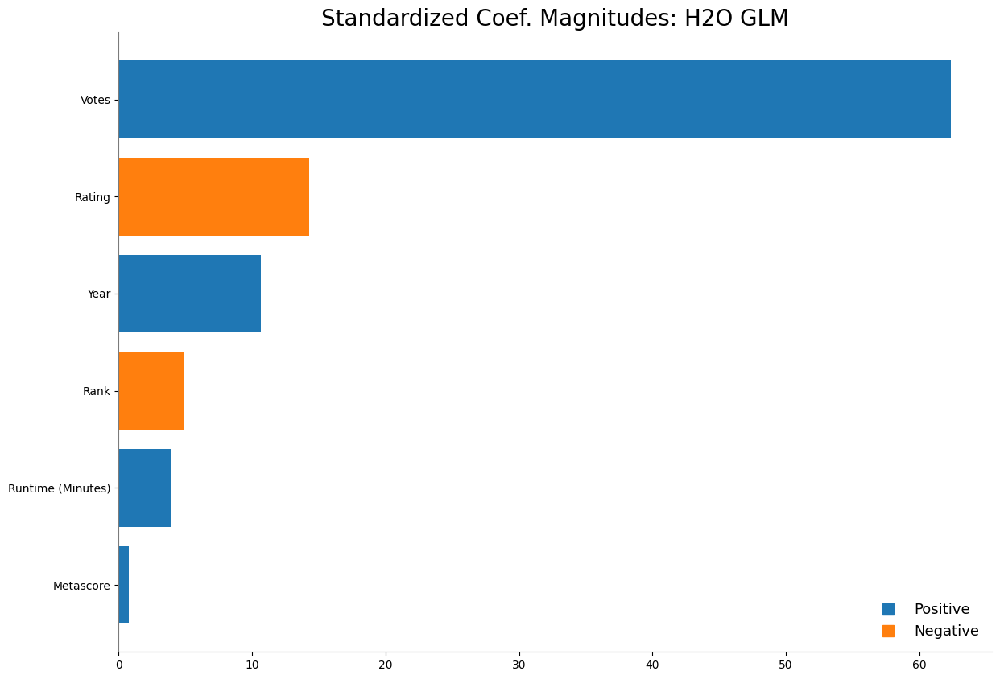

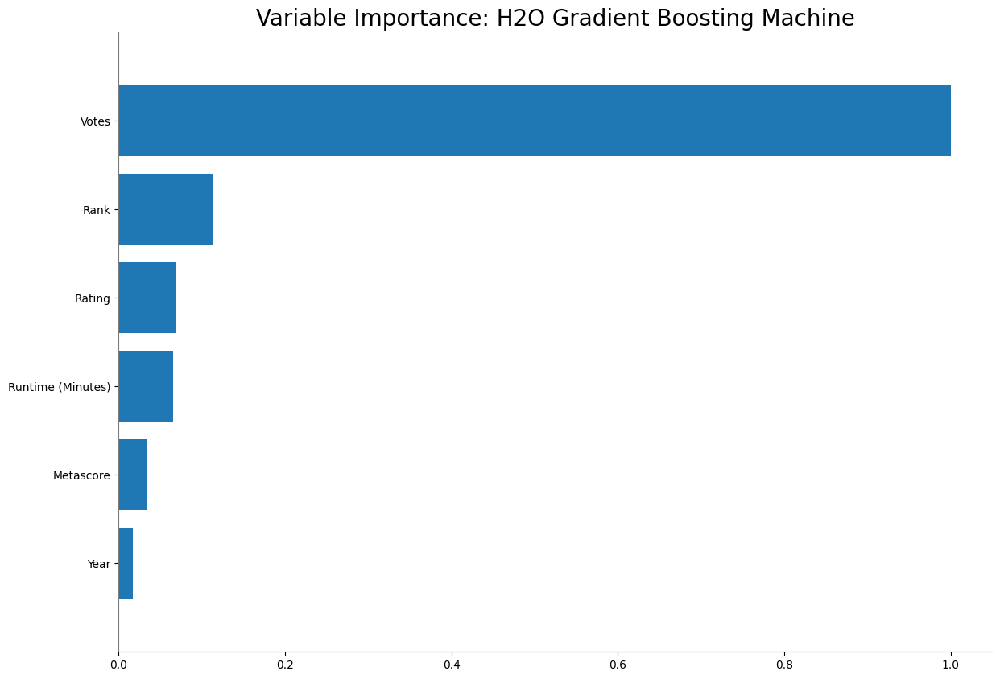

<Figure size 3200x2400 with 0 Axes>

In [164]:
data_glm.std_coef_plot()
model_gbm.varimp_plot()

#**Performances of the models:**

In [165]:
# Model performance of GBM model on test data
model_gbm.model_performance(test)  

ModelMetricsRegression: gbm
** Reported on test data. **

MSE: 3075.924835823427
RMSE: 55.461020868925836
MAE: 42.737862258911655
RMSLE: 1.4244910630726435
Mean Residual Deviance: 3075.924835823427

In [166]:
# Model performance of GBM model on test data
data_glm.model_performance(test)  
     

ModelMetricsRegressionGLM: glm
** Reported on test data. **

MSE: 3958.382149919727
RMSE: 62.9156749142829
MAE: 47.7828326088195
RMSLE: 1.4203359310856374
Mean Residual Deviance: 3958.382149919727
R^2: 0.5709586656689258
Null degrees of freedom: 84
Residual degrees of freedom: 78
Null deviance: 784799.2028000136
Residual deviance: 336462.4827431768
AIC: 961.3247578302432

#**AutoML Algorithm**

In [167]:
def get_independent_variables(df, targ):
    C = [name for name in df.columns if name != targ and name !='Revenue (Millions)']
    # determine column types
    ints, reals, enums = [], [], []
    for key, val in df.types.items():
        if key in C:

            if val == 'enum':
                enums.append(key)
            elif val == 'int':
                ints.append(key)            
            else: 
                reals.append(key)    
    x=ints+enums+reals
    return x

In [168]:
X=get_independent_variables(train, myY) 
print(X)
print(myY)

['Rank', 'Year', 'Votes', 'Runtime (Minutes)', 'Rating', 'Metascore']
Revenue (Millions)


In [170]:
model_start_time = time.time()
  
autoML_model.train(x=X,y=myY,training_frame=train) 
  

gbm Model Build progress: |██████████████████████████████████████████████████████| (done) 100%


Model Details
=============
H2OGradientBoostingEstimator : Gradient Boosting Machine
Model Key: GBM_model_python_1680910787497_54


Model Summary: 
    number_of_trees    number_of_internal_trees    model_size_in_bytes    min_depth    max_depth    mean_depth    min_leaves    max_leaves    mean_leaves
--  -----------------  --------------------------  ---------------------  -----------  -----------  ------------  ------------  ------------  -------------
    50                 50                          11750                  5            5            5             7             25            14.06

ModelMetricsRegression: gbm
** Reported on train data. **

MSE: 2388.032054593649
RMSE: 48.867494867177804
MAE: 34.70258884645306
RMSLE: NaN
Mean Residual Deviance: 2388.032054593649

Scoring History: 
     timestamp            duration    number_of_trees    training_rmse       training_mae        training_deviance
---  -------------------  ----------  -----------------  ------------------  ------------------  -------------------
     2023-04-08 00:40:08  0.003 sec   0.0                96.38967375843255   62.67096090418536   9290.969207257061
     2023-04-08 00:40:08  0.017 sec   1.0                91.2134490465205    59.456853740532054  8319.893286962191
     2023-04-08 00:40:08  0.022 sec   2.0                86.75456072102816   56.73827891643337   7526.3538058985605
     2023-04-08 00:40:08  0.025 sec   3.0                82.74346289017805   54.265016042017706  6846.480651058273
     2023-04-08 00:40:08  0.031 sec   4.0                79.48251534356699   52.280240553002706  6317.4702453403615
     2023-04-08 00:40:08  0.036 sec   5.0                76.68303391722232   50.744862158380734  5880.2876907498685
     2023-04-08 00:40:08  0.051 sec   6.0                74.06120834114067   49.21759330151918   5485.062580949844
     2023-04-08 00:40:08  0.054 sec   7.0                71.85864935363364   47.897029114881015  5163.665486928472
     2023-04-08 00:40:08  0.060 sec   8.0                69.84115586277814   46.62384786247963   4877.787052248869
     2023-04-08 00:40:08  0.064 sec   9.0                68.16013854844843   45.818457578509395  4645.804486943685
---  ---                  ---         ---                ---                 ---                 ---
     2023-04-08 00:40:08  0.238 sec   41.0               51.152186050826714  36.11978006982168   2616.5461377783913
     2023-04-08 00:40:08  0.249 sec   42.0               50.94222388318519   36.00329855563618   2595.110174164564
     2023-04-08 00:40:08  0.256 sec   43.0               50.56667233534214   35.77600054461204   2556.988351069856
     2023-04-08 00:40:08  0.259 sec   44.0               50.35977851359558   35.68597928646321   2536.107291938403
     2023-04-08 00:40:08  0.280 sec   45.0               49.96424363721836   35.439552367649604  2496.4256422393155
     2023-04-08 00:40:08  0.284 sec   46.0               49.64390339822862   35.22652873019459   2464.517144612655
     2023-04-08 00:40:08  0.288 sec   47.0               49.37878156354003   35.08641494851702   2438.2640686998006
     2023-04-08 00:40:08  0.295 sec   48.0               49.18351600944586   34.89749886735948   2419.018247051417
     2023-04-08 00:40:08  0.299 sec   49.0               48.98158618412422   34.76741031496658   2399.1957851127886
     2023-04-08 00:40:08  0.303 sec   50.0               48.867494867177804  34.70258884645306   2388.032054593649
[51 rows x 7 columns]


Variable Importances: 
variable           relative_importance    scaled_importance    percentage
-----------------  ---------------------  -------------------  ------------
Votes              1.90049e+07            1                    0.571694
Rank               4.77796e+06            0.251407             0.143728
Rating             3.60886e+06            0.189891             0.10856
Runtime (Minutes)  2.7318e+06             0.143742             0.0821765
Year               1.82029e+06            0.09578              0.0

In [171]:
execution_time = time.time() - model_start_time
print(execution_time)

14.493281602859497


In [179]:
autoML_model.algo

'gbm'

#**LEADERBOARD:**

In machine learning competitions and data science projects, a leaderboard is a table that displays the performance of different models on a particular task or dataset. The leaderboard typically ranks the models based on a metric or evaluation criterion, such as accuracy, F1 score, or mean squared error.

The purpose of a leaderboard is to compare the performance of different models and to identify the best-performing models for the task at hand. The leaderboard can be used to track the progress of different teams or participants in a competition, or to compare the performance of different algorithms and techniques in a data science project.

In a machine learning competition, the leaderboard is often publicly visible and is updated periodically as new models are submitted and evaluated. Participants can use the leaderboard to guide their development and tuning of their models, with the goal of improving their ranking on the leaderboard.

In a data science project, the leaderboard can be used to track the performance of different models during development and to select the best-performing model for deployment. The leaderboard can also be used to communicate the performance of the models to stakeholders and decision-makers.

Overall, a leaderboard provides a clear and objective way to compare the performance of different models and to identify the best-performing models for a particular task or dataset.

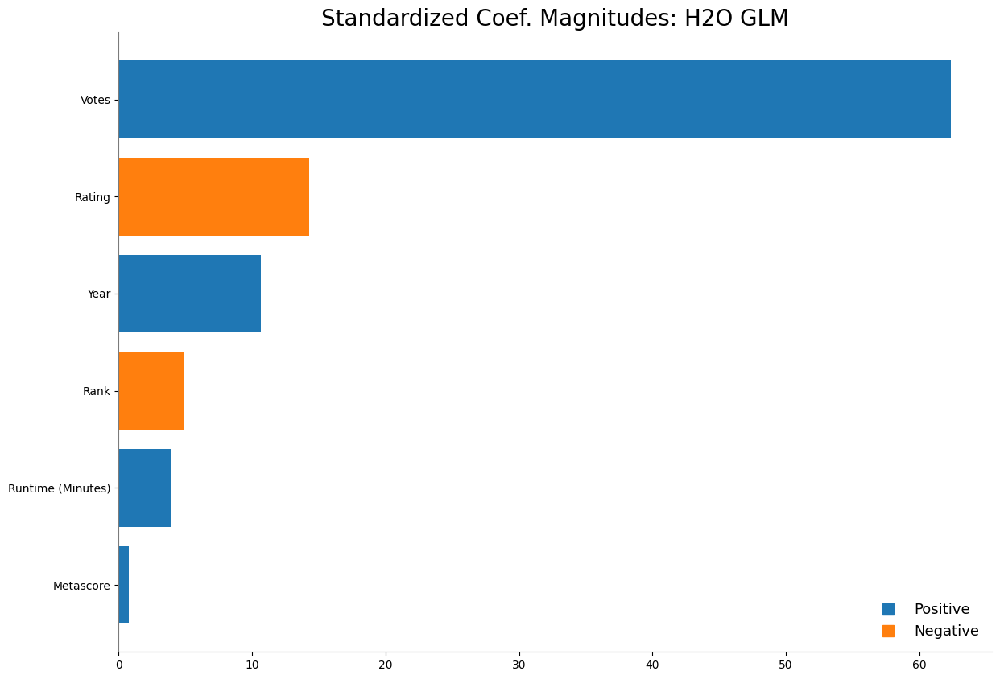

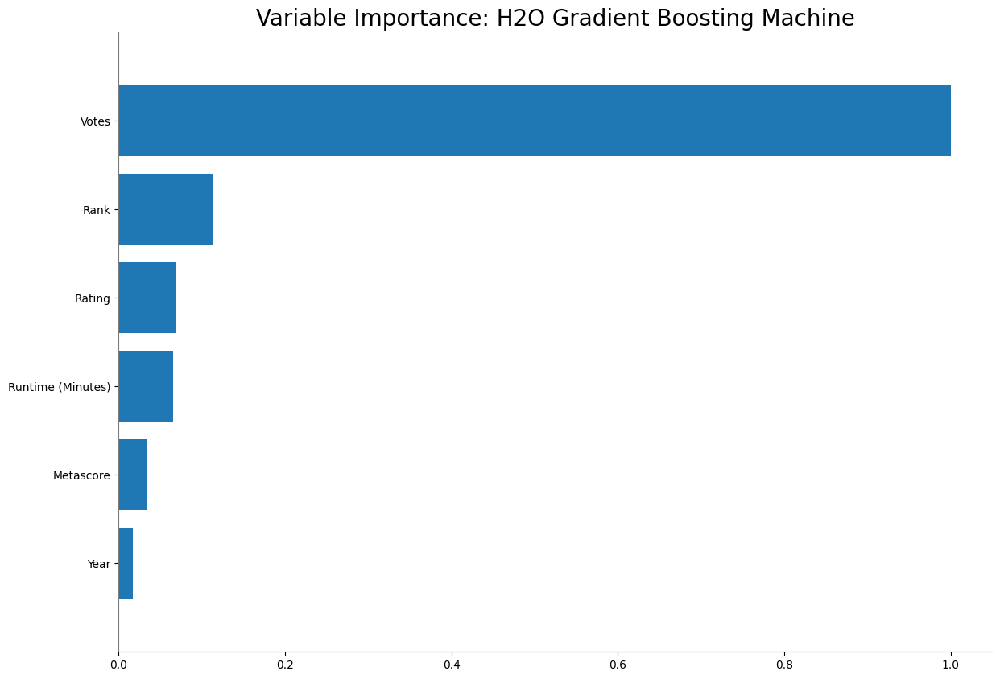

<Figure size 3200x2400 with 0 Axes>

In [174]:
data_glm.std_coef_plot()
model_gbm.varimp_plot()

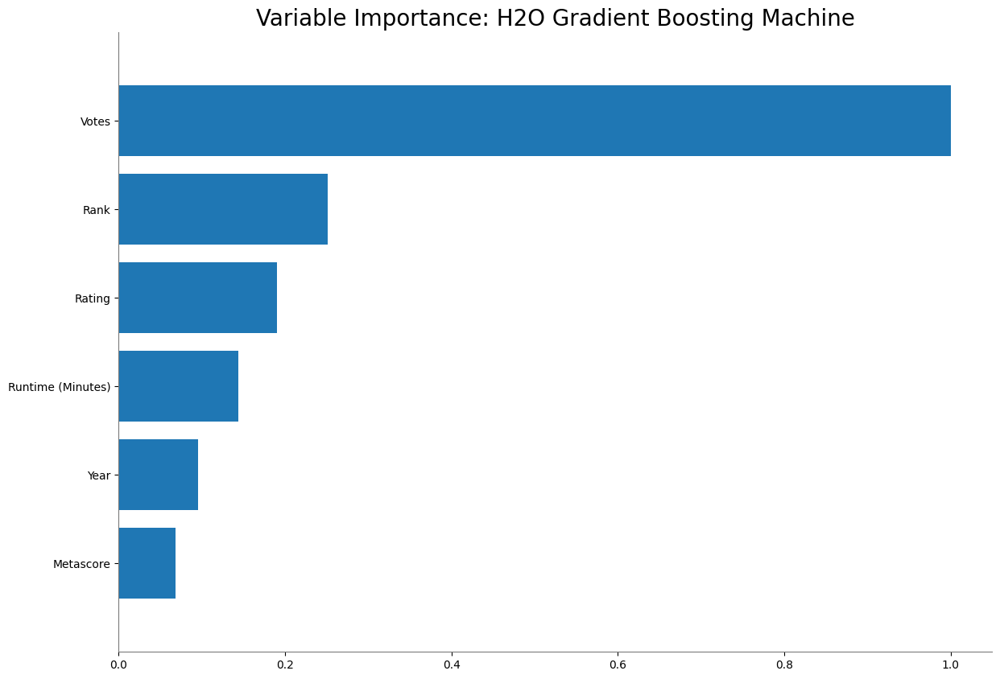

<Figure size 3200x2400 with 0 Axes>

In [182]:
if autoML_model.algo in ['xgboost','drf','gbm']:
  autoML_model.varimp_plot()
else:
  print(autoML_model.params)

#**Hyper-parameters**

In [184]:
train, validate, test = np.split(
    dff.sample(frac=1, random_state=42), [int(0.6 * len(dff)), int(0.8 * len(dff))]
)

train = h2o.H2OFrame(train)
validate = h2o.H2OFrame(validate)
test = h2o.H2OFrame(test)

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


In [185]:
gbm_parameters = {
    "learn_rate": [i * 0.01 for i in range(1, 11)],
    "max_depth": list(range(2, 11)),
    "sample_rate": [i * 0.1 for i in range(5, 11)],
    "col_sample_rate": [i * 0.1 for i in range(1, 11)],
}

In [186]:
search_criteria = {"strategy": "RandomDiscrete", "max_models": 36, "seed": 1}


In [187]:
gbm_grid2 = H2OGridSearch(
    model=H2OGradientBoostingEstimator,
    grid_id="gbm_grid2",
    hyper_params=gbm_parameters,
    search_criteria=search_criteria,
)

In [205]:
hyper_params = {'max_depth': [5, 10, 15],
                'sample_rate': [0.8, 1.0],
                'col_sample_rate': [0.8, 1.0]}

In [206]:
from h2o.grid.grid_search import H2OGridSearch

grid = H2OGridSearch(model=H2OGradientBoostingEstimator(seed=1234),
                     hyper_params=hyper_params,
                     search_criteria={'strategy': 'Cartesian'})

In [209]:
grid.train(x=train.columns[:-1], y=train.columns[-1], training_frame=train, validation_frame=test)


gbm Grid Build progress: |███████████████████████████████████████████████████████| (done) 100%


,col_sample_rate,max_depth,sample_rate,model_ids,residual_deviance
,1.0,5.0,1.0,Grid_GBM_Key_Frame__upload_b8b19fb560b834676b591c20e45e4953.hex_model_python_1680910787497_55_model_8,203.4211181
,1.0,5.0,0.8,Grid_GBM_Key_Frame__upload_b8b19fb560b834676b591c20e45e4953.hex_model_python_1680910787497_55_model_2,205.3605652
,0.8,5.0,0.8,Grid_GBM_Key_Frame__upload_b8b19fb560b834676b591c20e45e4953.hex_model_python_1680910787497_55_model_1,210.4471826
,0.8,5.0,1.0,Grid_GBM_Key_Frame__upload_b8b19fb560b834676b591c20e45e4953.hex_model_python_1680910787497_55_model_7,210.7562381
,1.0,10.0,1.0,Grid_GBM_Key_Frame__upload_b8b19fb560b834676b591c20e45e4953.hex_model_python_1680910787497_55_model_10,227.4245453
,0.8,10.0,1.0,Grid_GBM_Key_Frame__upload_b8b19fb560b834676b591c20e45e4953.hex_model_python_1680910787497_55_model_9,228.3887225
,0.8,15.0,1.0,Grid_GBM_Key_Frame__upload_b8b19fb560b834676b591c20e45e4953.hex_model_python_1680910787497_55_model_11,229.1428263
,0.8,15.0,0.8,Grid_GBM_Key_Frame__upload_b8b19fb560b834676b591c20e45e4953.hex_model_python_1680910787497_55_model_5,230.3374503
,0.8,10.0,0.8,Grid_GBM_Key_Frame__upload_b8b19fb560b834676b591c20e45e4953.hex_model_python_1680910787497_55_model_3,230.9352837
,1.0,15.0,1.0,Grid_GBM_Key_Frame__upload_b8b19fb560b834676b591c20e45e4953.hex_model_python_1680910787497_55_model_12,233.7041414


In [212]:
list_hyperparameters = []
for i in range(10):
    hyperparameters = grid.get_hyperparams_dict(i)
    list_hyperparameters.append(hyperparameters)

Hyperparameters: [max_depth, sample_rate, col_sample_rate]
Hyperparameters: [max_depth, sample_rate, col_sample_rate]
Hyperparameters: [max_depth, sample_rate, col_sample_rate]
Hyperparameters: [max_depth, sample_rate, col_sample_rate]
Hyperparameters: [max_depth, sample_rate, col_sample_rate]
Hyperparameters: [max_depth, sample_rate, col_sample_rate]
Hyperparameters: [max_depth, sample_rate, col_sample_rate]
Hyperparameters: [max_depth, sample_rate, col_sample_rate]
Hyperparameters: [max_depth, sample_rate, col_sample_rate]
Hyperparameters: [max_depth, sample_rate, col_sample_rate]


**Explanation of each of the hyperparameters mentioned:**

learn_rate: This hyperparameter controls the step size taken during the optimization process in gradient-based algorithms such as Gradient Boosting Machines (GBM) or XGBoost. A smaller learning rate can lead to slower convergence but can result in a more accurate model.

max_depth: This hyperparameter controls the maximum depth of a tree in decision tree-based algorithms such as Random Forest or XGBoost. A larger value of max_depth can result in a more complex model that can capture more intricate relationships in the data, but can also increase the risk of overfitting.

sample_rate: This hyperparameter controls the fraction of rows (observations) to be randomly sampled at each iteration during the training process in gradient-based algorithms such as GBM or XGBoost. A smaller value of sample_rate

col_sample_rate: is a hyperparameter used in machine learning algorithms for feature selection and regularization. It refers to the fraction of columns (features) that are randomly selected for each tree or iteration during the construction of a random forest or gradient boosting model.

In [214]:
models = grid.models
list_residual_deviance = []
for i in range(10):
    model = models[i]
    performance_metrics = model.model_performance(validate)
    residual_deviance = performance_metrics.mean_residual_deviance()
    list_residual_deviance.append(residual_deviance)

In [215]:
for i in range(10):
    list_hyperparameters[i]["Residual_Deviance"] = list_residual_deviance[i]
hyperparameters_dataframe = pd.DataFrame(list_hyperparameters)
print(hyperparameters_dataframe)

   col_sample_rate  max_depth  sample_rate  Residual_Deviance
0              1.0          5          1.0         305.759909
1              1.0          5          0.8         295.617503
2              0.8          5          0.8         312.813195
3              0.8          5          1.0         302.995641
4              1.0         10          1.0         332.504770
5              0.8         10          1.0         326.411039
6              0.8         15          1.0         322.368696
7              0.8         15          0.8         335.500295
8              0.8         10          0.8         324.628799
9              1.0         15          1.0         341.977372


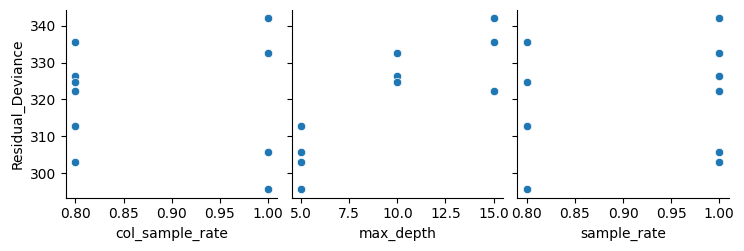

In [217]:
sns.pairplot(
    hyperparameters_dataframe,
    y_vars=["Residual_Deviance"],
    x_vars=["col_sample_rate", "max_depth", "sample_rate"],
)

# **SHAP, Partial Dependence Plot, Individual Conditional Expectation Analysis for AutoML Best Model**

In [152]:
shap.initjs()

# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

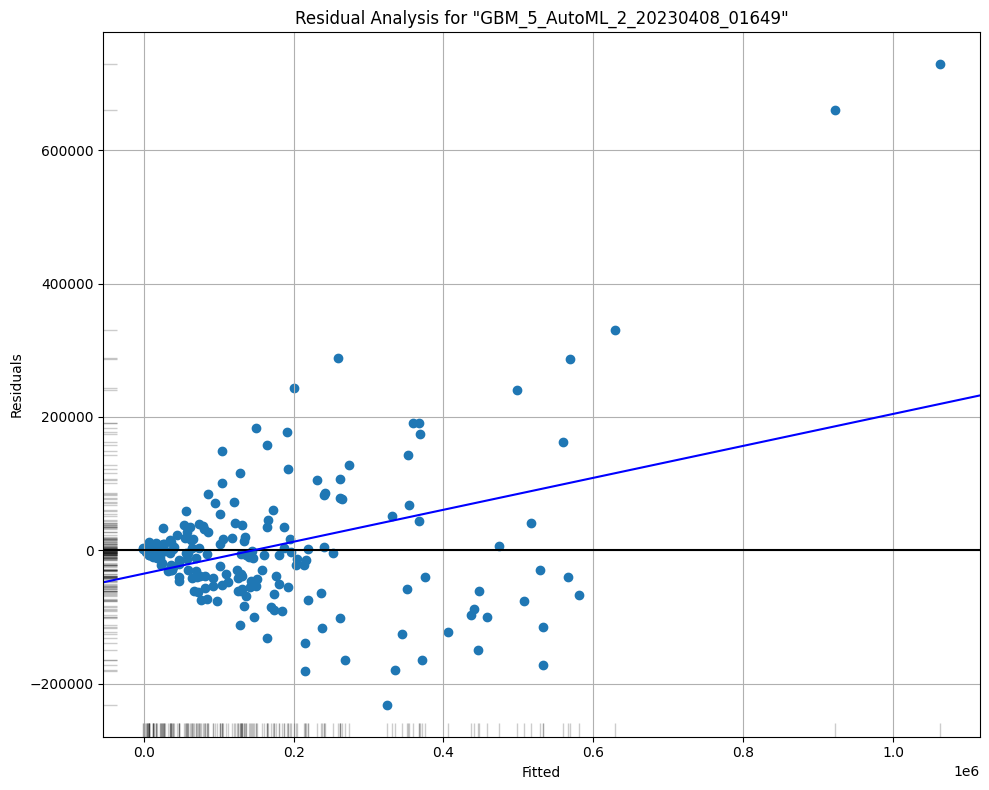

# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

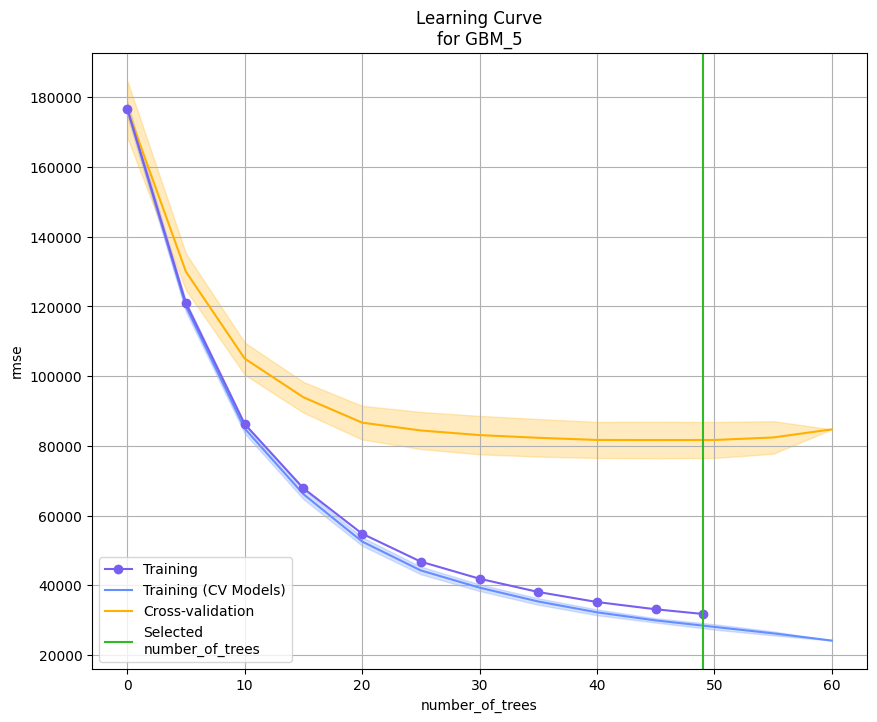

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

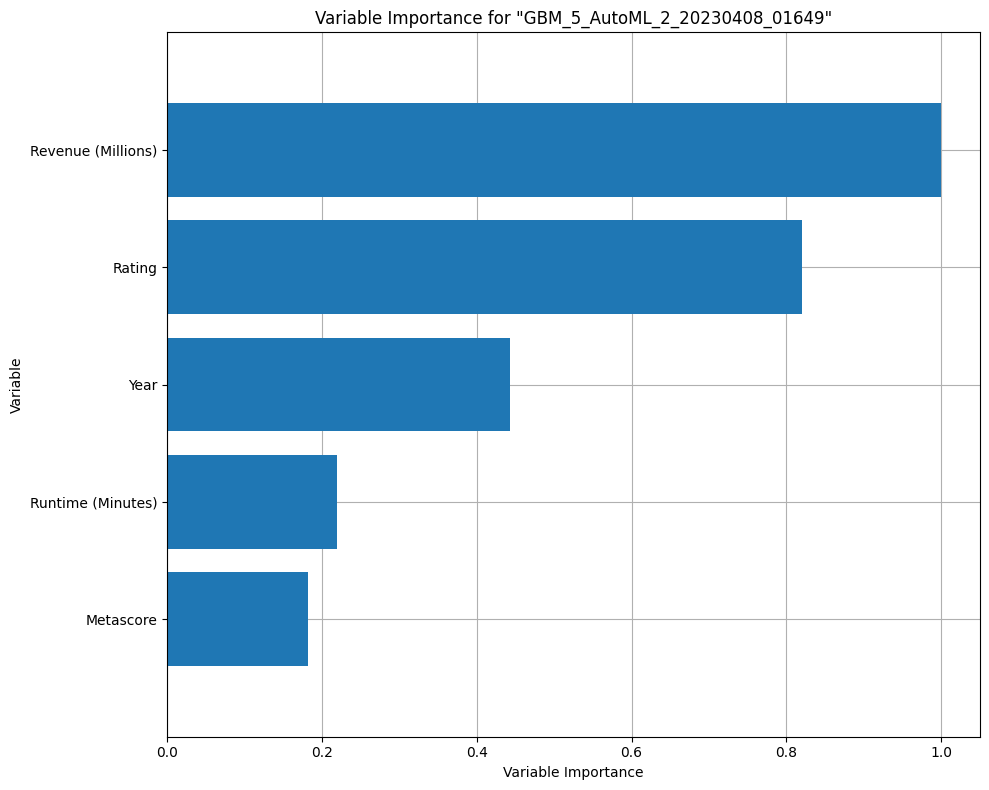

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

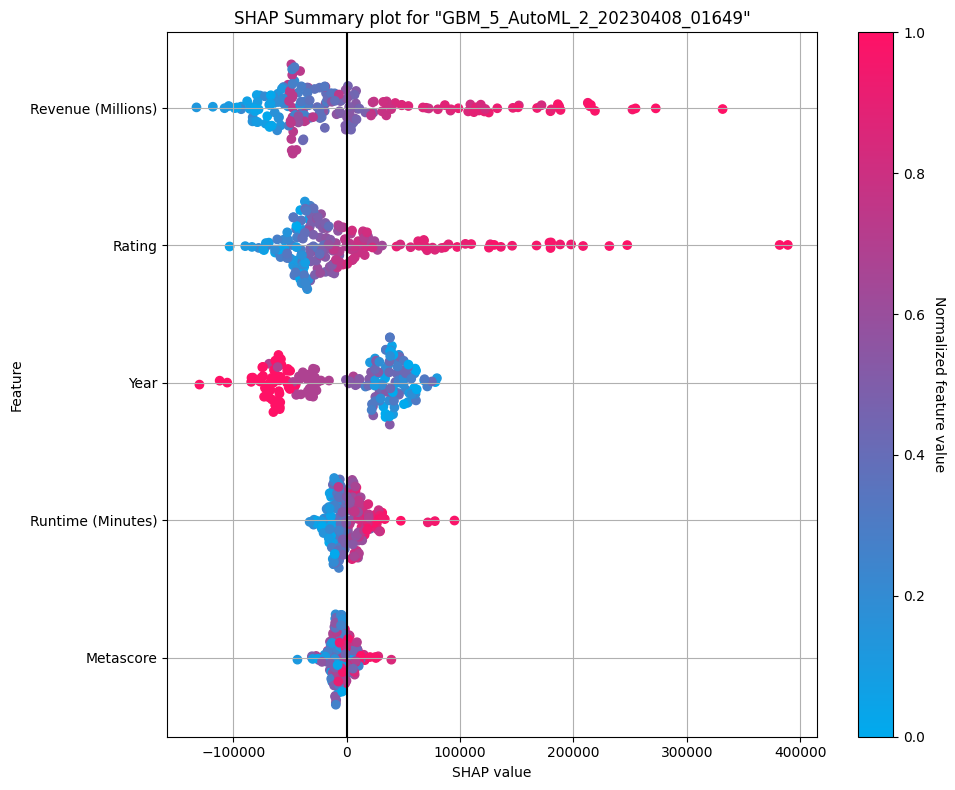

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

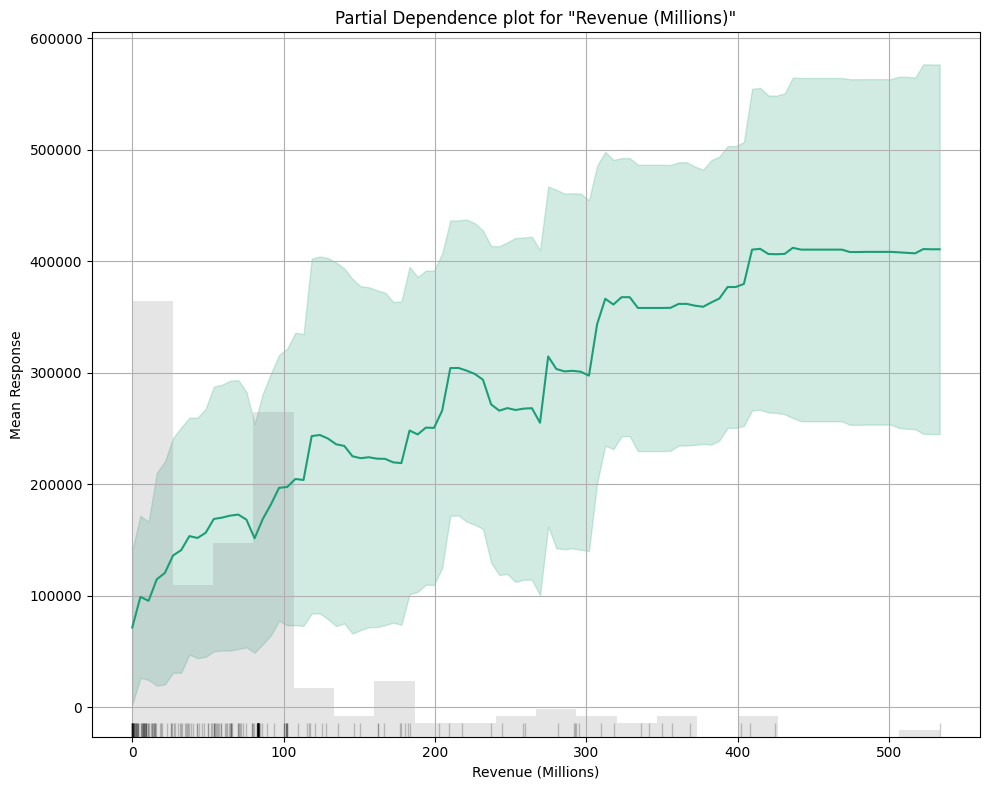

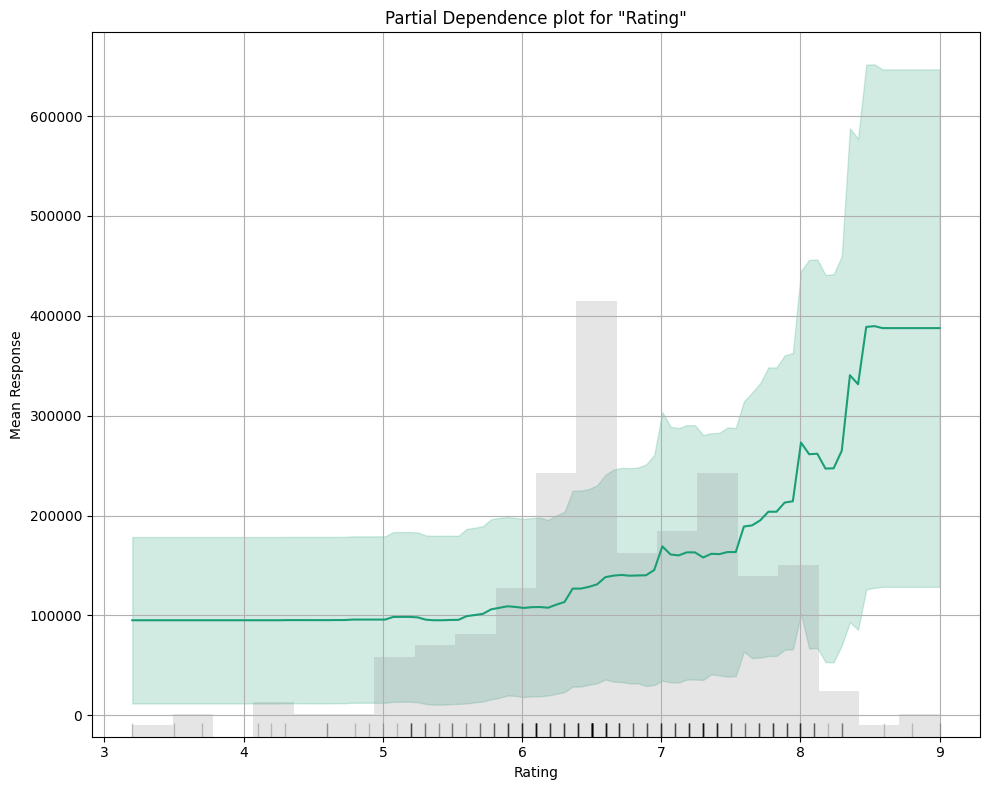

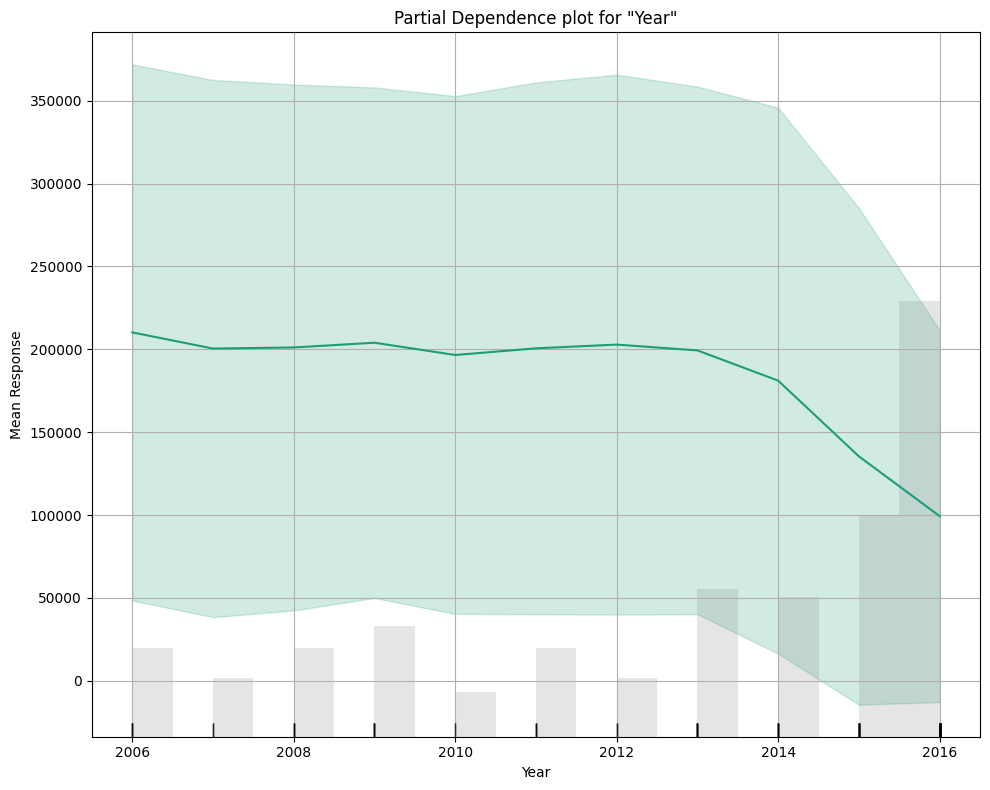

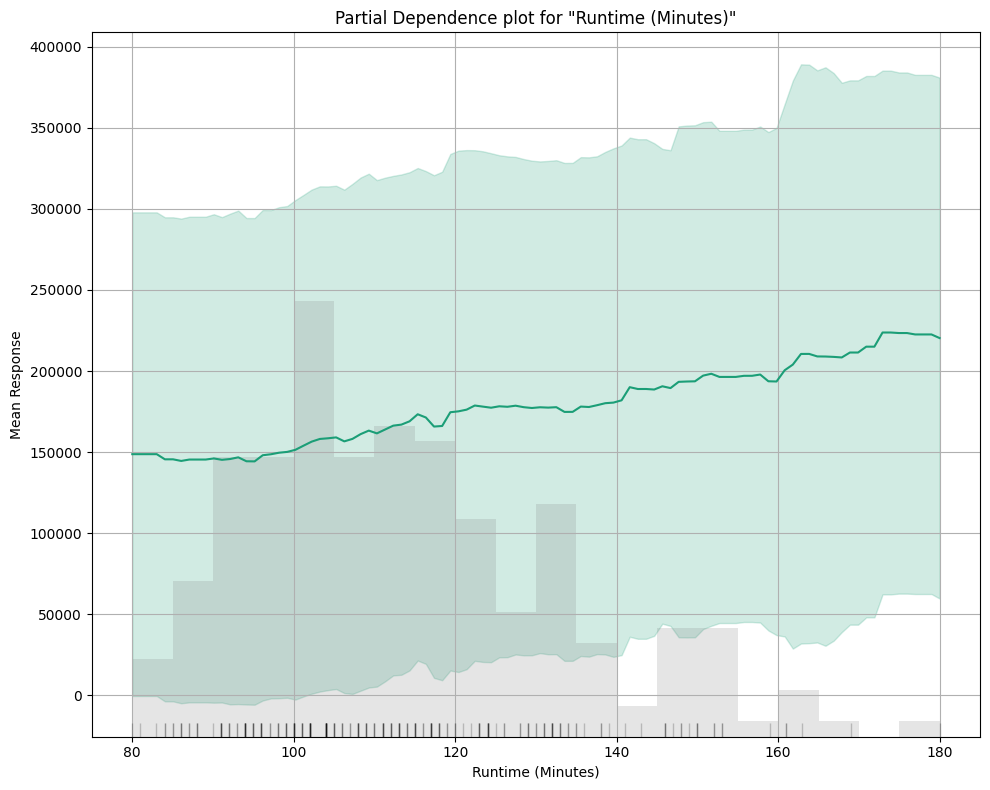

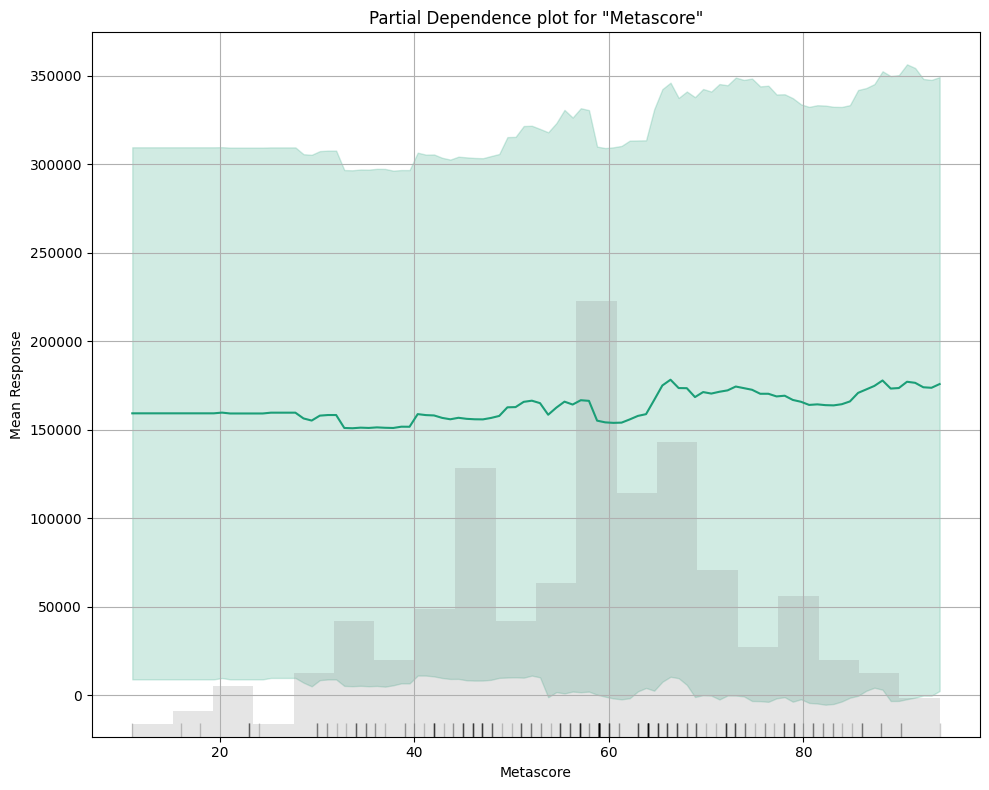

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

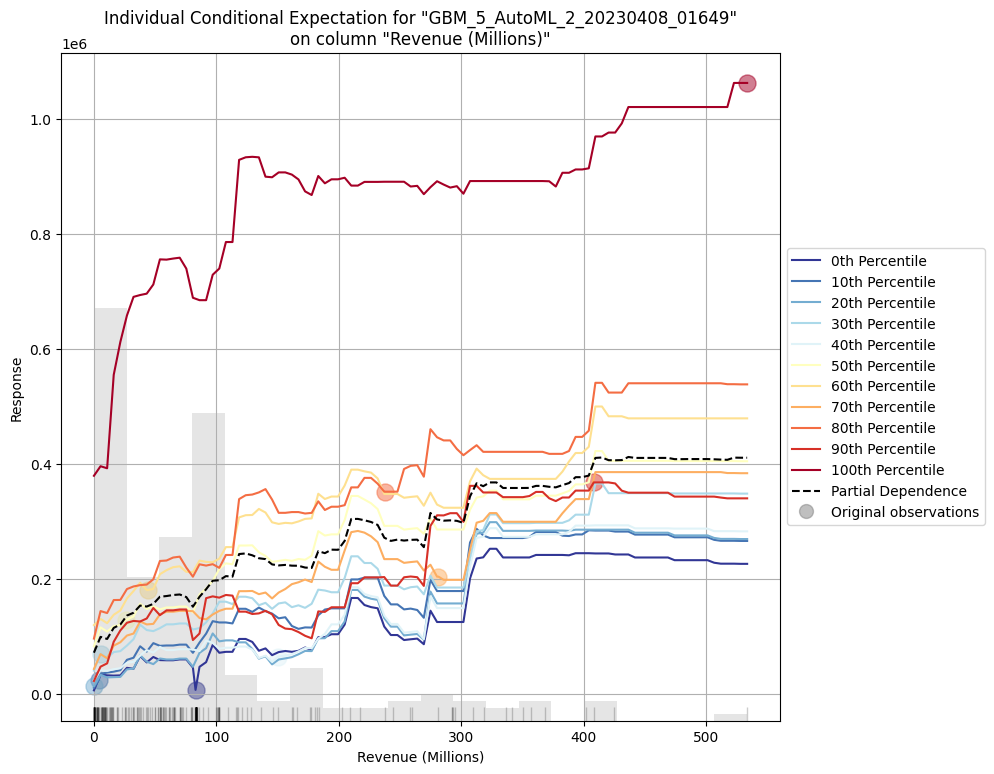

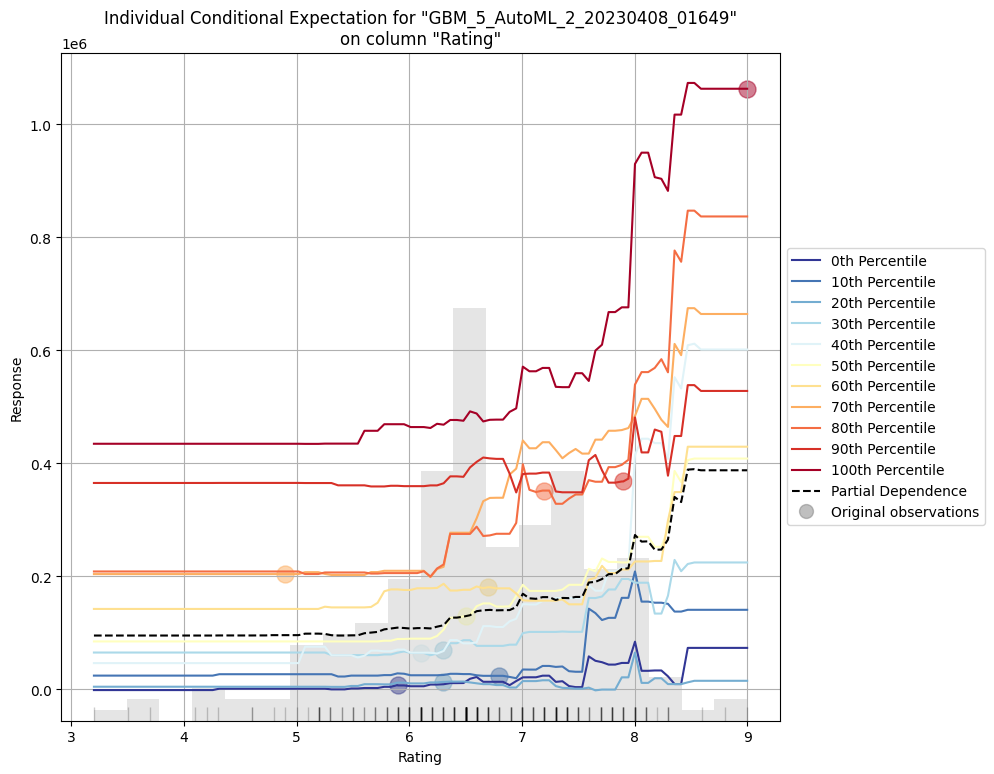

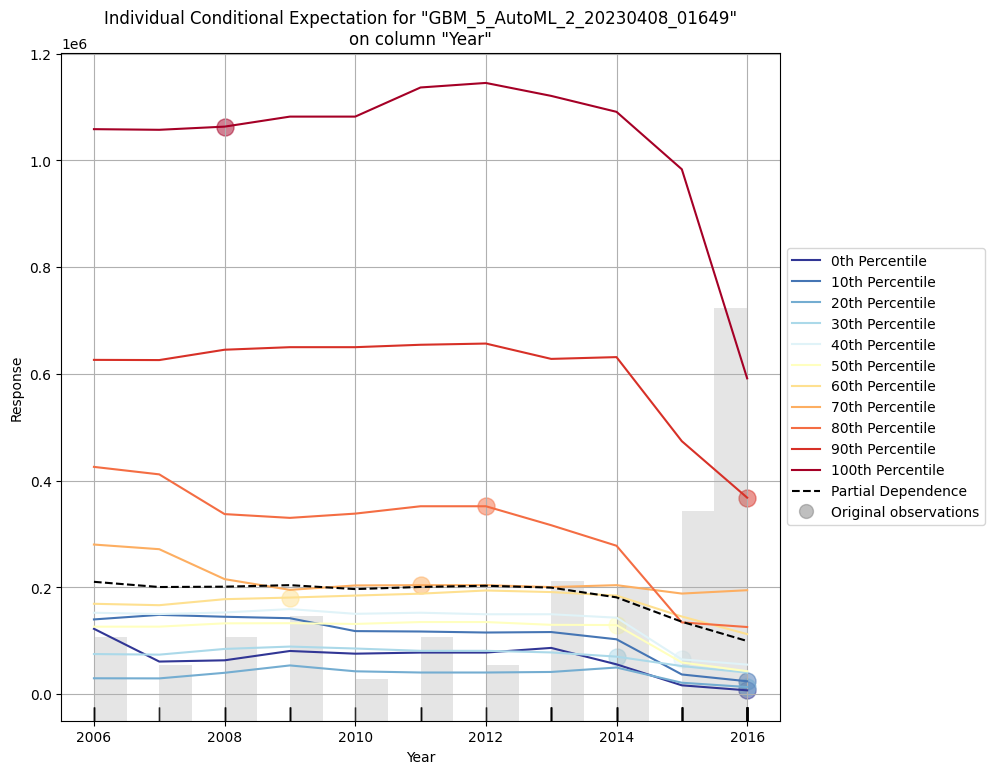

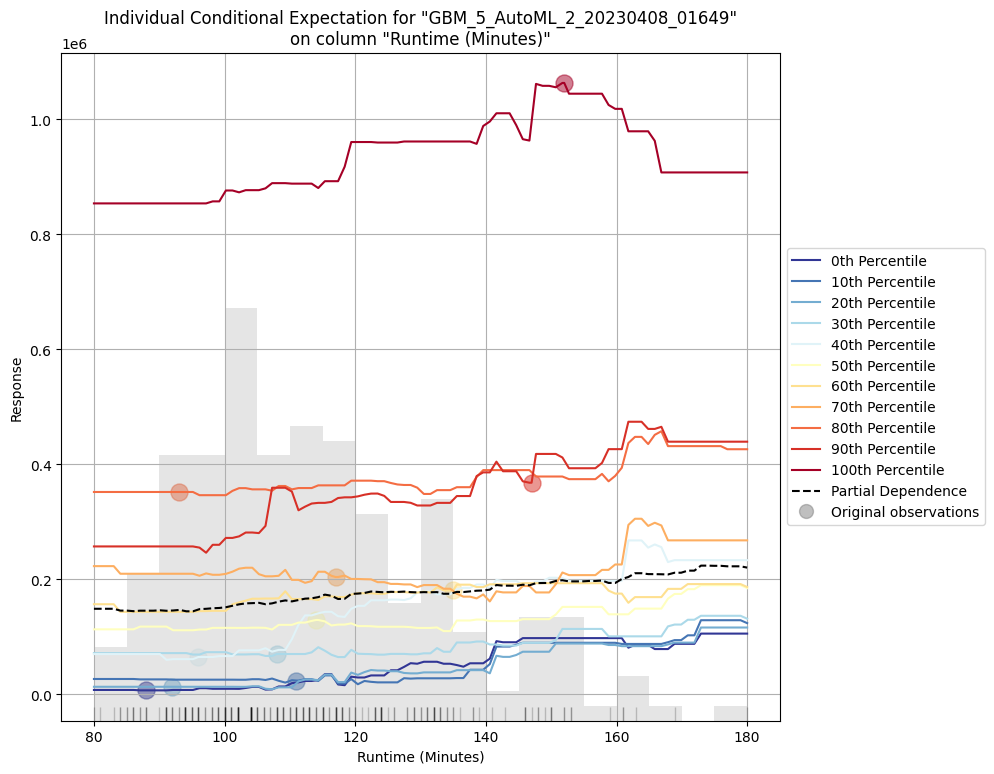

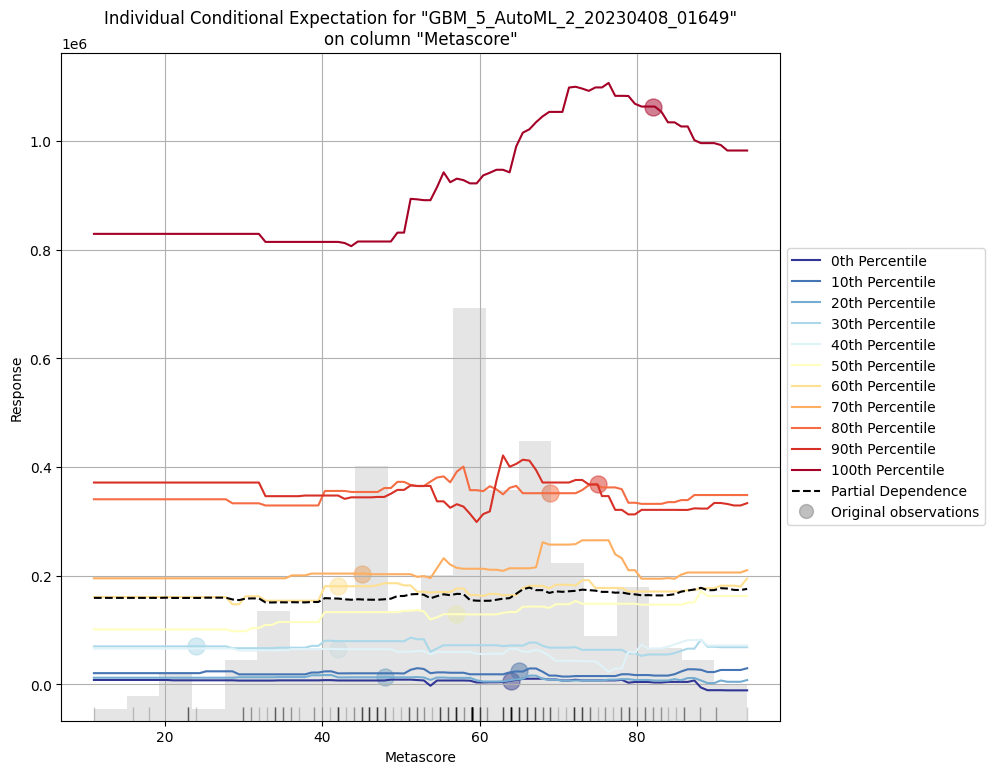

In [151]:
try:
    explain_model = autoML_model.explain(frame = hdf_test, figsize = (10,8))
except IndexError:
    print("Index out of range")

# SHAP Explanation

> SHAP explanation shows contribution of features for a given instance. The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function. H2O implements TreeSHAP which when the features are correlated, can increase contribution of a feature that had no influence on the prediction.

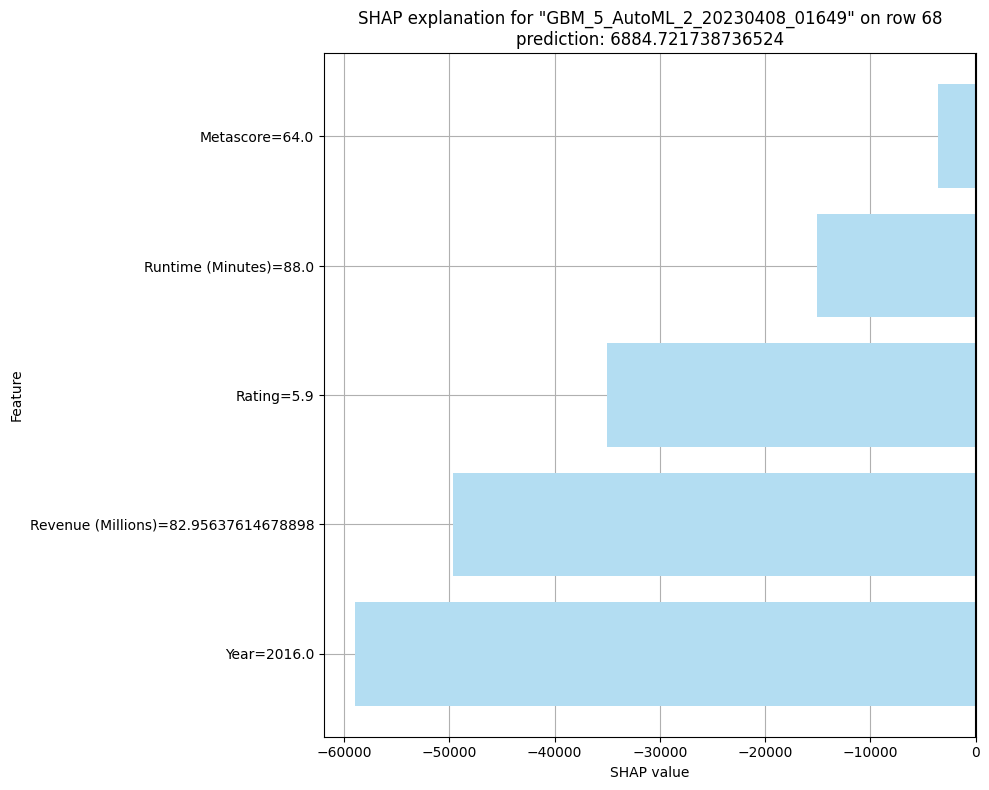

# Individual Conditional Expectation

> Individual conditional expectations (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response for a given row. ICE plot is similar to partial dependence plot (PDP), PDP shows the average effect of a feature while ICE plot shows the effect for a single instance.

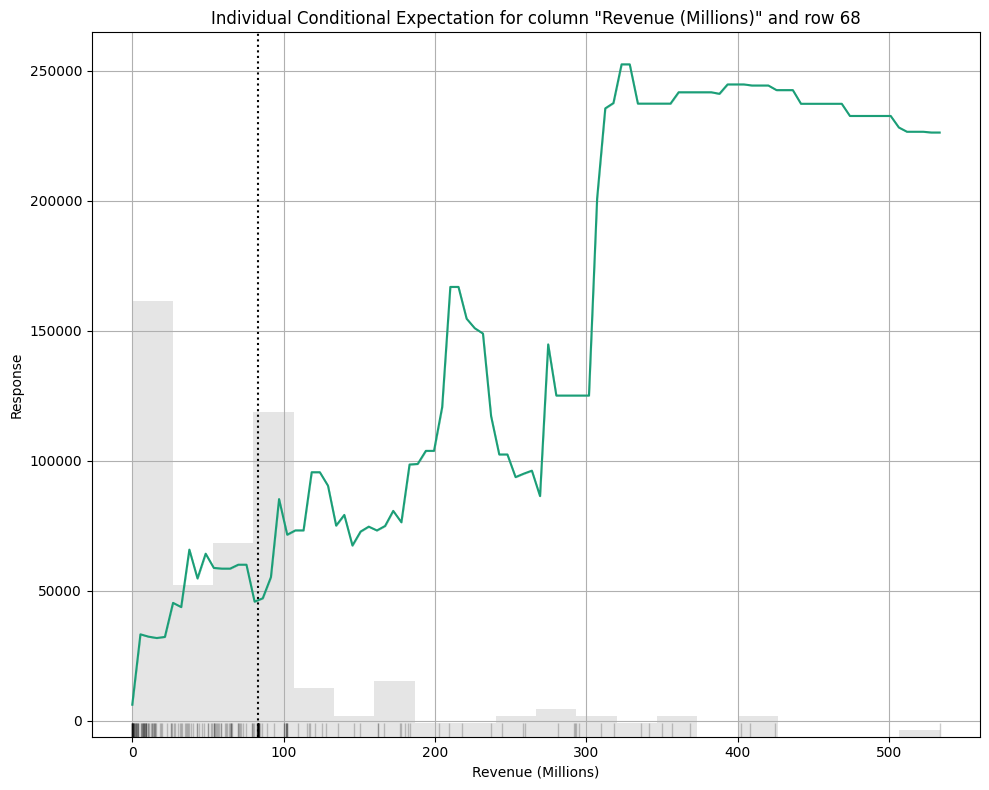

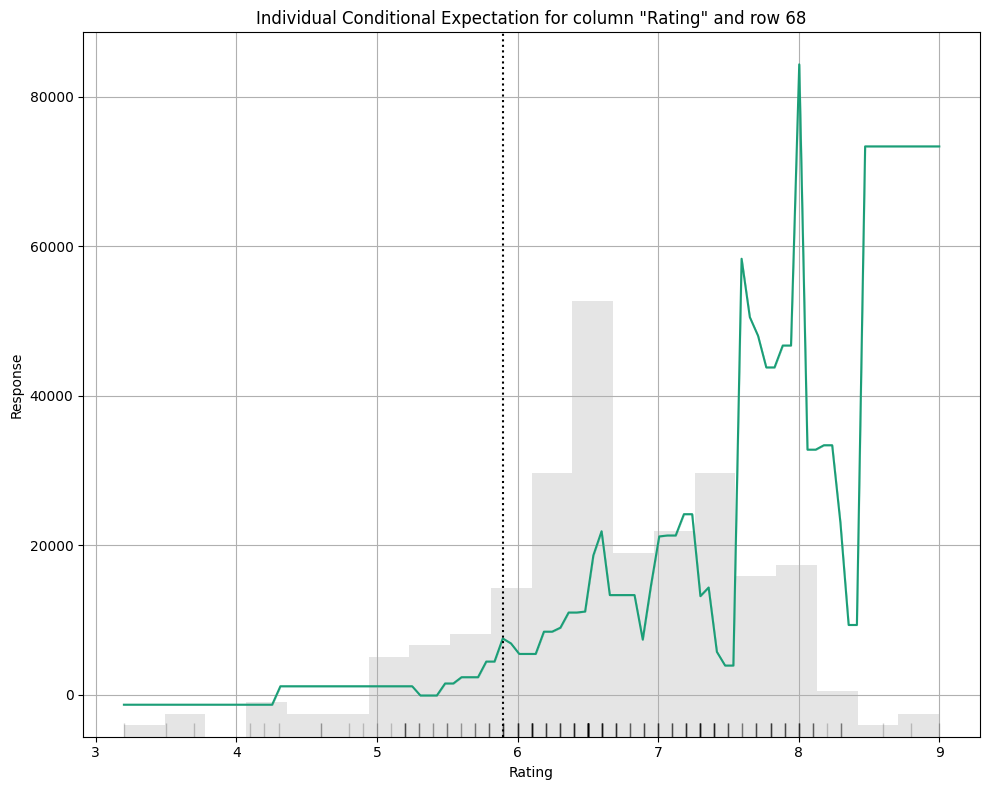

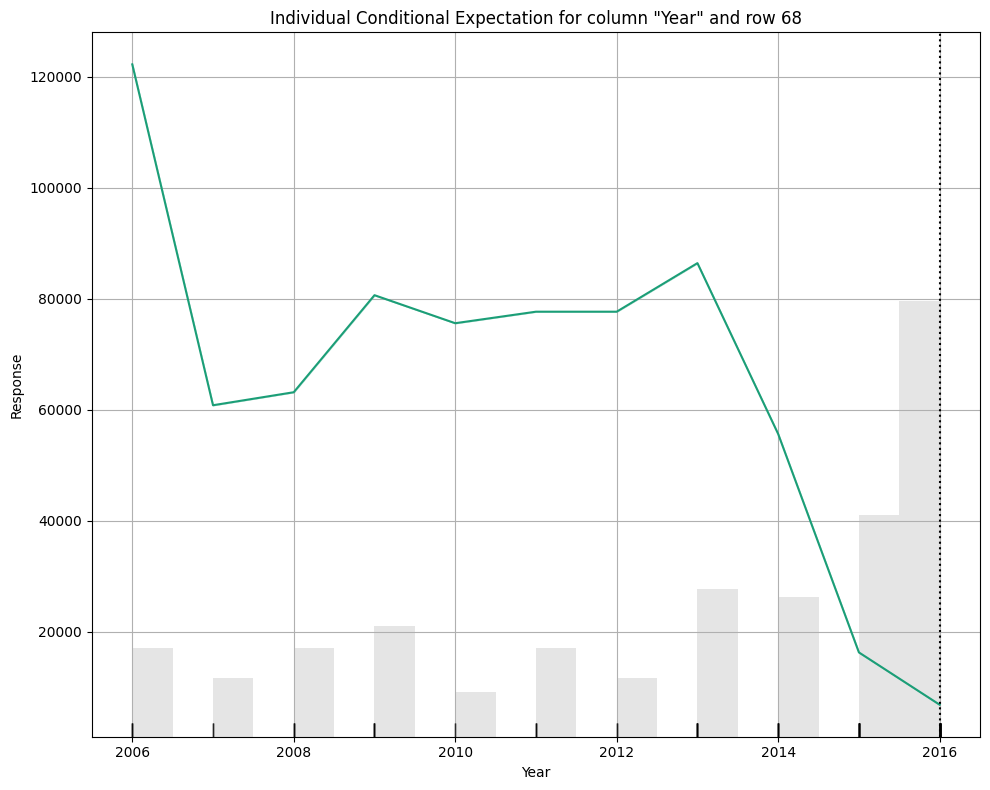

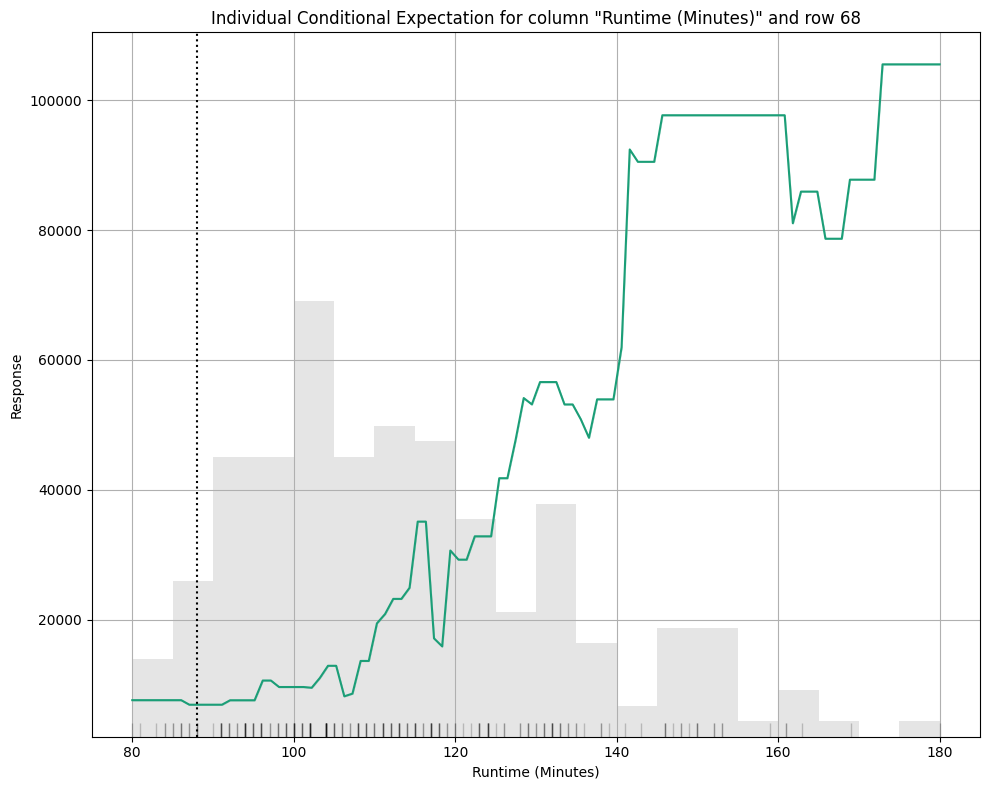

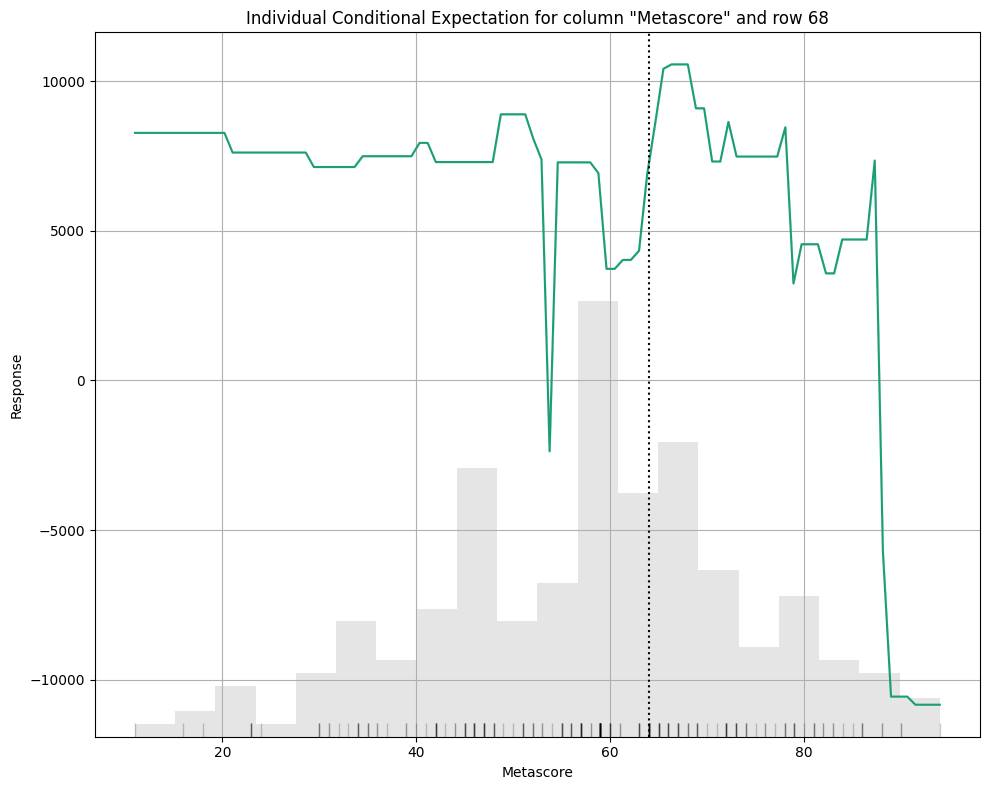

# SHAP Explanation

> SHAP explanation shows contribution of features for a given instance. The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function. H2O implements TreeSHAP which when the features are correlated, can increase contribution of a feature that had no influence on the prediction.

# Individual Conditional Expectation

> Individual conditional expectations (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response for a given row. ICE plot is similar to partial dependence plot (PDP), PDP shows the average effect of a feature while ICE plot shows the effect for a single instance.

In [149]:
autoML_model.explain_row(frame = hdf_test, row_index = 68, figsize = (10,8), exclude_explanations = "leaderboard")

# SHAP Explanation

> SHAP explanation shows contribution of features for a given instance. The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function. H2O implements TreeSHAP which when the features are correlated, can increase contribution of a feature that had no influence on the prediction.

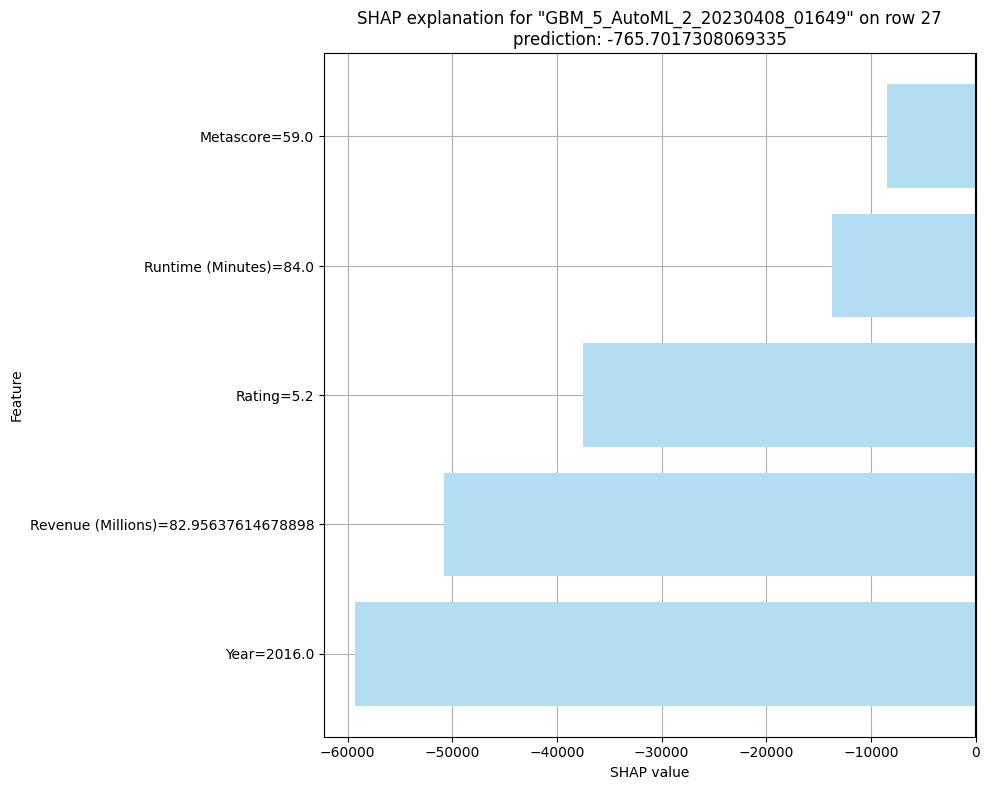

# Individual Conditional Expectation

> Individual conditional expectations (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response for a given row. ICE plot is similar to partial dependence plot (PDP), PDP shows the average effect of a feature while ICE plot shows the effect for a single instance.

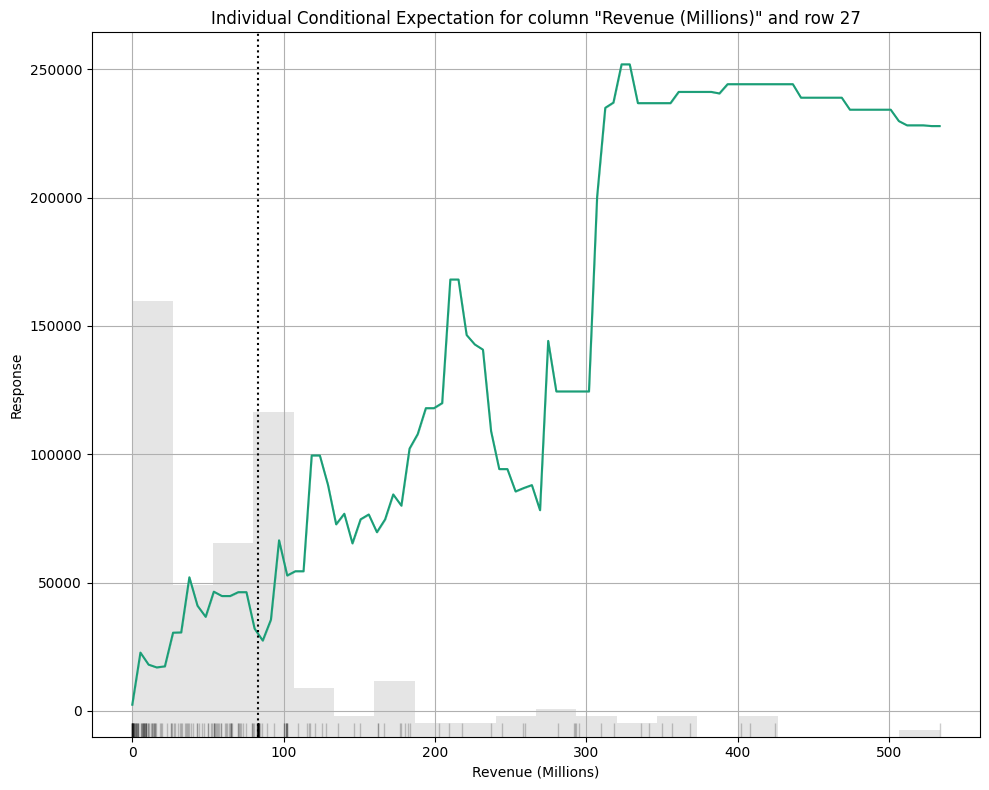

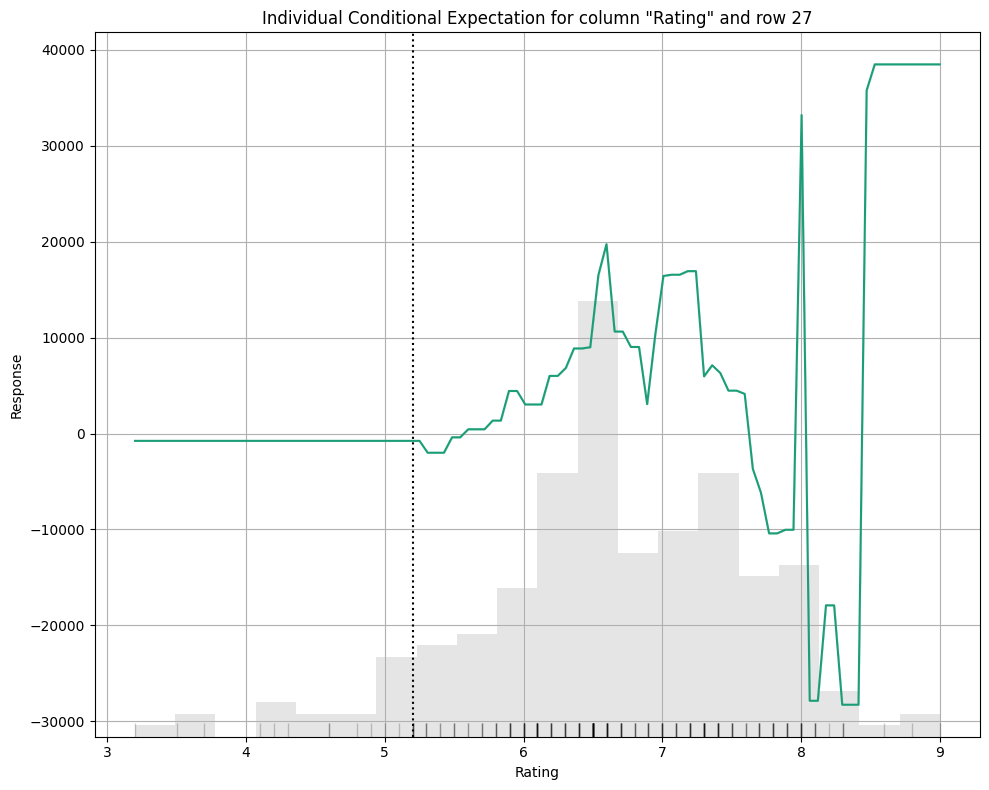

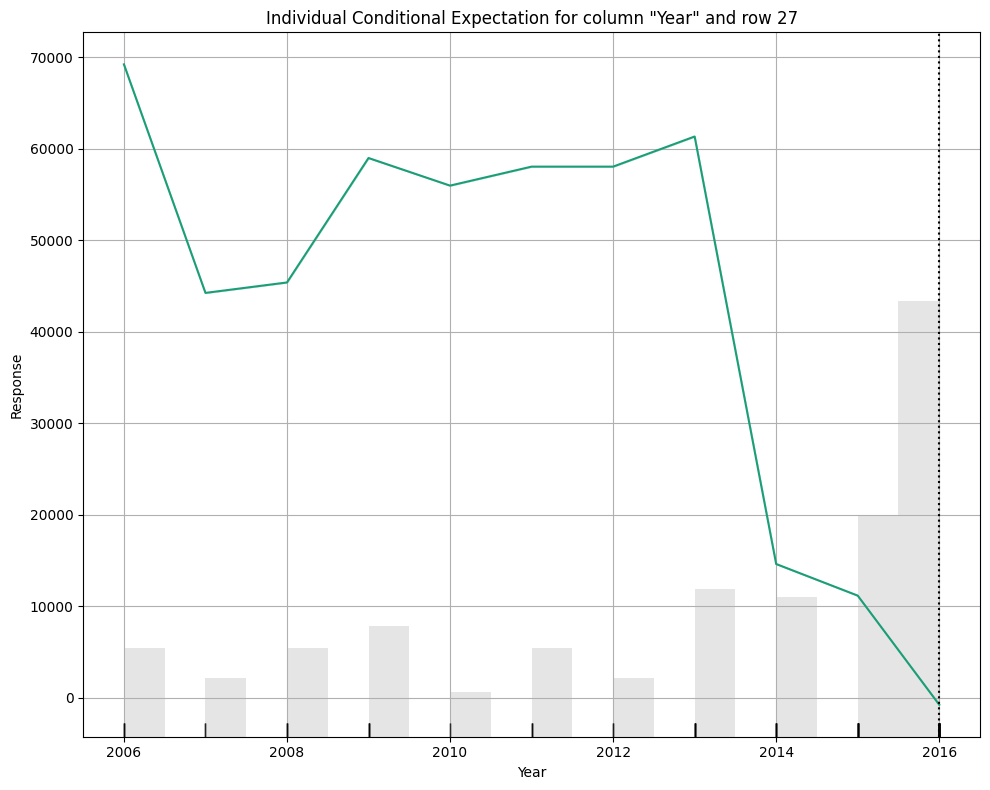

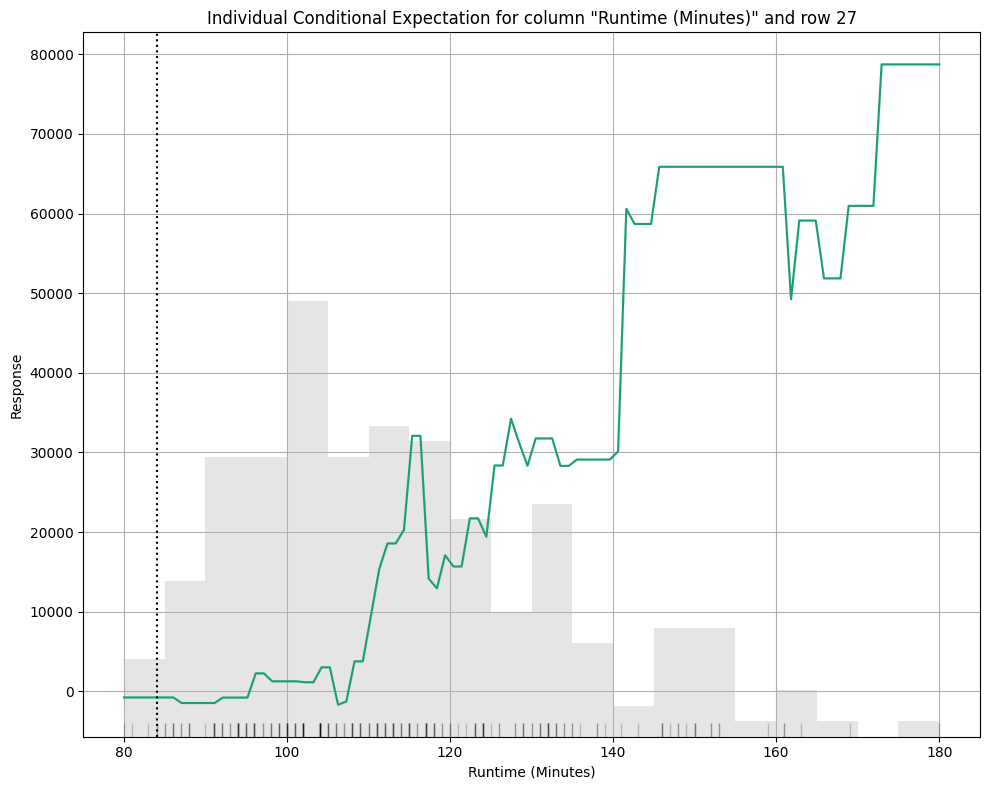

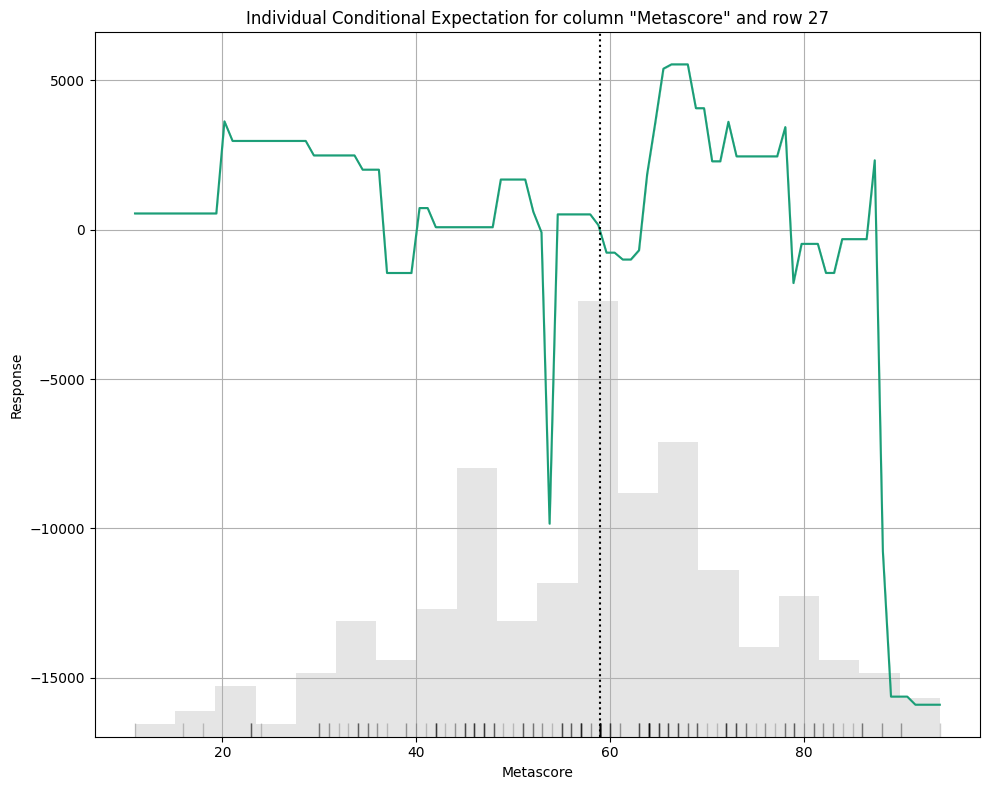

# SHAP Explanation

> SHAP explanation shows contribution of features for a given instance. The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function. H2O implements TreeSHAP which when the features are correlated, can increase contribution of a feature that had no influence on the prediction.

# Individual Conditional Expectation

> Individual conditional expectations (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response for a given row. ICE plot is similar to partial dependence plot (PDP), PDP shows the average effect of a feature while ICE plot shows the effect for a single instance.

In [150]:
autoML_model.explain_row(frame = hdf_test, row_index = 27, figsize = (10,8), exclude_explanations = "leaderboard")

**Comparision between SHAP, LIME, and Partial Dependence Plot Analysis**

Unlike LIME, SHAP does not necessarily build a local interpretable model but rather uses the black-box model to calculate the marginal contribution to the prediction for each feature and then relies on the theoretically sound game theory concept of Shapley values to calculate the feature importance. In this way, SHAP improves upon LIME due to its greater stability and lack of local linear model assumptions.

PDP gives the extent of effect a variable has on the output by freezing the rest of them
SHAP gives how much each variable contributes to the prediction
LIME is more like SHAP but a lite version of it - It takes the local region of the point of interest and gives us information about the contribution each variable has made to the output
We have to analyze our needs and then consider the tradeoff to select the best suitable interpretable method for the ML model

**Conclusion:**

In this notebook, I successfully performed data cleaning including imputing the null values in a dataset, plotting the graphs for collinearity, correlation. Used the Automl's H2O library to predict the best model, regularization and hyperparameter tuning. Learned how the shap and lime libraries are used to interpret shap values of a model. I fitted and ran shap analysis on linear model, random forest tree based model, a SVM model, MLP model and on AutoML. Examined the difference between shap, lime and PDP.

**REFERENCES:**

Professor's reference Notebook- https://github.com/aiskunks/YouTube/blob/main/A_Crash_Course_in_Statistical_Learning/Full_ML_Report/Wine-Quality-Analysis.ipynb  

StackOverflow- https://stackoverflow.com/questions/36489042/indexerror-index-10-is-out-of-bounds-for-axis-0-with-size-10 

TowardsDataScience- https://towardsdatascience.com/explain-any-models-with-the-shap-values-use-the-kernelexplainer-79de9464897a 

**LICENSE:**

MIT License

Copyright (c) 2023 Prarthna Nemade

Permission is hereby granted, free of charge, to any person obtaining a copy of this software and associated documentation files (the "Software"), to deal in the Software without restriction, including without limitation the rights to use, copy, modify, merge, publish, distribute, sublicense, and/or sell copies of the Software, and to permit persons to whom the Software is furnished to do so, subject to the following conditions:

The above copyright notice and this permission notice shall be included in all copies or substantial portions of the Software.

THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY, FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL THE AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING FROM, OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER DEALINGS IN THE SOFTWARE.